In [1]:
import numpy as np
import matplotlib.pyplot as plt
import traceback

In [2]:
meta = np.load('IJBC_backup.npz')

In [3]:
list(meta.keys())

['templates',
 'medias',
 'p1',
 'p2',
 'label',
 'img_names',
 'landmarks',
 'face_scores']

In [4]:
l = meta['label']
l.shape

(15658489,)

In [5]:
l[:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [13]:
import IJB_evals as IJB

In [14]:
from IPython.display import display

In [15]:
class Args:
    def __init__(self, subset='IJBC', is_bunch=False, restore_embs_left=None, restore_embs_right=None, fit_mapping=False, fit_flips=False, decay_coef=0.0, pre_template_map=False, is_rotation_map=True, is_procrustes=False, is_wahba=False, use_face_scores=False, explained_variance_proportion=1.0, save_result="IJB_result/{model_name}_{subset}.npz"):
        self.subset = subset
        self.is_bunch=is_bunch
        self.restore_embs_left = restore_embs_left
        self.restore_embs_right = restore_embs_right
        self.fit_mapping = fit_mapping
        self.fit_flips = fit_flips
        self.decay_coef = decay_coef
        self.pre_template_map = pre_template_map
        self.is_rotation_map = is_rotation_map
        self.is_procrustes = is_procrustes
        self.is_wahba = is_wahba
        self.explained_variance_proportion = explained_variance_proportion
        self.save_result = save_result
        self.save_embeddings = False
        self.model_file = None
        self.data_path = './'
        self.batch_size=64
        self.save_label=False
        self.force_reload=False
        self.is_one_2_N=False
        self.use_face_scores=use_face_scores
        self.plot_only=None
        self.n_individuals=-1
        self.explained_variance_proportion=1.0
        self.print_log=False
    def __str__(self):
        return str(self.__class__) + ": " + str(self.__dict__)

In [16]:
dataframes = {}
fit_flips = False
decay_coef = 0.0
pre_template_map= True
is_rotation_map = True

In [17]:
embs_list = [('/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'MS1MV2', 'ResNet100', 'ArcFace'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'VGGFace2', 'ResNet50', 'ArcFace'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'Glint360k', 'ResNet100', 'PartialFC_r0.1'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'Glint360k', 'ResNet100', 'PartialFC_r1.0'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'MS1M', 'ResNet50', 'ArcFace'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'MS1M', 'MobileNetV2', 'ArcFace'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'VGGFace2', 'InceptionResNetV1', 'CenterLoss'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'CASIA-WebFace', 'InceptionResNetV1', 'CenterLoss'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'MS1M', '64-CNN', 'SphereFace+PFE'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'CASIA-WebFace', '64-CNN', 'SphereFace+PFE')]

# ~~cache maps~~

In [7]:
import map_tools

In [8]:
import importlib
importlib.reload(IJB)
importlib.reload(map_tools)

<module 'map_tools' from '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/map_tools.py'>

# eval maps

In [9]:
dataframes = {}
fit_flips = False
decay_coef = 0.001
pre_template_map= True
is_rotation_map = True

<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz



>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.4672%)]


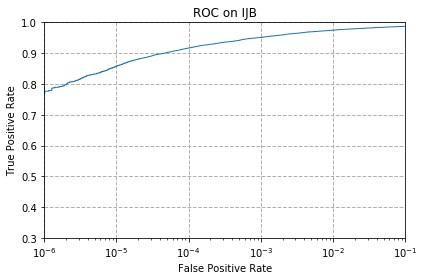

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.776653,0.858312,0.916552,0.951117,0.974843,0.987575,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes (AUC = 99.5661%)]


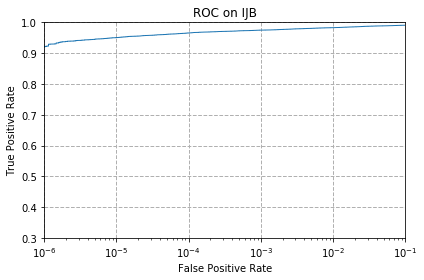

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes,0.922125,0.950708,0.965639,0.974843,0.983075,0.990796,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/po


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes (AUC = 99.4809%)]


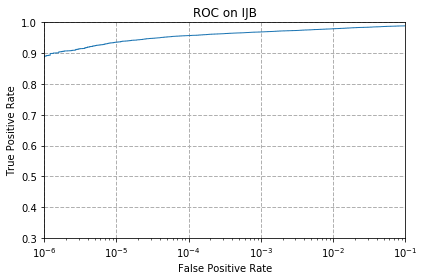

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes,0.891088,0.935982,0.957151,0.969065,0.979291,0.988955,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes (AUC = 98.9280%)]


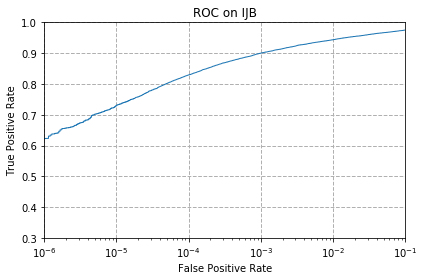

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes,0.623102,0.730276,0.829319,0.900087,0.943856,0.97515,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 97.9505%)]


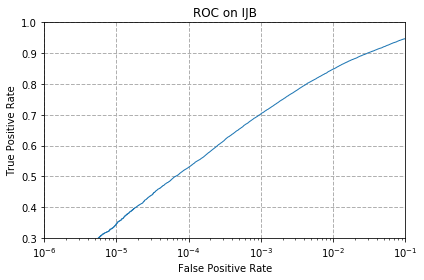

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes,0.179731,0.345759,0.529427,0.702971,0.848238,0.947691,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightfa


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 98.1029%)]


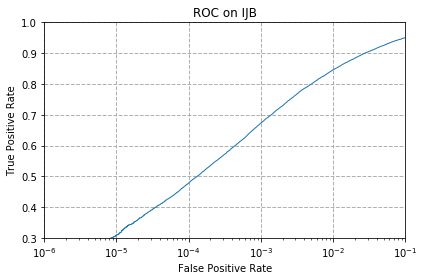

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes,0.192105,0.308074,0.478192,0.673007,0.845938,0.950606,MS1MV2,ResNet100,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes (AUC = 98.2569%)]


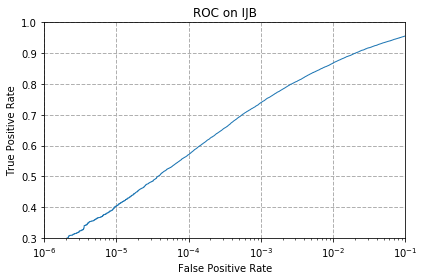

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes,0.258424,0.404612,0.570589,0.739531,0.86818,0.956282,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/re


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 99.3149%)]


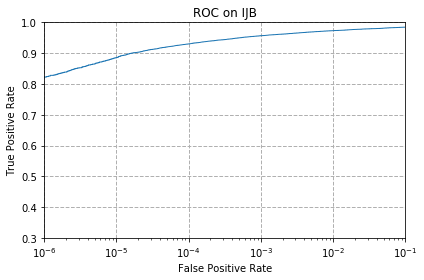

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.822774,0.885412,0.930051,0.956844,0.973258,0.98466,MS1MV2,ResNet100,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings fro


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 99.1331%)]


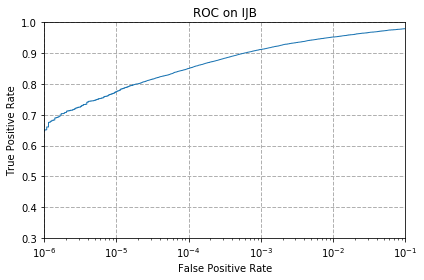

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.651276,0.774965,0.850437,0.912154,0.952498,0.979905,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 99.4927%)]


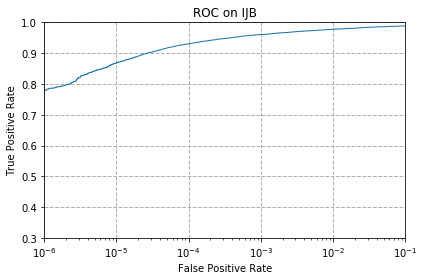

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.779976,0.868282,0.93092,0.960423,0.977604,0.988955,VGGFace2,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes (AUC = 99.5783%)]


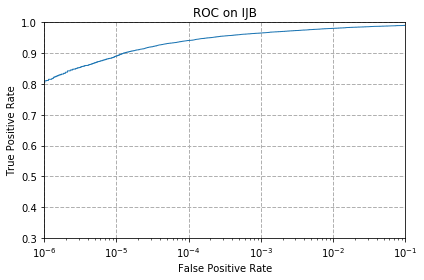

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes,0.810452,0.890883,0.941402,0.965639,0.980723,0.990438,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tb


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes (AUC = 99.4336%)]


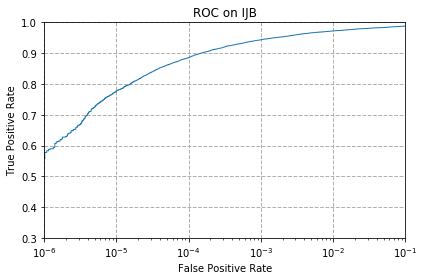

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes,0.577798,0.777522,0.88577,0.943856,0.972388,0.987984,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluati


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes (AUC = 99.3240%)]


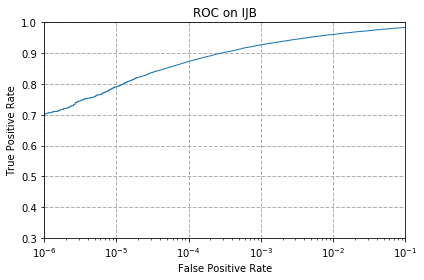

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes,0.70384,0.790919,0.873447,0.927034,0.961037,0.983893,VGGFace2,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluatio


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 99.0590%)]


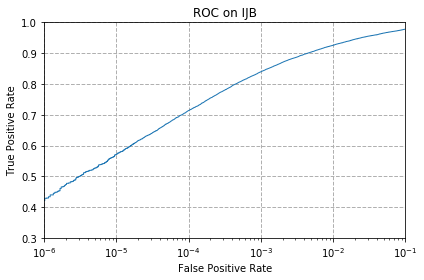

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes,0.429002,0.570895,0.713862,0.839546,0.925807,0.97786,VGGFace2,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evalua


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 99.4682%)]


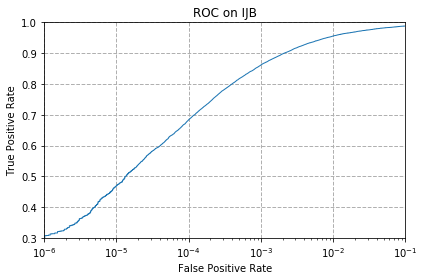

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes,0.307665,0.470062,0.683131,0.861482,0.955975,0.988393,VGGFace2,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluati


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes (AUC = 99.2639%)]


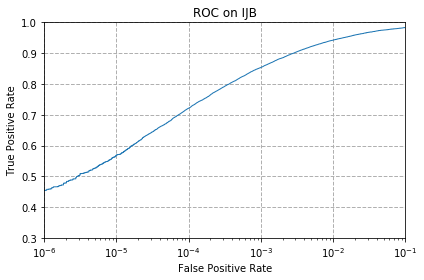

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes,0.454978,0.568441,0.721379,0.853659,0.942578,0.98328,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobac


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 99.2592%)]


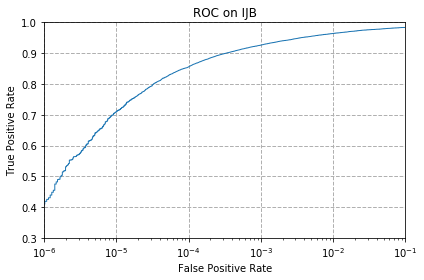

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.419083,0.71018,0.855602,0.926318,0.964156,0.983689,VGGFace2,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 99.3809%)]


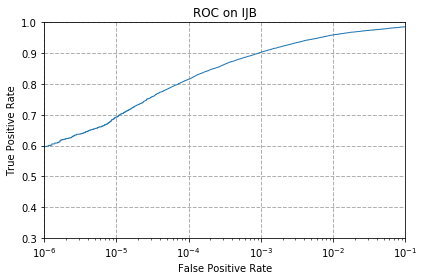

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.597126,0.692489,0.815667,0.902695,0.95935,0.985836,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 99.5411%)]


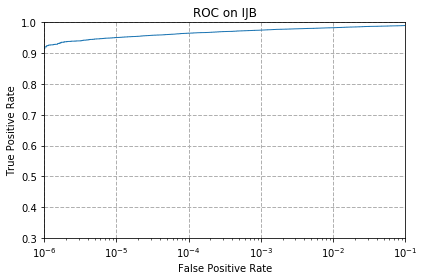

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.920796,0.95081,0.965025,0.974945,0.982768,0.989978,Glint360k,ResNet100,PartialFC_r0.1,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.5420%)]


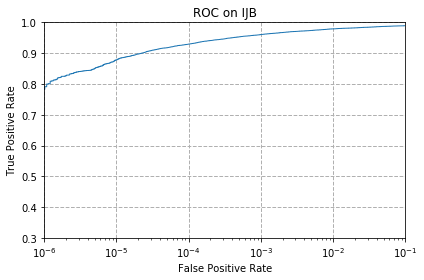

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.791277,0.8781,0.929488,0.960423,0.979087,0.989364,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/model


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_procrustes (AUC = 99.5762%)]


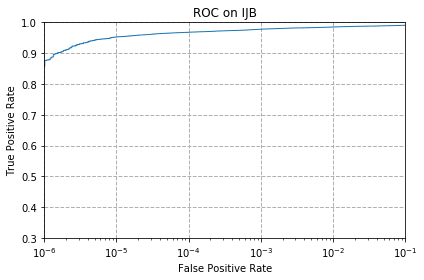

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_procrustes,0.876413,0.952498,0.967991,0.97786,0.985069,0.990694,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_procrustes (AUC = 99.0889%)]


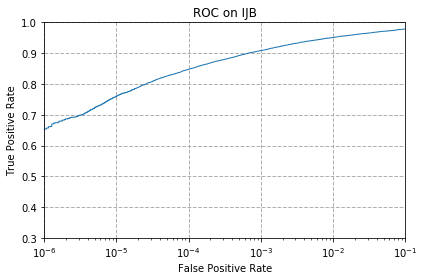

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_procrustes,0.654344,0.760188,0.847574,0.908779,0.950964,0.978678,Glint360k,ResNet100,PartialFC_r0.1,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 98.1400%)]


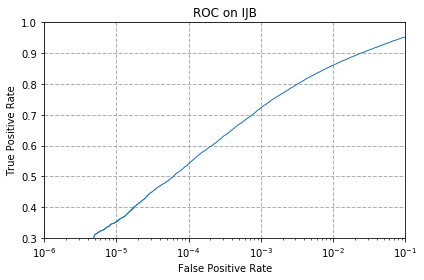

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_procrustes,0.206473,0.352355,0.540932,0.722555,0.860919,0.953009,Glint360k,ResNet100,PartialFC_r0.1,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_resu


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 97.9635%)]


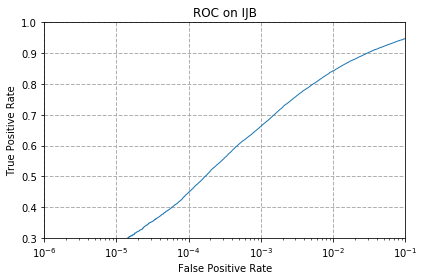

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_procrustes,0.174106,0.273406,0.448228,0.662525,0.842614,0.948049,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_procrustes (AUC = 98.3383%)]


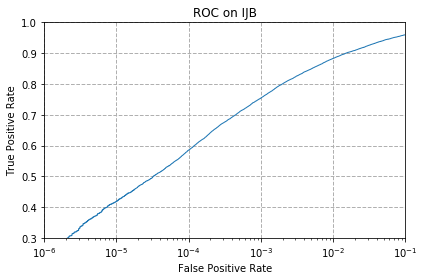

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_procrustes,0.260265,0.418827,0.585366,0.754359,0.883162,0.960168,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 99.3783%)]


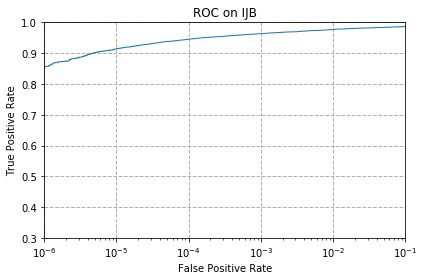

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.857238,0.913995,0.945237,0.96344,0.977041,0.986757,Glint360k,ResNet100,PartialFC_r0.1,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 99.2623%)]


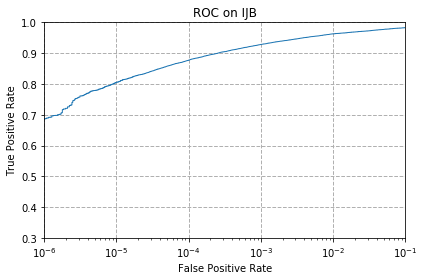

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.687682,0.805134,0.877077,0.928363,0.962775,0.982922,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 99.4147%)]


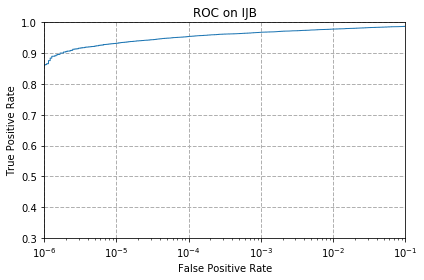

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.863067,0.932096,0.954236,0.967889,0.978269,0.987319,Glint360k,ResNet100,PartialFC_r1.0,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.3579%)]


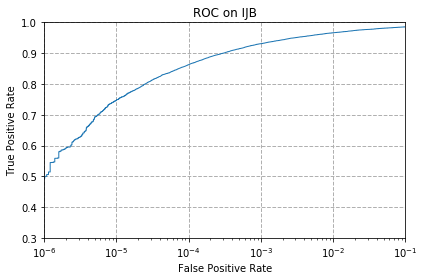

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.50023,0.746791,0.862709,0.930971,0.966355,0.985683,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/model


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_procrustes (AUC = 99.5860%)]


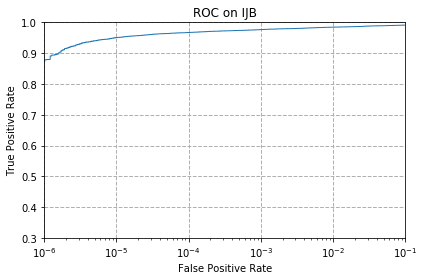

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_procrustes,0.878765,0.950453,0.967326,0.976581,0.984507,0.991307,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_procrustes (AUC = 98.5560%)]


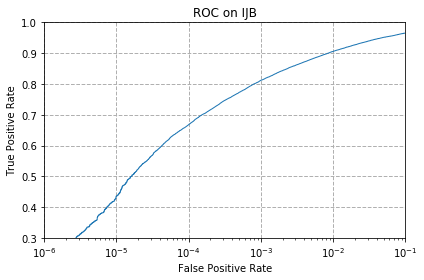

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_procrustes,0.224625,0.435701,0.667587,0.811934,0.905558,0.965383,Glint360k,ResNet100,PartialFC_r1.0,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 96.4195%)]


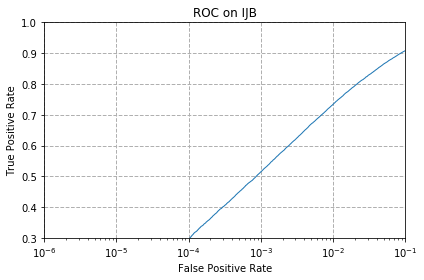

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_procrustes,0.016209,0.095669,0.295188,0.514956,0.73452,0.90837,Glint360k,ResNet100,PartialFC_r1.0,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_resu


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 95.4629%)]


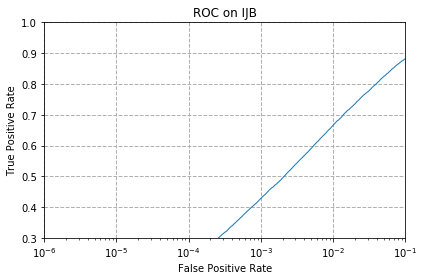

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_procrustes,0.016669,0.070001,0.215473,0.428593,0.666258,0.882395,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_procrustes (AUC = 97.0017%)]


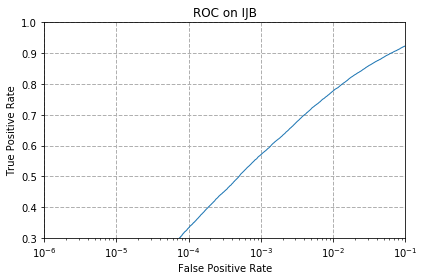

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_procrustes,0.035997,0.136217,0.332771,0.570589,0.777471,0.923812,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 99.2847%)]


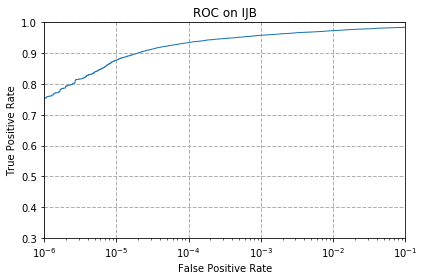

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.755126,0.877691,0.934601,0.958174,0.973309,0.984456,Glint360k,ResNet100,PartialFC_r1.0,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 98.8990%)]


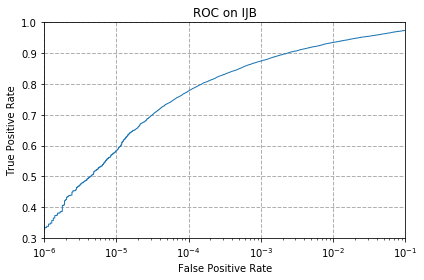

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.334305,0.583576,0.777829,0.874572,0.935062,0.974025,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-t


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 99.1804%)]


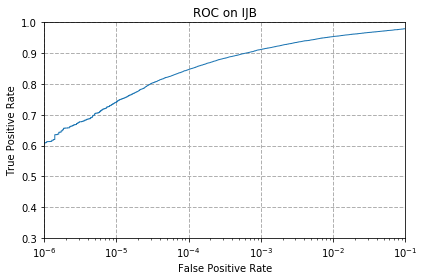

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.609756,0.74132,0.847062,0.912256,0.953981,0.979547,MS1M,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.4291%)]


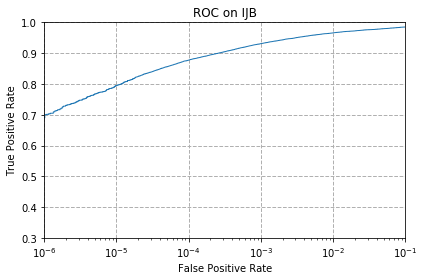

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.700465,0.794856,0.877282,0.931124,0.96615,0.98512,MS1M,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_re


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_procrustes (AUC = 99.2306%)]


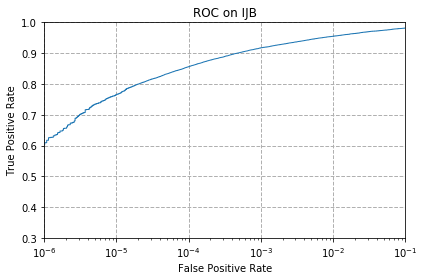

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_procrustes,0.609449,0.765864,0.856113,0.91737,0.955003,0.981695,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy



>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_procrustes (AUC = 98.8486%)]


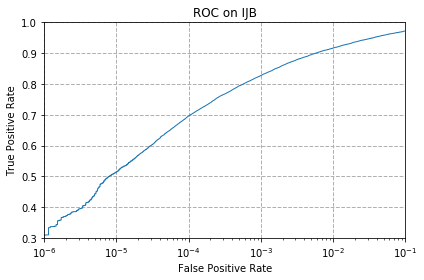

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_procrustes,0.30971,0.514649,0.696017,0.827376,0.916705,0.972491,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy
>>>> Reload (right) embeddings fr


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 98.8944%)]


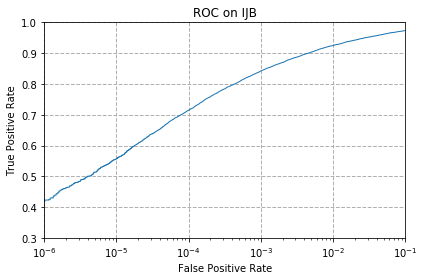

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_procrustes,0.42302,0.556987,0.71468,0.842512,0.924988,0.973718,MS1M,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy
>>>> Reload (right) embedding


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 99.1887%)]


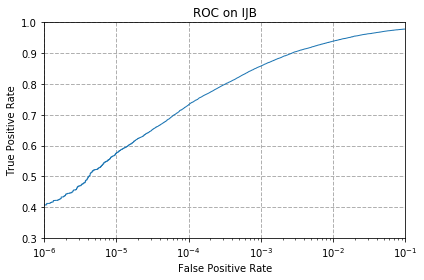

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_procrustes,0.40768,0.575906,0.732883,0.858414,0.939203,0.978627,MS1M,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy
>>>> Reload (right) embeddings 


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_procrustes (AUC = 98.9882%)]


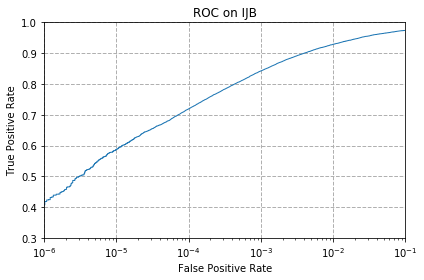

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_procrustes,0.418469,0.587667,0.719282,0.842409,0.928926,0.974229,MS1M,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 98.8148%)]


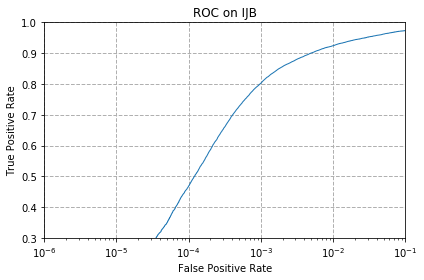

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.036662,0.136013,0.468119,0.802373,0.924324,0.973616,MS1M,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 99.0632%)]


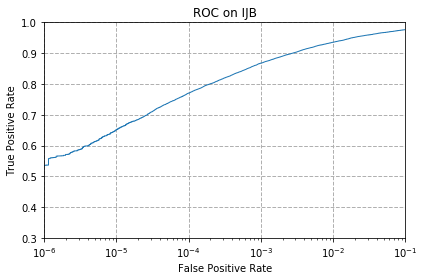

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.536381,0.651327,0.770312,0.867771,0.935675,0.976632,MS1M,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 98.4877%)]


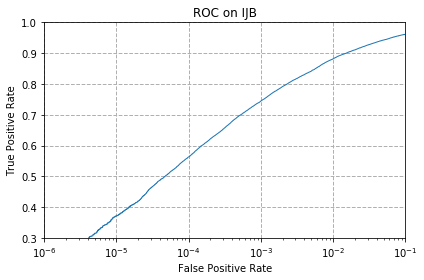

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.16434,0.371887,0.563277,0.744593,0.881884,0.961548,MS1M,MobileNetV2,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_em


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.2605%)]


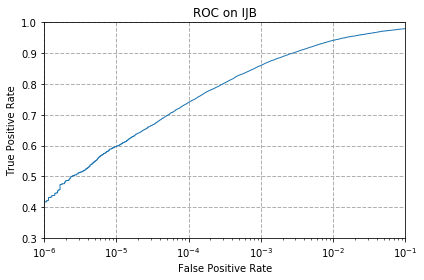

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.417549,0.597996,0.740349,0.859897,0.941709,0.979751,MS1M,MobileNetV2,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_procrustes (AUC = 98.5682%)]


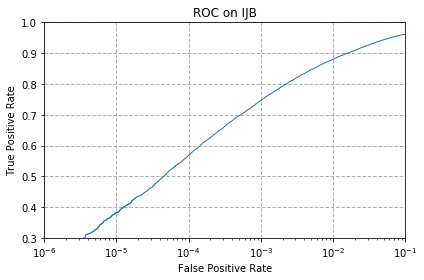

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_procrustes,0.23388,0.38196,0.569157,0.746945,0.880299,0.96206,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy
>>>>


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_procrustes (AUC = 97.3651%)]


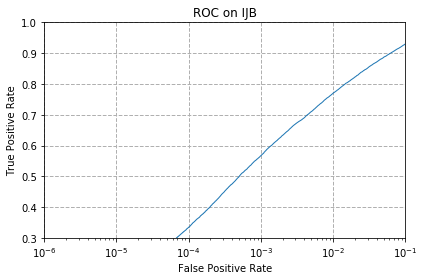

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_procrustes,0.053076,0.143376,0.334458,0.567163,0.770261,0.930357,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy
>>>> Reload (right) embeddings from


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_procrustes (AUC = 99.0395%)]


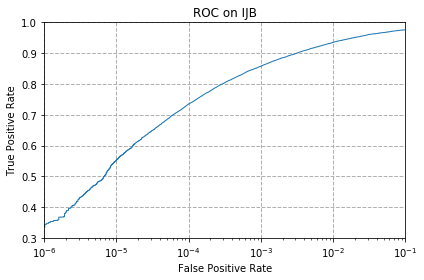

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_procrustes,0.344685,0.553664,0.735082,0.8578,0.935368,0.97607,MS1M,MobileNetV2,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy
>>>> Reload (right) embeddings f


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 99.2849%)]


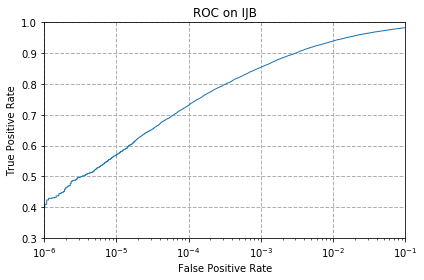

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_procrustes,0.409367,0.569515,0.730787,0.85417,0.93951,0.982768,MS1M,MobileNetV2,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy
>>>> Reload (right) embeddings from


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_procrustes (AUC = 99.0538%)]


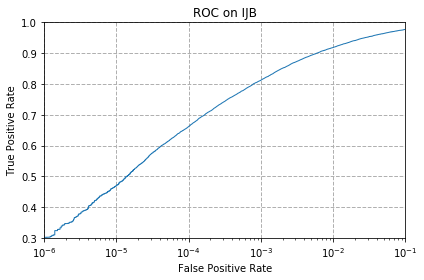

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_procrustes,0.302296,0.470011,0.661656,0.81219,0.918392,0.977093,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_em


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 97.6105%)]


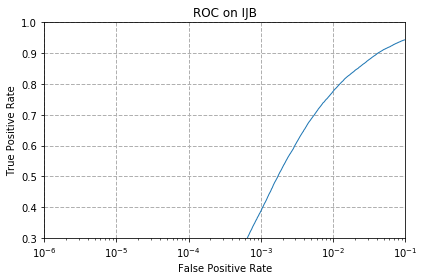

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.000102,0.003017,0.04832,0.387023,0.775937,0.944317,MS1M,MobileNetV2,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 98.6097%)]


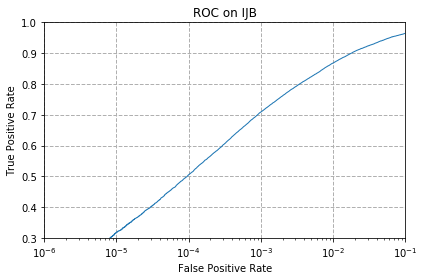

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.18239,0.318505,0.50519,0.709056,0.868385,0.964616,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 98.5104%)]


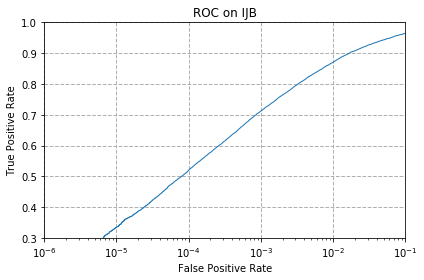

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.181981,0.334151,0.51966,0.71197,0.870583,0.964872,VGGFace2,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vgg


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.4620%)]


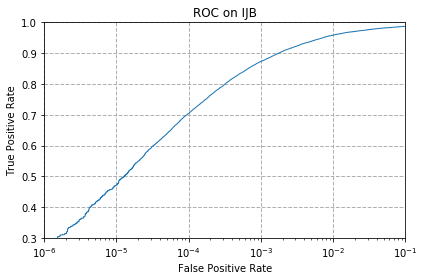

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.276014,0.471442,0.704198,0.873191,0.958634,0.987779,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ij


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes (AUC = 98.3046%)]


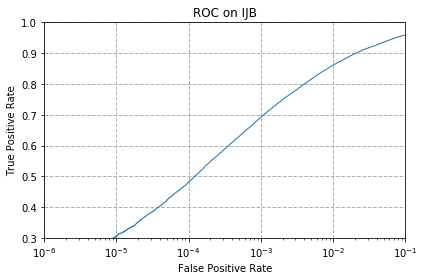

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes,0.162908,0.307409,0.481771,0.692233,0.861635,0.959503,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes (AUC = 96.2270%)]


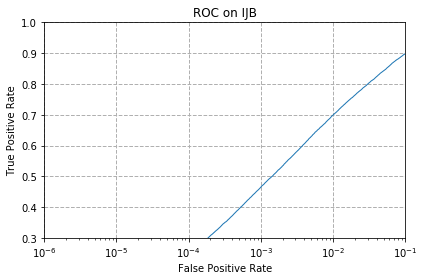

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes,0.034821,0.096232,0.248862,0.465153,0.699289,0.8984,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy
>>>> Reload (right) embeddi


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes (AUC = 99.0934%)]


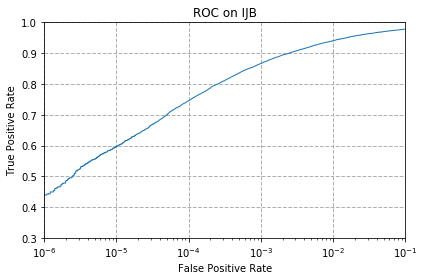

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes,0.439843,0.597484,0.745462,0.866544,0.94084,0.978422,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy
>>>> Reload (right) embeddin


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 99.1101%)]


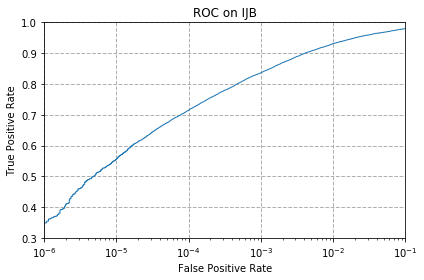

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes,0.349389,0.555913,0.715243,0.836325,0.931073,0.980109,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy
>>>> Reload (right) embeddings 


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_procrustes (AUC = 99.1979%)]


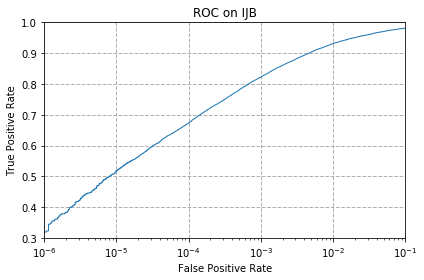

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_procrustes,0.319834,0.518433,0.673212,0.822212,0.931329,0.981643,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vgg


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 97.2585%)]


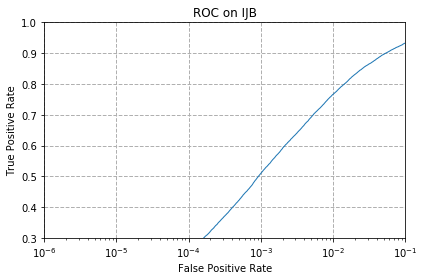

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.023879,0.088153,0.253771,0.509792,0.76658,0.933221,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/fac


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 98.8203%)]


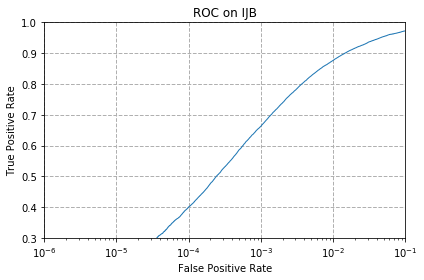

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.068313,0.199468,0.400726,0.662729,0.876617,0.97244,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/c


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 98.7858%)]


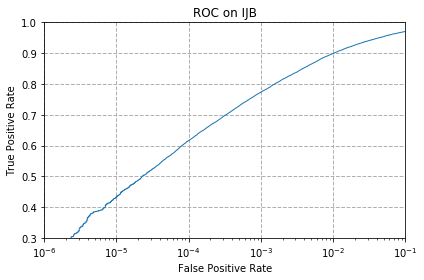

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.259958,0.432837,0.616454,0.773227,0.898911,0.970752,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ij


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.3864%)]


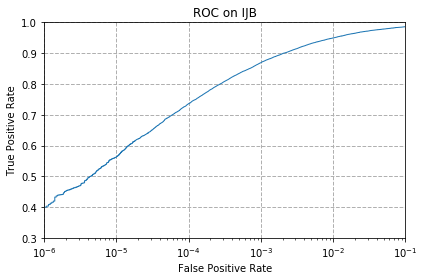

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.400368,0.563532,0.736156,0.869049,0.94943,0.986245,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy



>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes (AUC = 98.8144%)]


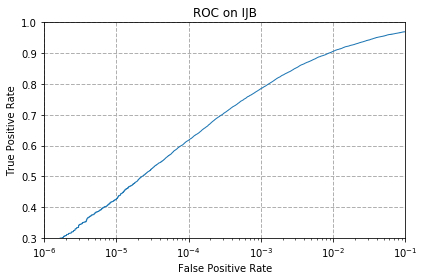

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes,0.256532,0.426446,0.617579,0.785039,0.906018,0.970036,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy
>>>> Rel


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes (AUC = 97.8878%)]


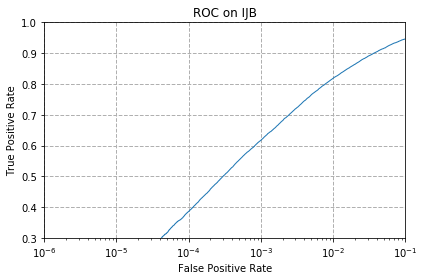

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes,0.091425,0.188577,0.386256,0.617119,0.81853,0.946413,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy
>>>> Reload (right) embeddings from: /s


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes (AUC = 99.0492%)]


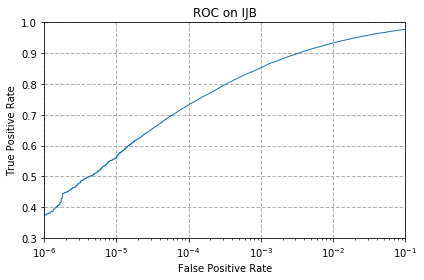

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes,0.375569,0.562101,0.732372,0.852994,0.933528,0.977655,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy
>>>> Reload (right) embeddings from: /s/


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 99.0315%)]


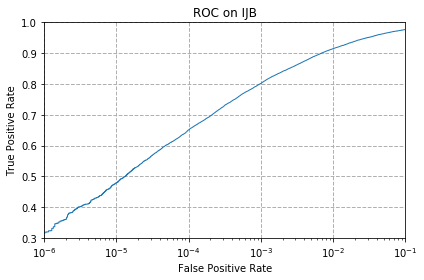

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes,0.318914,0.47947,0.650918,0.801708,0.914557,0.976837,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy
>>>> Reload (right) embeddings from: 


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 99.2641%)]


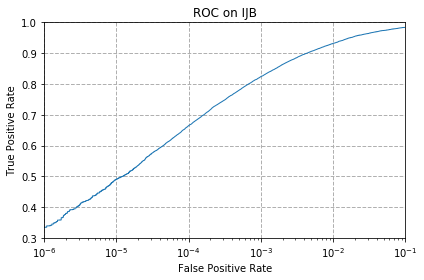

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_procrustes,0.335072,0.490617,0.664826,0.824104,0.93184,0.983944,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 98.1249%)]


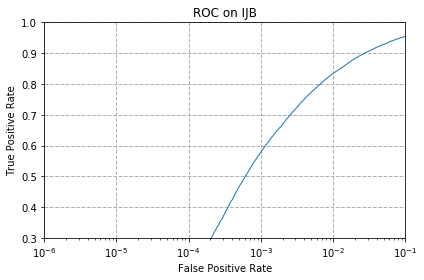

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.000665,0.011045,0.175538,0.578463,0.834586,0.954543,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casi


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 98.9184%)]


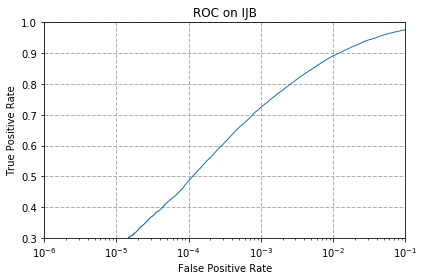

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.127269,0.274838,0.486271,0.724242,0.891292,0.976326,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 99.3269%)]


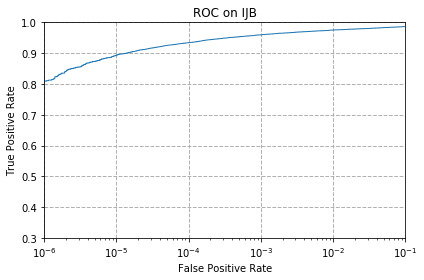

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.809787,0.893082,0.934346,0.959554,0.975354,0.986501,MS1M,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings f


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.3123%)]


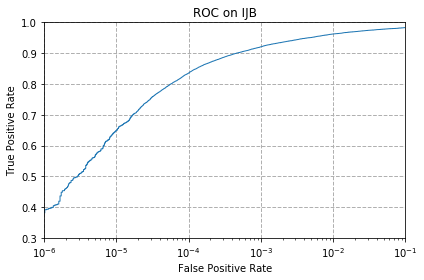

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.391931,0.649128,0.835404,0.920744,0.962315,0.983177,MS1M,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_procrustes (AUC = 99.4930%)]


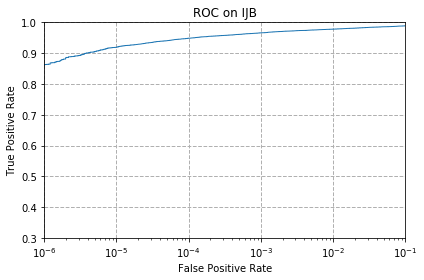

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_procrustes,0.863323,0.919262,0.948612,0.966099,0.978115,0.988853,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_procrustes (AUC = 99.4248%)]


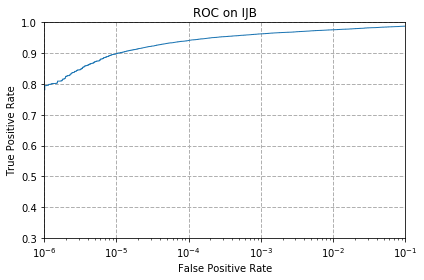

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_procrustes,0.794805,0.898604,0.941249,0.962673,0.97607,0.98783,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/P


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_procrustes (AUC = 98.7472%)]


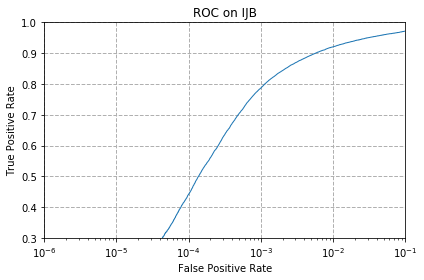

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_procrustes,0.034412,0.134888,0.442246,0.786982,0.920693,0.971621,MS1M,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/Pr


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 97.2762%)]


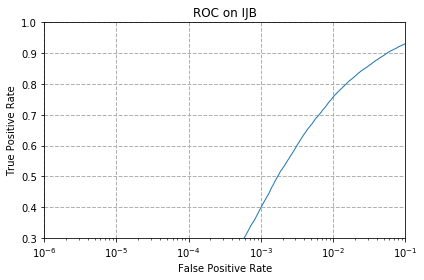

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_procrustes,0.000818,0.006647,0.067393,0.398374,0.757171,0.931329,MS1M,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 97.0429%)]


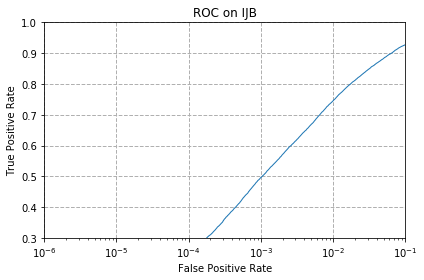

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_procrustes,0.013806,0.075727,0.244669,0.496242,0.745718,0.927596,MS1M,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/P


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_procrustes (AUC = 97.6812%)]


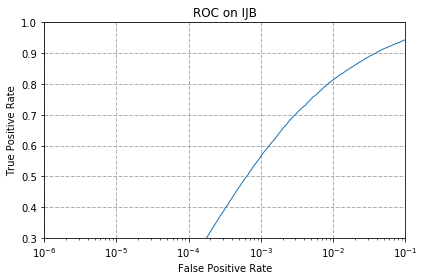

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_procrustes,0.002761,0.025669,0.215524,0.565475,0.813571,0.943498,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes (AUC = 99.0204%)]


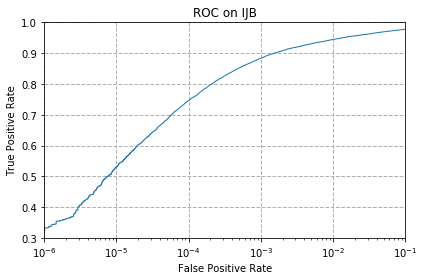

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes,0.332771,0.531216,0.746587,0.883776,0.944726,0.977911,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings f


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes (AUC = 99.2660%)]


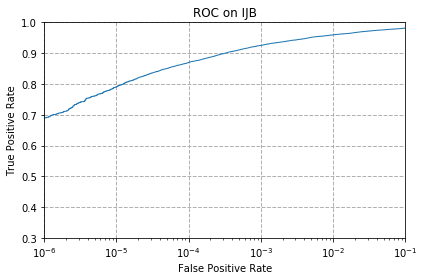

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes,0.690699,0.79051,0.869714,0.925346,0.959759,0.981746,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_procrustes (AUC = 99.4318%)]


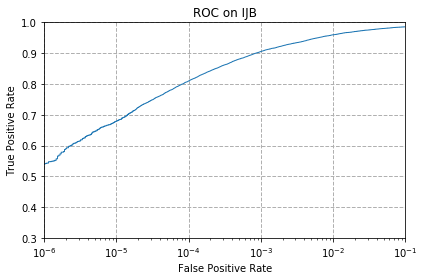

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.542057,0.678938,0.809685,0.905354,0.95981,0.985683,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/d


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_procrustes (AUC = 99.3967%)]


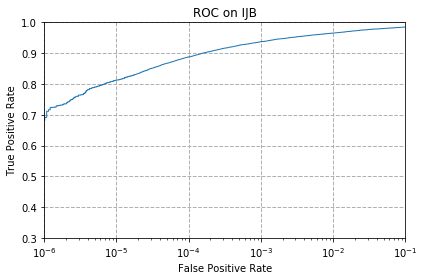

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_procrustes,0.691722,0.812446,0.887713,0.93726,0.965179,0.985018,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/port


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_procrustes (AUC = 99.1869%)]


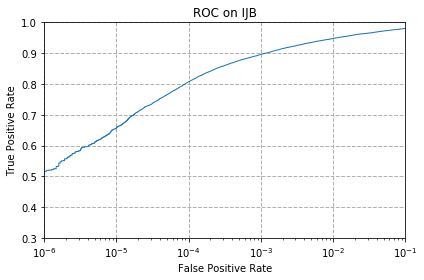

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_procrustes,0.517053,0.656645,0.806923,0.896099,0.947691,0.980518,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/Probabilistic


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_procrustes (AUC = 99.0379%)]


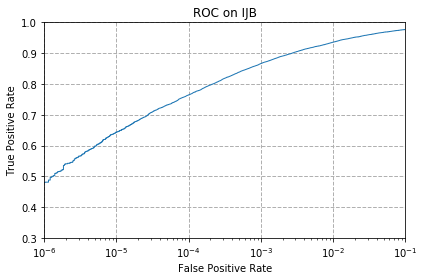

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_procrustes,0.481209,0.644015,0.764688,0.866391,0.93588,0.977041,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_procrustes (AUC = 98.4716%)]


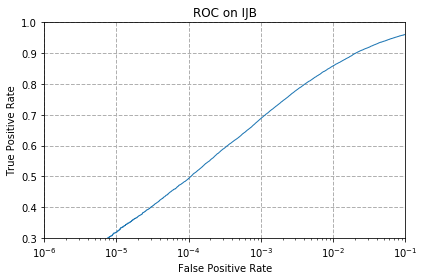

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_procrustes,0.203661,0.319118,0.493225,0.687989,0.858976,0.96119,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/Probabilist


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_procrustes (AUC = 98.8157%)]


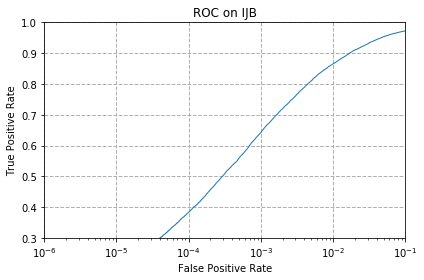

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_procrustes,0.08263,0.197474,0.38329,0.642379,0.865368,0.972491,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/Probabilistic


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_procrustes (AUC = 98.7524%)]


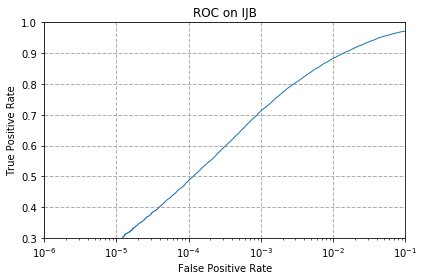

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_procrustes,0.156363,0.285933,0.487038,0.71243,0.883009,0.97203,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_procrustes.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes (AUC = 99.1242%)]


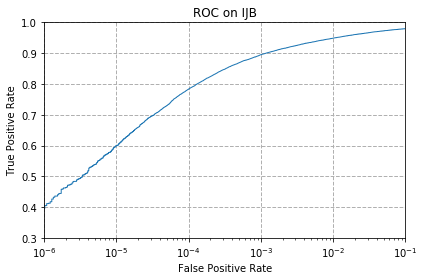

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes,0.405328,0.599274,0.783249,0.895178,0.948714,0.979649,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_procrustes.npz.csv


In [10]:
for left_embs, left_dataset, left_architecture, left_head in embs_list:
    for right_embs, right_dataset, right_architecture, right_head in embs_list:
        if left_embs == right_embs:
            fit_mapping=False
        else:
            fit_mapping=True

        try:
            #for pre_template_map in pre_template_map:
            save_result_name = '{}_TO_{}_procrustes'.format(left_embs.split('/')[-1].split('.')[0], right_embs.split('/')[-1].split('.')[0])
            save_result = '../../../../results/{}.npz'.format(save_result_name)
            args = Args(subset='IJBC',  
                is_bunch=False,
                restore_embs_left=left_embs,
                restore_embs_right=right_embs,
                fit_mapping=fit_mapping,
                fit_flips=fit_flips,
                decay_coef=decay_coef,
                pre_template_map=pre_template_map,
                is_rotation_map=is_rotation_map,
                is_procrustes=True,
                save_result=save_result)
            df, fig = IJB.main(args)
            df['L_DATASET'] = left_dataset
            df['L_ARCH'] = left_architecture
            df['L_HEAD'] = left_head
            df['R_DATASET'] = right_dataset
            df['R_ARCH'] = right_architecture
            df['R_HEAD'] = right_head
            display(df)
            dataframes[save_result_name] = df
            print('saving to', args.save_result + '.csv')
            df.to_csv(args.save_result + '.csv')
        except Exception:
            traceback.print_exc()

In [10]:
import pandas as pd

In [12]:
superdf = pd.concat([df for df in dataframes.values()])

In [13]:
superdf

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.776653,0.858312,0.916552,0.951117,0.974843,0.987575,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes,0.922125,0.950708,0.965639,0.974843,0.983075,0.990796,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes,0.891088,0.935982,0.957151,0.969065,0.979291,0.988955,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes,0.623102,0.730276,0.829319,0.900087,0.943856,0.975150,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes,0.179731,0.345759,0.529427,0.702971,0.848238,0.947691,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace
...,...,...,...,...,...,...,...,...,...,...,...,...
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_procrustes,0.481209,0.644015,0.764688,0.866391,0.935880,0.977041,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_procrustes,0.203661,0.319118,0.493225,0.687989,0.858976,0.961190,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_procrustes,0.082630,0.197474,0.383290,0.642379,0.865368,0.972491,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_procrustes,0.156363,0.285933,0.487038,0.712430,0.883009,0.972030,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


In [14]:
superdf.to_csv('../../../../results/ALL_aggregated_results_procrustes_1.0_v1.csv')

# use nosigma embeds from PFE

In [11]:
embs_list_nosigma = [('/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'MS1MV2', 'ResNet100', 'ArcFace'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'VGGFace2', 'ResNet50', 'ArcFace'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'Glint360k', 'ResNet100', 'PartialFC_r0.1'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'Glint360k', 'ResNet100', 'PartialFC_r1.0'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'MS1M', 'ResNet50', 'ArcFace'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'MS1M', 'MobileNetV2', 'ArcFace'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'VGGFace2', 'InceptionResNetV1', 'CenterLoss'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'CASIA-WebFace', 'InceptionResNetV1', 'CenterLoss'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'MS1M', '64-CNN', 'SphereFace+PFE'),
             ('/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'CASIA-WebFace', '64-CNN', 'SphereFace+PFE')]

<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_I


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.4672%)]


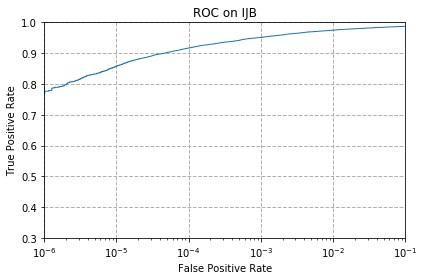

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.776653,0.858312,0.916552,0.951117,0.974843,0.987575,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 99.5661%)]


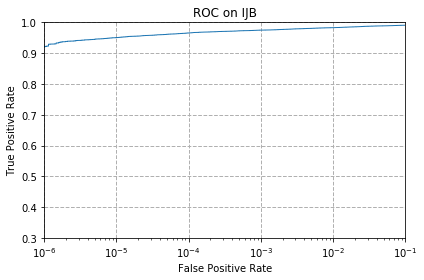

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes_nosigma,0.922125,0.950708,0.965639,0.974843,0.983075,0.990796,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 99.4809%)]


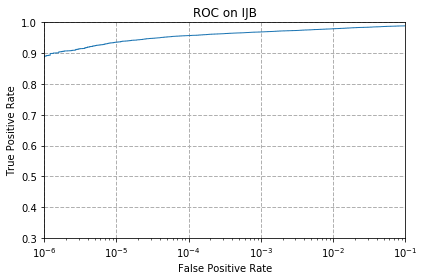

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes_nosigma,0.891088,0.935982,0.957151,0.969065,0.979291,0.988955,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mo


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 98.9280%)]


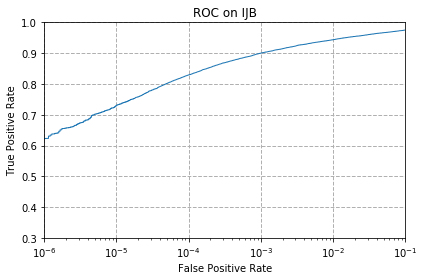

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.623102,0.730276,0.829319,0.900087,0.943856,0.97515,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mod


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 97.9505%)]


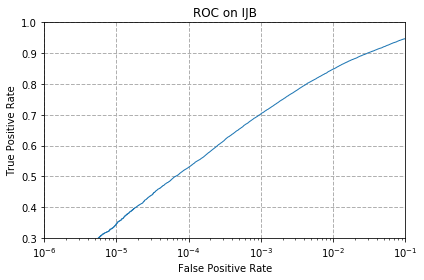

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.179731,0.345759,0.529427,0.702971,0.848238,0.947691,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 98.1029%)]


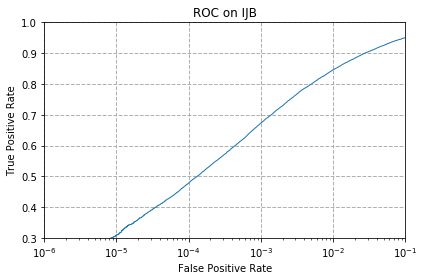

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.192105,0.308074,0.478192,0.673007,0.845938,0.950606,MS1MV2,ResNet100,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mo


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 98.2569%)]


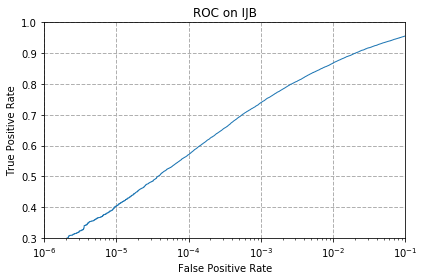

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.258424,0.404612,0.570589,0.739531,0.86818,0.956282,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Relo


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 99.3165%)]


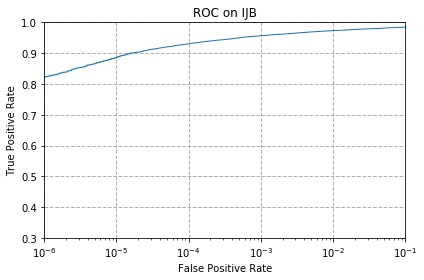

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.823184,0.885616,0.930409,0.956793,0.973309,0.984711,MS1MV2,ResNet100,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.n


>>>> plot roc and calculate tpr...
[../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 99.1346%)]


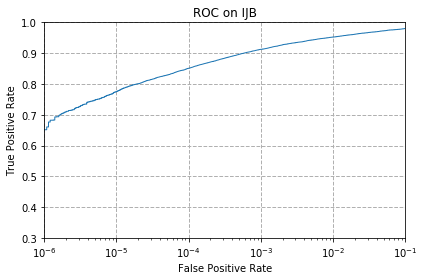

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.651531,0.774965,0.851051,0.912614,0.952396,0.980161,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (le


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 99.4927%)]


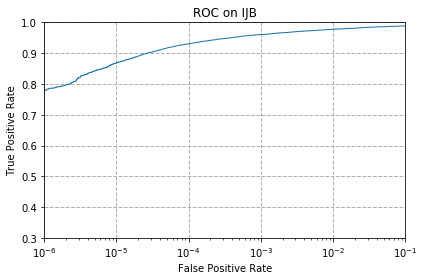

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.779976,0.868282,0.93092,0.960423,0.977604,0.988955,VGGFace2,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 99.5783%)]


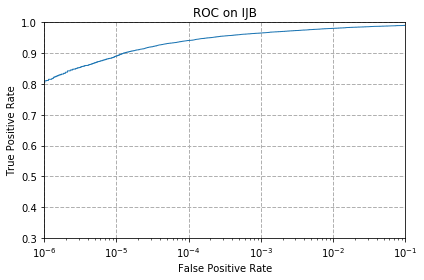

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes_nosigma,0.810452,0.890883,0.941402,0.965639,0.980723,0.990438,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 99.4336%)]


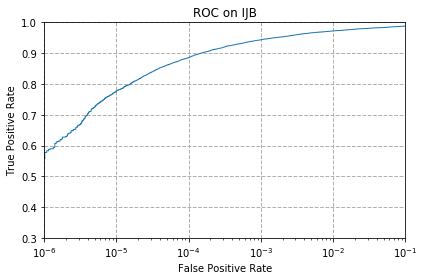

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes_nosigma,0.577798,0.777522,0.88577,0.943856,0.972388,0.987984,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insi


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 99.3240%)]


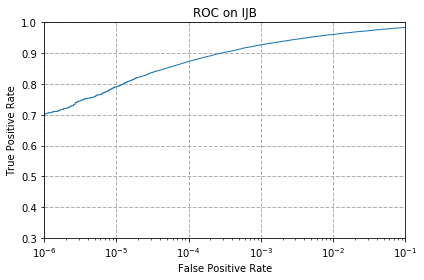

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.70384,0.790919,0.873447,0.927034,0.961037,0.983893,VGGFace2,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insig


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 99.0590%)]


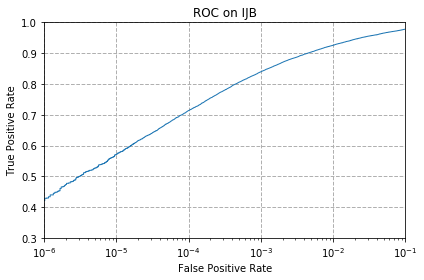

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.429002,0.570895,0.713862,0.839546,0.925807,0.97786,VGGFace2,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/in


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 99.4682%)]


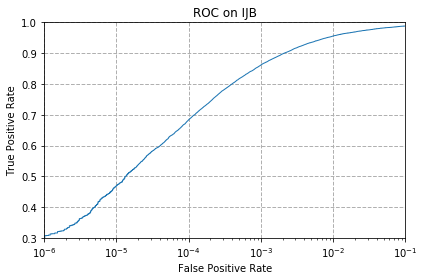

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.307665,0.470062,0.683131,0.861482,0.955975,0.988393,VGGFace2,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insi


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 99.2639%)]


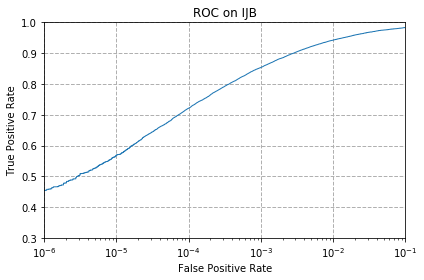

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.454978,0.568441,0.721379,0.853659,0.942578,0.98328,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left)


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 99.2620%)]


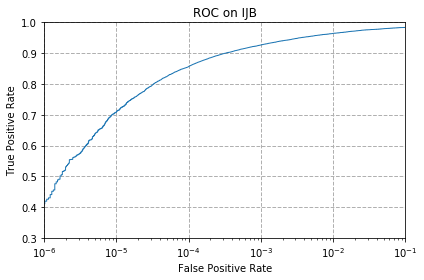

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.419594,0.709516,0.856726,0.926625,0.964463,0.98374,VGGFace2,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>


>>>> plot roc and calculate tpr...
[../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 99.3823%)]


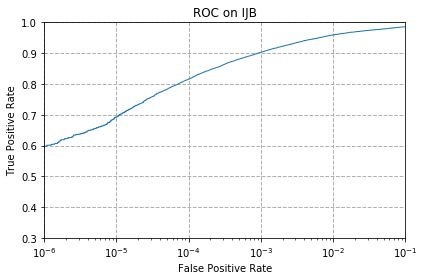

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.597996,0.69254,0.815923,0.903104,0.959401,0.985887,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddin


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 99.5411%)]


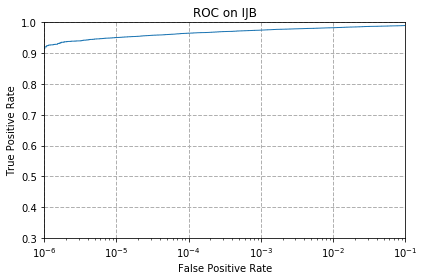

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.920796,0.95081,0.965025,0.974945,0.982768,0.989978,Glint360k,ResNet100,PartialFC_r0.1,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.5420%)]


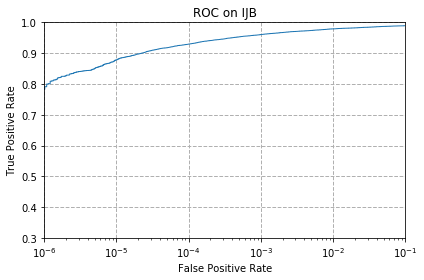

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.791277,0.8781,0.929488,0.960423,0.979087,0.989364,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/port


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 99.5762%)]


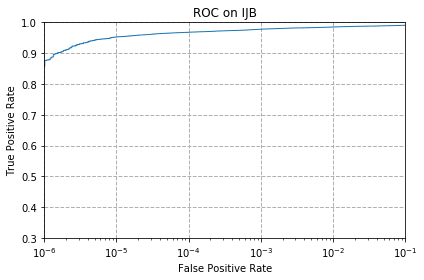

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_procrustes_nosigma,0.876413,0.952498,0.967991,0.97786,0.985069,0.990694,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluatio


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 99.0889%)]


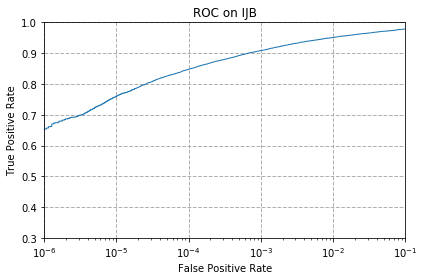

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.654344,0.760188,0.847574,0.908779,0.950964,0.978678,Glint360k,ResNet100,PartialFC_r0.1,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 98.1400%)]


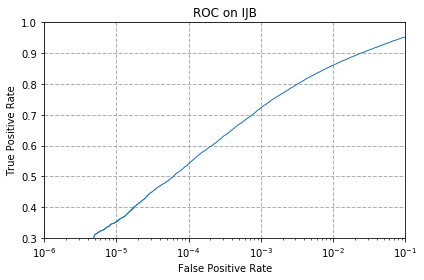

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.206473,0.352355,0.540932,0.722555,0.860919,0.953009,Glint360k,ResNet100,PartialFC_r0.1,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluat


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 97.9635%)]


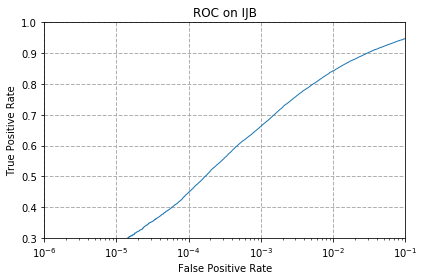

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.174106,0.273406,0.448228,0.662525,0.842614,0.948049,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluatio


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 98.3383%)]


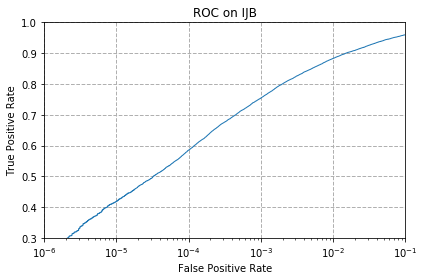

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.260265,0.418827,0.585366,0.754359,0.883162,0.960168,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from:


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 99.3800%)]


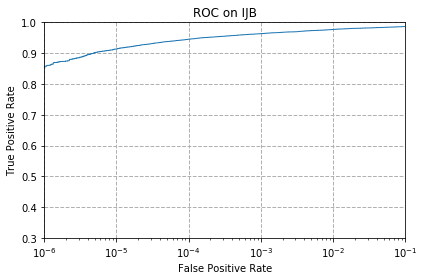

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.8578,0.913586,0.945339,0.963389,0.977093,0.986654,Glint360k,ResNet100,PartialFC_r0.1,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 99.2619%)]


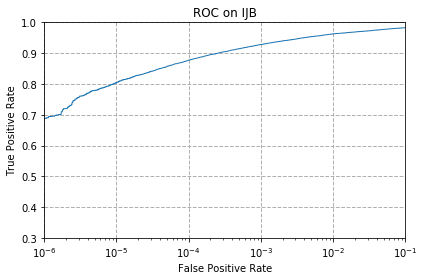

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.688807,0.804674,0.877333,0.928056,0.962724,0.982768,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from:


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 99.4147%)]


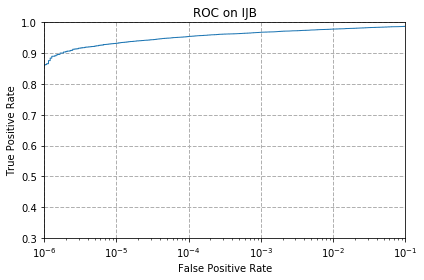

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.863067,0.932096,0.954236,0.967889,0.978269,0.987319,Glint360k,ResNet100,PartialFC_r1.0,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.3579%)]


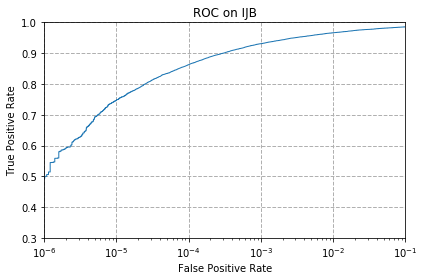

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.50023,0.746791,0.862709,0.930971,0.966355,0.985683,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/port


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 99.5860%)]


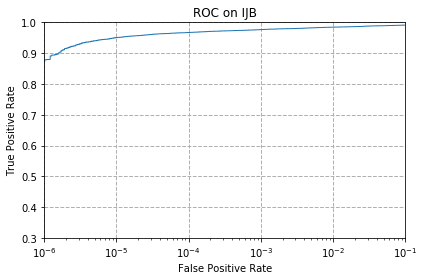

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_procrustes_nosigma,0.878765,0.950453,0.967326,0.976581,0.984507,0.991307,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluatio


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 98.5560%)]


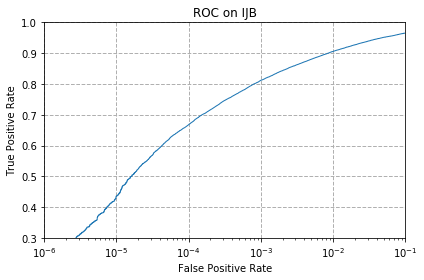

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.224625,0.435701,0.667587,0.811934,0.905558,0.965383,Glint360k,ResNet100,PartialFC_r1.0,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 96.4195%)]


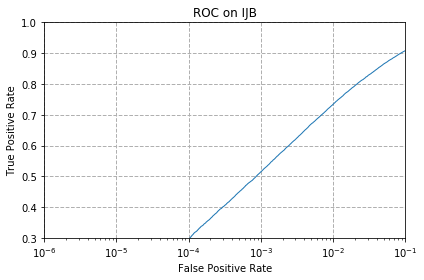

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.016209,0.095669,0.295188,0.514956,0.73452,0.90837,Glint360k,ResNet100,PartialFC_r1.0,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluat


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 95.4629%)]


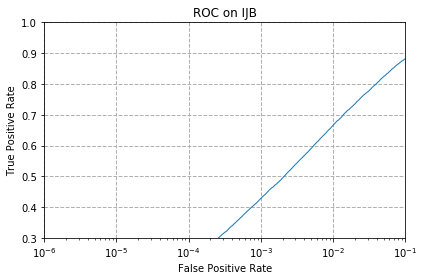

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.016669,0.070001,0.215473,0.428593,0.666258,0.882395,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluatio


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 97.0017%)]


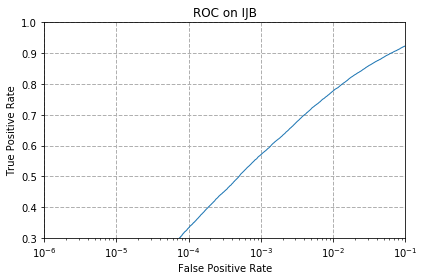

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.035997,0.136217,0.332771,0.570589,0.777471,0.923812,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from:


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 99.2861%)]


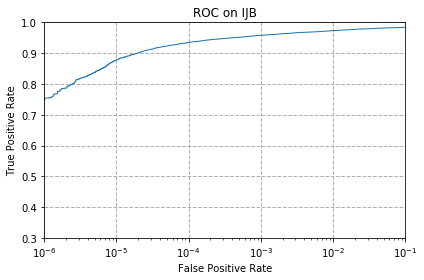

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.754359,0.877742,0.934755,0.95802,0.973309,0.984456,Glint360k,ResNet100,PartialFC_r1.0,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 


>>>> plot roc and calculate tpr...
[../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 98.8975%)]


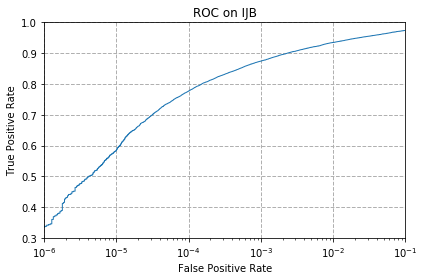

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.338038,0.585059,0.777062,0.874316,0.934959,0.973871,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portabl


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 99.1804%)]


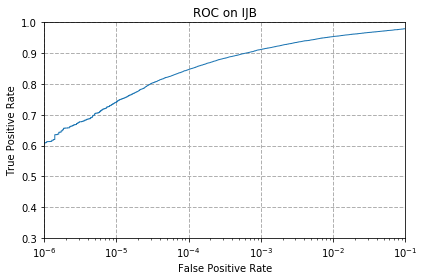

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.609756,0.74132,0.847062,0.912256,0.953981,0.979547,MS1M,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.4291%)]


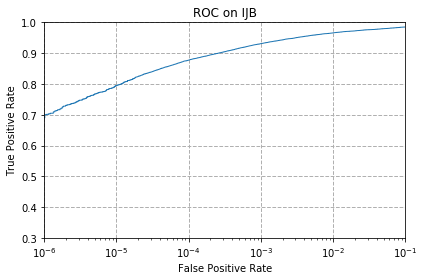

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.700465,0.794856,0.877282,0.931124,0.96615,0.98512,MS1M,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 99.2306%)]


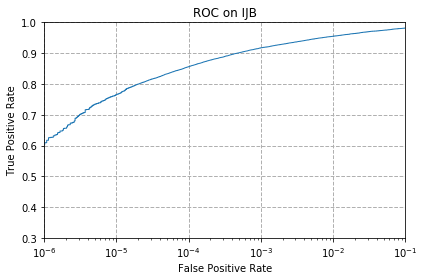

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_procrustes_nosigma,0.609449,0.765864,0.856113,0.91737,0.955003,0.981695,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_emb


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 98.8486%)]


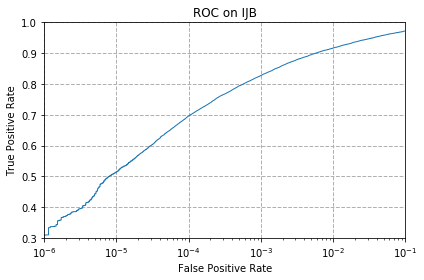

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_procrustes_nosigma,0.30971,0.514649,0.696017,0.827376,0.916705,0.972491,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy
>>>> Reload (righ


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 98.8944%)]


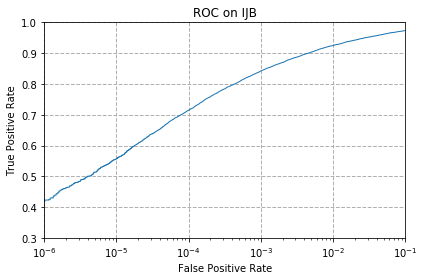

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.42302,0.556987,0.71468,0.842512,0.924988,0.973718,MS1M,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy
>>>> Reload (


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 99.1887%)]


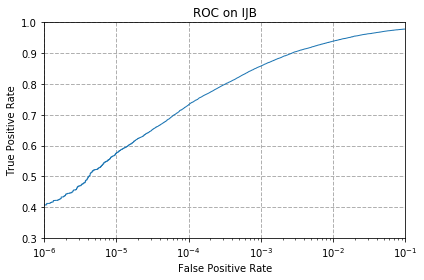

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.40768,0.575906,0.732883,0.858414,0.939203,0.978627,MS1M,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy
>>>> Reload (ri


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 98.9882%)]


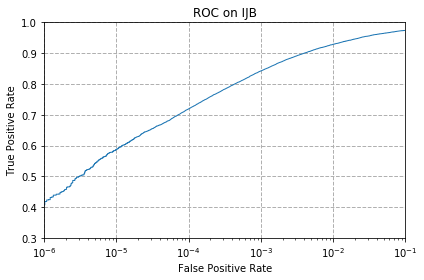

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.418469,0.587667,0.719282,0.842409,0.928926,0.974229,MS1M,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portab


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 98.8193%)]


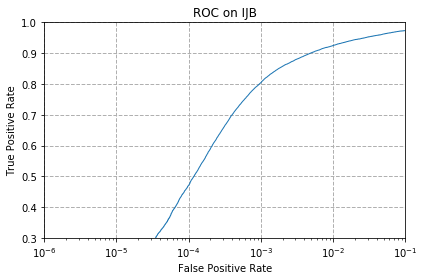

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.037378,0.13949,0.470522,0.804469,0.924835,0.973667,MS1M,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 99.0611%)]


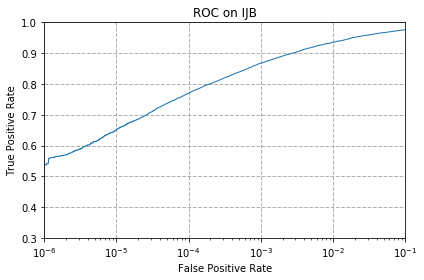

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.537557,0.651327,0.770108,0.867567,0.935624,0.976632,MS1M,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 98.4877%)]


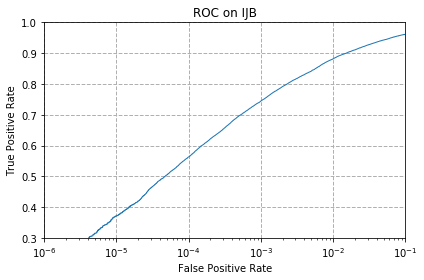

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.16434,0.371887,0.563277,0.744593,0.881884,0.961548,MS1M,MobileNetV2,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arc


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.2605%)]


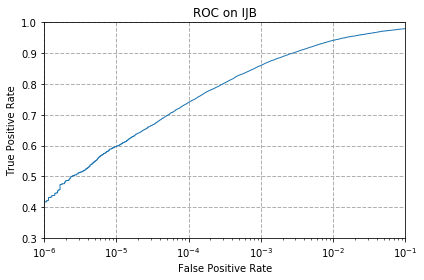

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.417549,0.597996,0.740349,0.859897,0.941709,0.979751,MS1M,MobileNetV2,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijb


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 98.5682%)]


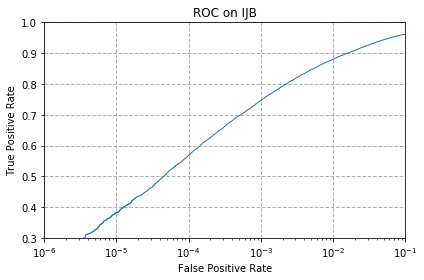

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_procrustes_nosigma,0.23388,0.38196,0.569157,0.746945,0.880299,0.96206,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_a


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 97.3651%)]


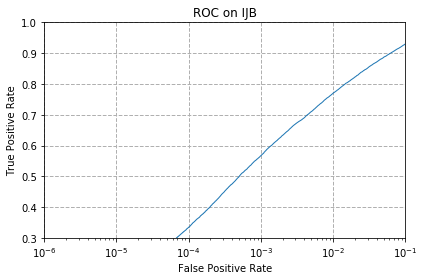

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_procrustes_nosigma,0.053076,0.143376,0.334458,0.567163,0.770261,0.930357,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy
>>>> Reload (right)


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 99.0395%)]


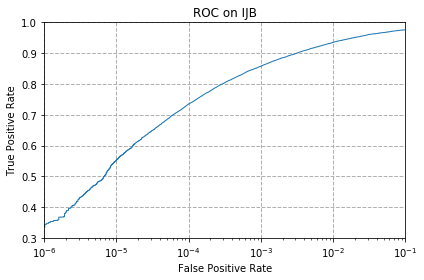

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.344685,0.553664,0.735082,0.8578,0.935368,0.97607,MS1M,MobileNetV2,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy
>>>> Reload (rig


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 99.2849%)]


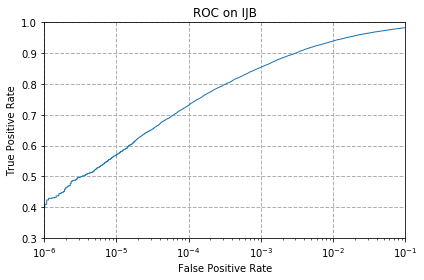

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.409367,0.569515,0.730787,0.85417,0.93951,0.982768,MS1M,MobileNetV2,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy
>>>> Reload (right)


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 99.0538%)]


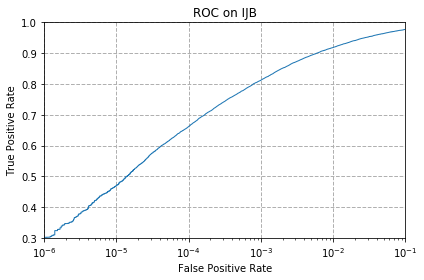

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.302296,0.470011,0.661656,0.81219,0.918392,0.977093,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 97.6192%)]


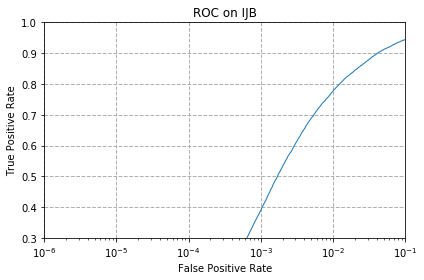

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.000102,0.002966,0.048729,0.389579,0.777471,0.944623,MS1M,MobileNetV2,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 98.5997%)]


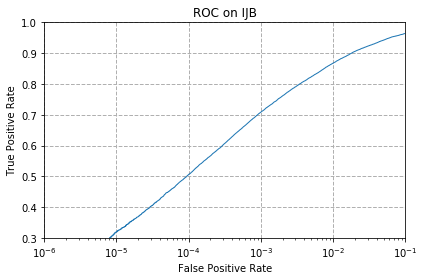

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.18014,0.319783,0.505855,0.708647,0.867925,0.964207,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/porta


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 98.5104%)]


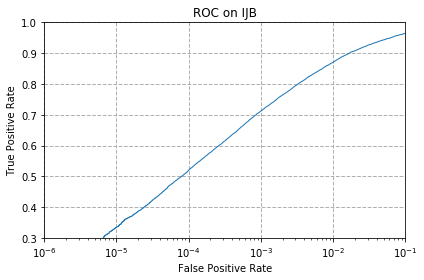

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.181981,0.334151,0.51966,0.71197,0.870583,0.964872,VGGFace2,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mo


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.4620%)]


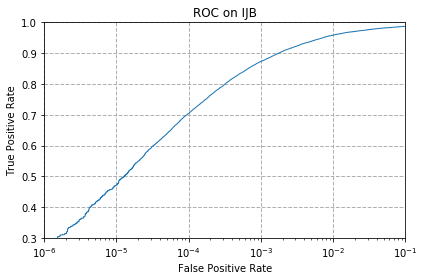

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.276014,0.471442,0.704198,0.873191,0.958634,0.987779,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 98.3046%)]


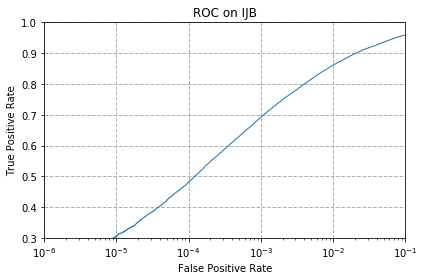

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes_nosigma,0.162908,0.307409,0.481771,0.692233,0.861635,0.959503,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 96.2270%)]


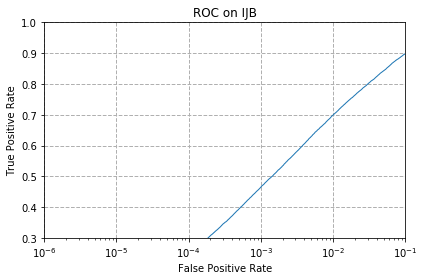

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes_nosigma,0.034821,0.096232,0.248862,0.465153,0.699289,0.8984,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy
>>>> Reload


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 99.0934%)]


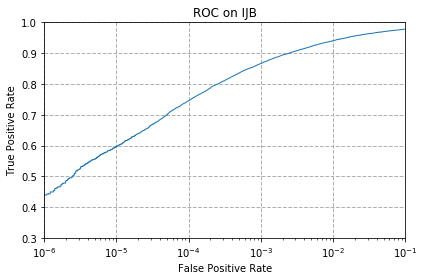

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.439843,0.597484,0.745462,0.866544,0.94084,0.978422,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy
>>>> Reload 


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 99.1101%)]


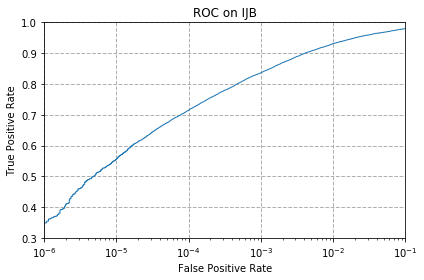

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.349389,0.555913,0.715243,0.836325,0.931073,0.980109,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy
>>>> Reload (ri


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 99.1979%)]


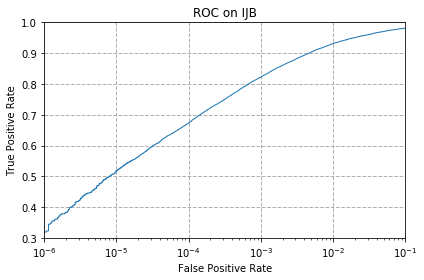

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.319834,0.518433,0.673212,0.822212,0.931329,0.981643,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/p


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 97.2925%)]


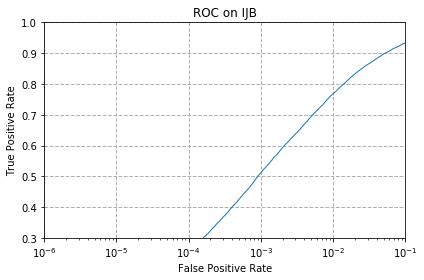

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.024288,0.088153,0.255049,0.512042,0.767858,0.934141,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b


>>>> plot roc and calculate tpr...
[../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 98.8257%)]


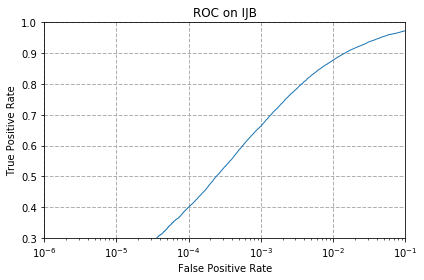

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.068569,0.198752,0.400573,0.662934,0.877435,0.972593,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portabl


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 98.7858%)]


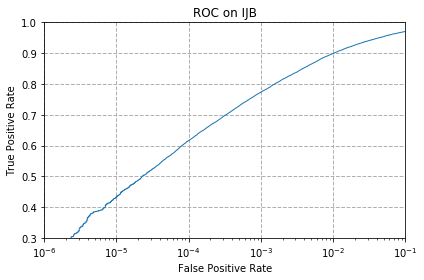

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.259958,0.432837,0.616454,0.773227,0.898911,0.970752,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/face


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.3864%)]


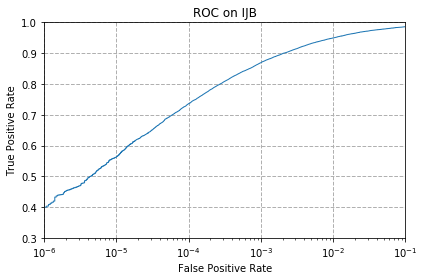

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.400368,0.563532,0.736156,0.869049,0.94943,0.986245,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 98.8144%)]


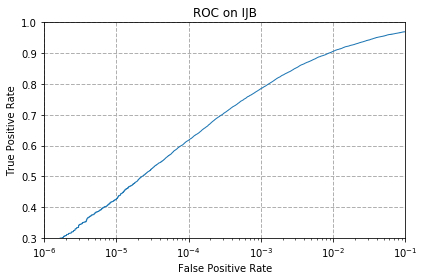

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes_nosigma,0.256532,0.426446,0.617579,0.785039,0.906018,0.970036,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_e


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 97.8878%)]


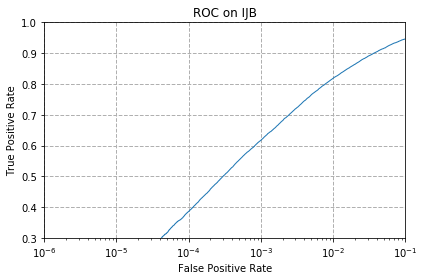

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes_nosigma,0.091425,0.188577,0.386256,0.617119,0.81853,0.946413,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy
>>>> Reload (right) emb


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 99.0492%)]


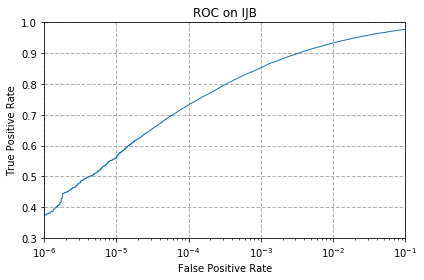

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.375569,0.562101,0.732372,0.852994,0.933528,0.977655,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy
>>>> Reload (right) embe


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 99.0315%)]


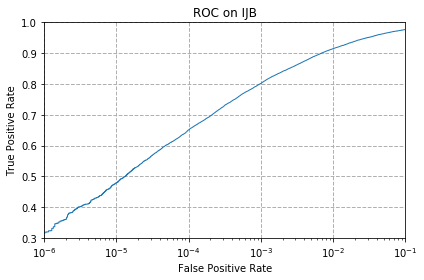

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.318914,0.47947,0.650918,0.801708,0.914557,0.976837,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy
>>>> Reload (right) e


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 99.2641%)]


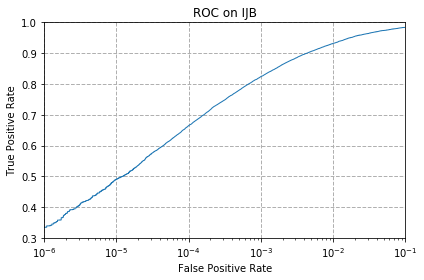

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.335072,0.490617,0.664826,0.824104,0.93184,0.983944,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portabl


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 98.1241%)]


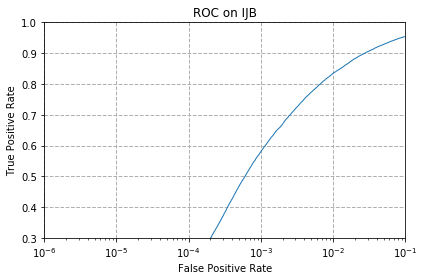

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.000665,0.010994,0.178555,0.58015,0.834944,0.954339,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup


>>>> plot roc and calculate tpr...
[../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 98.9175%)]


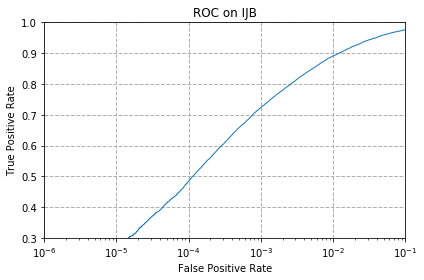

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.127576,0.273866,0.485197,0.723628,0.891241,0.976274,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 99.3272%)]


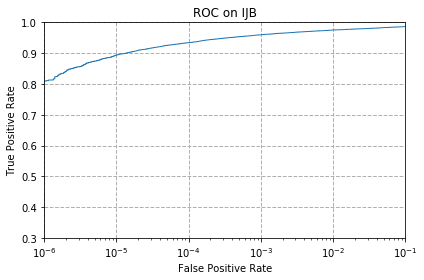

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.809991,0.893798,0.934141,0.959605,0.975354,0.986552,MS1M,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.3138%)]


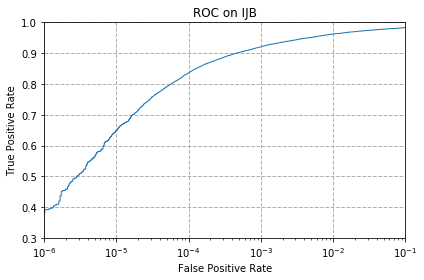

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.392136,0.649537,0.835967,0.920847,0.962162,0.983229,MS1M,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 99.4925%)]


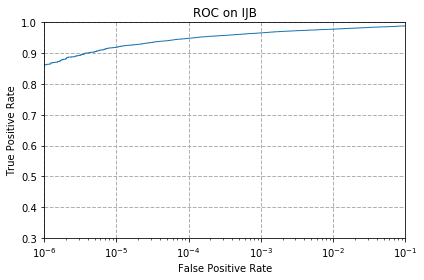

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_0_procrustes_nosigma,0.862556,0.919313,0.948561,0.965997,0.978064,0.988751,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 99.4239%)]


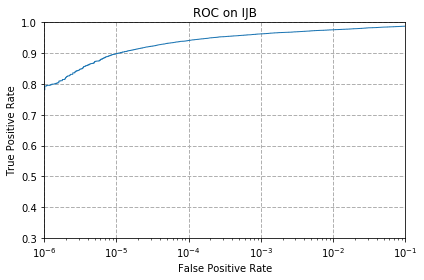

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_1_procrustes_nosigma,0.793475,0.8984,0.941402,0.962775,0.975968,0.987779,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 98.7446%)]


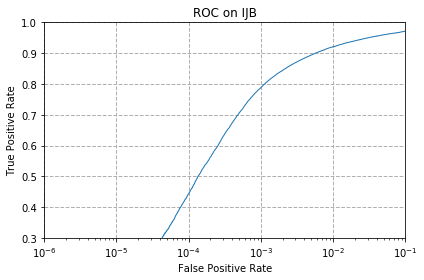

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.03431,0.134734,0.44332,0.788209,0.920693,0.971621,MS1M,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 97.2695%)]


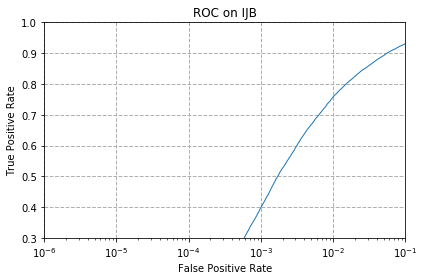

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.000767,0.00675,0.066933,0.398988,0.757734,0.93138,MS1M,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/r


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 97.0599%)]


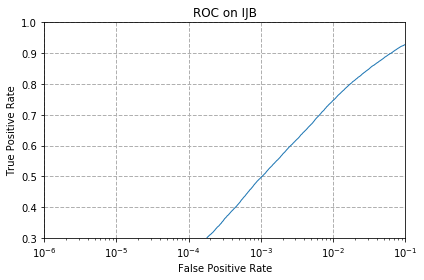

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.013704,0.075267,0.244669,0.496088,0.746791,0.92821,MS1M,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 97.6780%)]


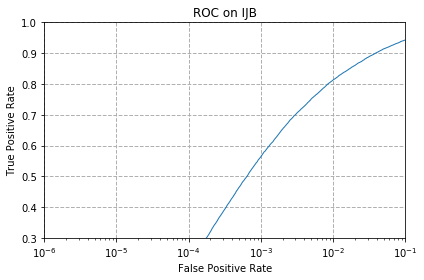

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.002863,0.025515,0.216342,0.563839,0.813213,0.943141,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJB


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma (AUC = 99.0189%)]


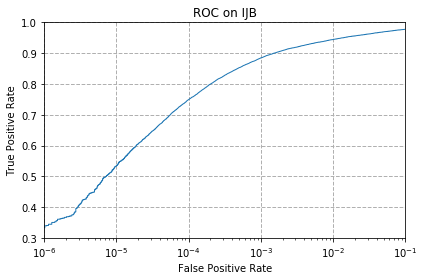

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma,0.339572,0.53362,0.749399,0.884747,0.944368,0.977706,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJB


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma (AUC = 99.2652%)]


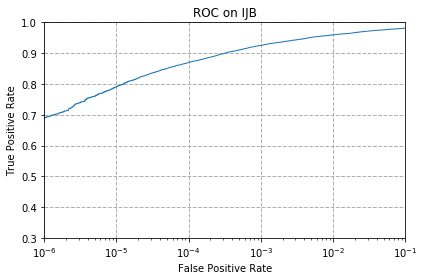

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma,0.691722,0.790714,0.869919,0.925295,0.959759,0.981746,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma (AUC = 99.4302%)]


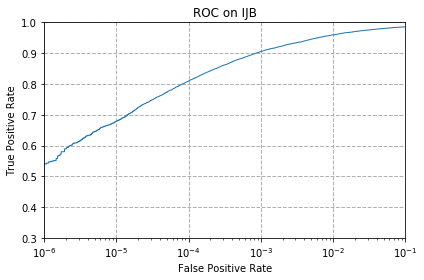

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma,0.540881,0.679348,0.809736,0.905098,0.959656,0.985683,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_0_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (le


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_0_procrustes_nosigma (AUC = 99.3937%)]


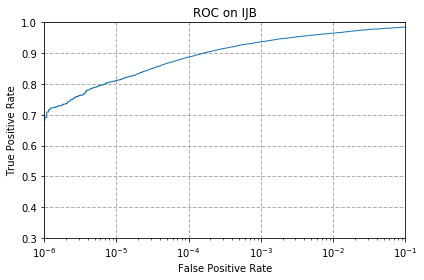

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_0_procrustes_nosigma,0.690852,0.811423,0.887815,0.937107,0.965179,0.984967,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_0_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_1_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embe


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_1_procrustes_nosigma (AUC = 99.1825%)]


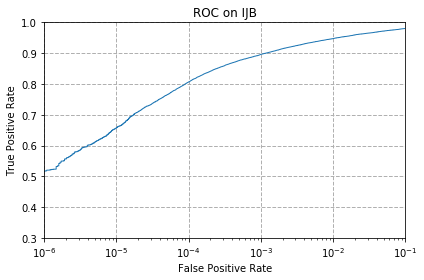

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_1_procrustes_nosigma,0.517922,0.657258,0.80677,0.896099,0.947436,0.980314,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_1_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma (AUC = 99.0291%)]


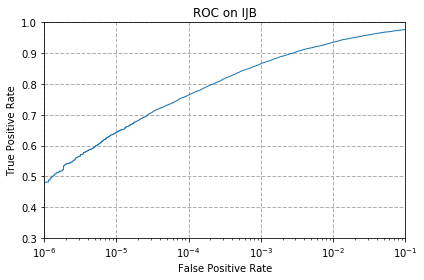

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.481311,0.642685,0.764432,0.865675,0.93542,0.976837,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/d


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma (AUC = 98.4542%)]


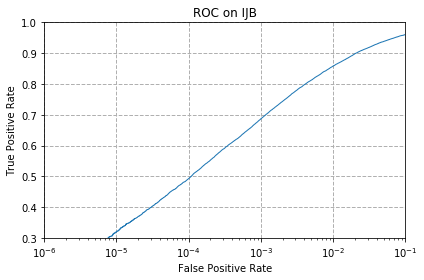

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.203763,0.320039,0.492714,0.687017,0.858363,0.96073,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma (AUC = 98.8152%)]


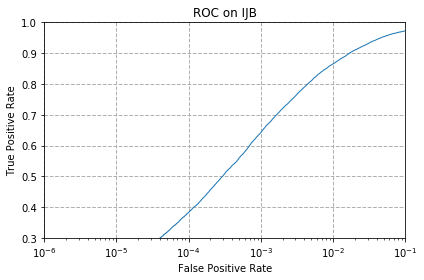

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.082068,0.197474,0.38283,0.64243,0.865521,0.972593,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma (AUC = 98.7500%)]


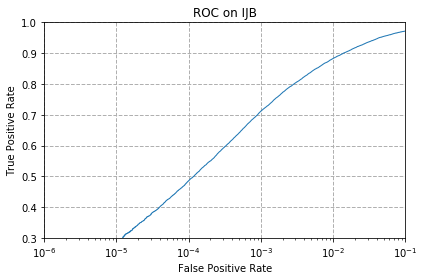

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.156057,0.285575,0.485453,0.711663,0.882958,0.972184,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None}
>>>> Reloading from backup: ./IJBC_ba


>>>> plot roc and calculate tpr...
[../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma (AUC = 99.1198%)]


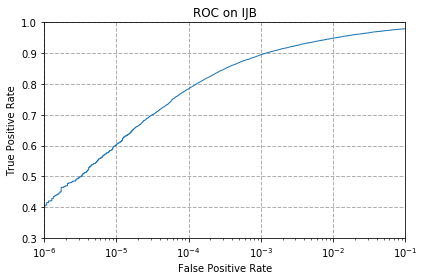

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma,0.406606,0.602904,0.784425,0.895025,0.948816,0.979445,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_procrustes_nosigma.npz.csv


In [16]:
for left_embs, left_dataset, left_architecture, left_head in embs_list_nosigma:
    for right_embs, right_dataset, right_architecture, right_head in embs_list_nosigma:
        if left_embs == right_embs:
            fit_mapping=False
        else:
            fit_mapping=True

        try:
            #for pre_template_map in pre_template_map:
            save_result_name = '{}_TO_{}_procrustes_nosigma'.format(left_embs.split('/')[-1].split('.')[0], right_embs.split('/')[-1].split('.')[0])
            save_result = '../../../../results/{}.npz'.format(save_result_name)
            args = Args(subset='IJBC',  
                is_bunch=False,
                restore_embs_left=left_embs,
                restore_embs_right=right_embs,
                fit_mapping=fit_mapping,
                fit_flips=fit_flips,
                decay_coef=decay_coef,
                pre_template_map=pre_template_map,
                is_rotation_map=is_rotation_map,
                is_procrustes=True,
                save_result=save_result)
            df, fig = IJB.main(args)
            df['L_DATASET'] = left_dataset
            df['L_ARCH'] = left_architecture
            df['L_HEAD'] = left_head
            df['R_DATASET'] = right_dataset
            df['R_ARCH'] = right_architecture
            df['R_HEAD'] = right_head
            display(df)
            dataframes[save_result_name] = df
            print('saving to', args.save_result + '.csv')
            df.to_csv(args.save_result + '.csv')
        except Exception:
            traceback.print_exc()

In [17]:
import pandas as pd

In [18]:
superdf = pd.concat([df for df in dataframes.values()])

In [19]:
superdf

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_procrustes,0.776653,0.858312,0.916552,0.951117,0.974843,0.987575,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_procrustes,0.922125,0.950708,0.965639,0.974843,0.983075,0.990796,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_procrustes,0.891088,0.935982,0.957151,0.969065,0.979291,0.988955,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_procrustes,0.623102,0.730276,0.829319,0.900087,0.943856,0.975150,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_procrustes,0.179731,0.345759,0.529427,0.702971,0.848238,0.947691,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace
...,...,...,...,...,...,...,...,...,...,...,...,...
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_res50_procrustes_nosigma,0.481311,0.642685,0.764432,0.865675,0.935420,0.976837,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_mbv2_procrustes_nosigma,0.203763,0.320039,0.492714,0.687017,0.858363,0.960730,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_vggface2_ir2_ijbc_embs_procrustes_nosigma,0.082068,0.197474,0.382830,0.642430,0.865521,0.972593,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_casia_ir2_ijbc_embs_procrustes_nosigma,0.156057,0.285575,0.485453,0.711663,0.882958,0.972184,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


In [20]:
superdf.to_csv('../../../../results/ALL_aggregated_results_procrustes_1.0_v2.csv')

# 99% explained variance (TODO figure out orthonormality-preserving projection to lower dims)

In [21]:
# dataframes = {}
# fit_flips = False
# decay_coef = 0.001
# pre_template_map= True
# is_rotation_map = True

# for left_embs, left_dataset, left_architecture, left_head in embs_list:
#     for right_embs, right_dataset, right_architecture, right_head in embs_list:
#         if left_embs == right_embs:
#             continue

#         try:
#             #for pre_template_map in pre_template_map:
#             save_result_name = '{}_TO_{}_procrustes'.format(left_embs.split('/')[-1].split('.')[0], right_embs.split('/')[-1].split('.')[0])
#             save_result = '../../../../results/{}.npz'.format(save_result_name)
#             args = Args(subset='IJBC',  
#                 is_bunch=False,
#                 restore_embs_left=left_embs,
#                 restore_embs_right=right_embs,
#                 fit_mapping=True,
#                 fit_flips=fit_flips,
#                 decay_coef=decay_coef,
#                 pre_template_map=pre_template_map,
#                 is_rotation_map=is_rotation_map,
#                 is_procrustes=True,
#                 explained_variance_proportion=0.99
#                 save_result=save_result)
#             df, fig = IJB.main(args)
#             df['L_DATASET'] = left_dataset
#             df['L_ARCH'] = left_architecture
#             df['L_HEAD'] = left_head
#             df['R_DATASET'] = right_dataset
#             df['R_ARCH'] = right_architecture
#             df['R_HEAD'] = right_head
#             display(df)
#             dataframes[save_result_name] = df
#             print('saving to', args.save_result + '.csv')
#             df.to_csv(args.save_result + '.csv')
#         except Exception:
#             traceback.print_exc()
            
# superdf = pd.concat([df for df in dataframes.values()])
# superdf.to_csv('../../../../results/ALL_aggregated_results_procrustes_0.99_v1.csv')
# superdf

# rerun to save mappings

<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/I

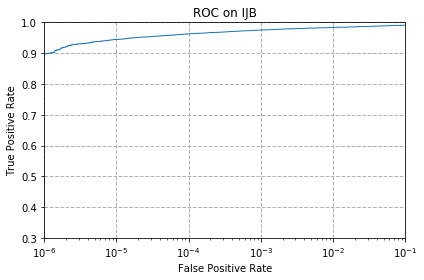

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.898451,0.944726,0.962827,0.975252,0.983638,0.990796,MS1MV2,ResNet100,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ..

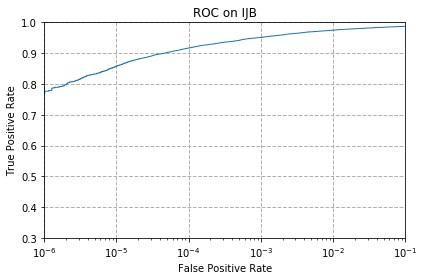

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.776653,0.858312,0.916552,0.951117,0.974843,0.987575,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reloa

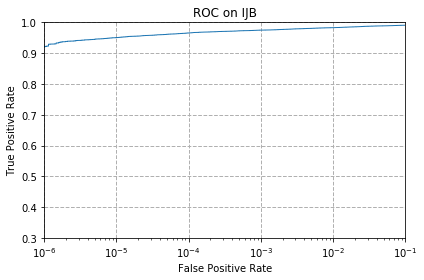

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ortho,0.922125,0.950708,0.965639,0.974843,0.983075,0.990796,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left)

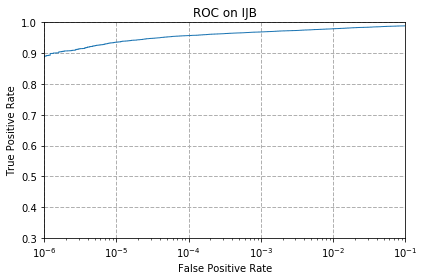

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ortho,0.891088,0.935982,0.957151,0.969065,0.979291,0.988955,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

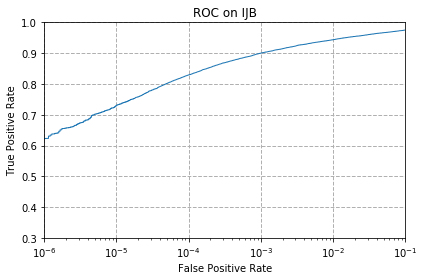

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ortho,0.623102,0.730276,0.829319,0.900087,0.943856,0.97515,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobac

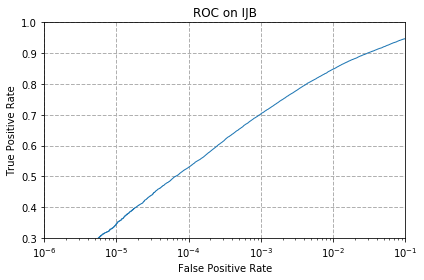

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.179731,0.345759,0.529427,0.702971,0.848238,0.947691,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/no

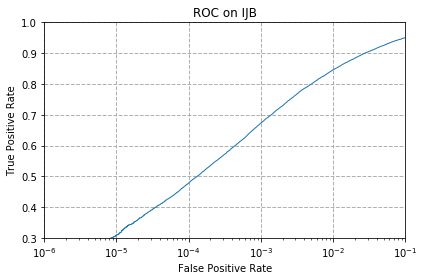

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.192105,0.308074,0.478192,0.673007,0.845938,0.950606,MS1MV2,ResNet100,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

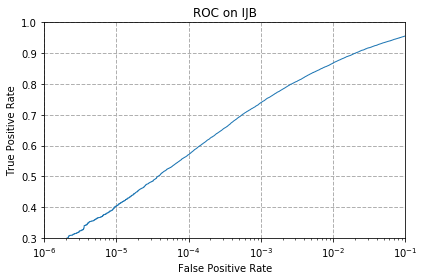

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ortho,0.258424,0.404612,0.570589,0.739531,0.86818,0.956282,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ..

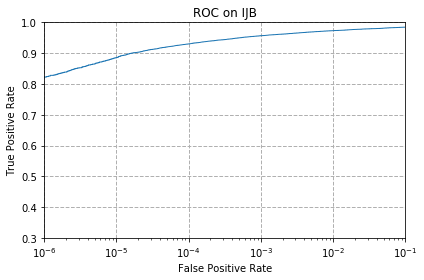

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.822774,0.885412,0.930051,0.956844,0.973258,0.98466,MS1MV2,ResNet100,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backu

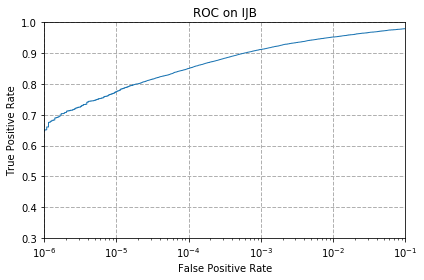

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.651276,0.774965,0.850437,0.912154,0.952498,0.979905,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz 

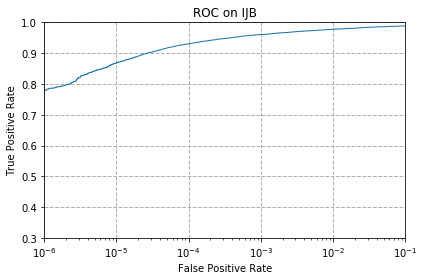

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.779976,0.868282,0.93092,0.960423,0.977604,0.988955,VGGFace2,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> R

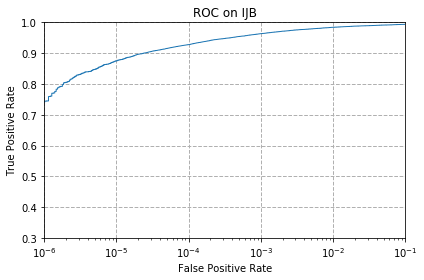

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.744439,0.875083,0.927852,0.963491,0.984098,0.993864,VGGFace2,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 

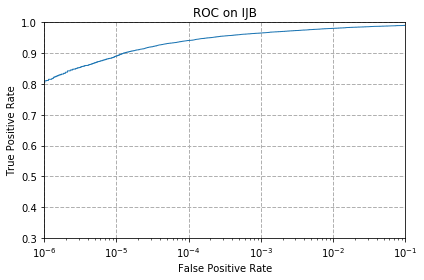

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ortho,0.810452,0.890883,0.941402,0.965639,0.980723,0.990438,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddin

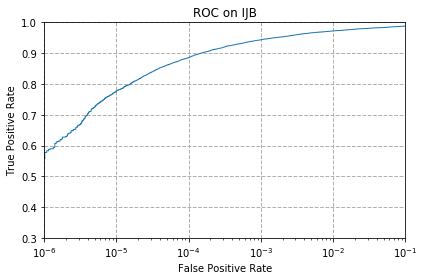

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ortho,0.577798,0.777522,0.88577,0.943856,0.972388,0.987984,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data

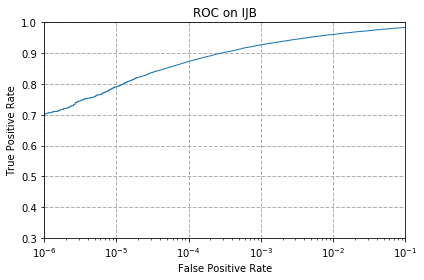

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ortho,0.70384,0.790919,0.873447,0.927034,0.961037,0.983893,VGGFace2,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/

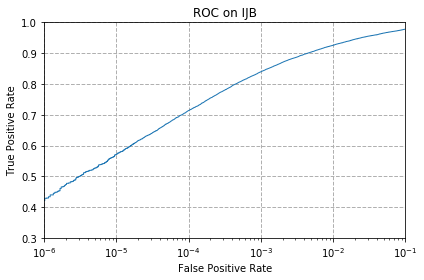

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.429002,0.570895,0.713862,0.839546,0.925807,0.97786,VGGFace2,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/da

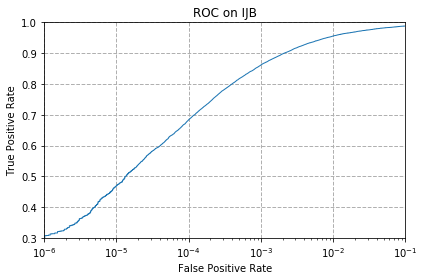

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.307665,0.470062,0.683131,0.861482,0.955975,0.988393,VGGFace2,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data

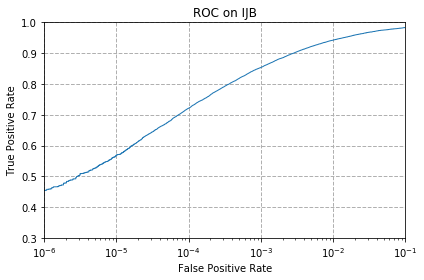

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ortho,0.454978,0.568441,0.721379,0.853659,0.942578,0.98328,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Re

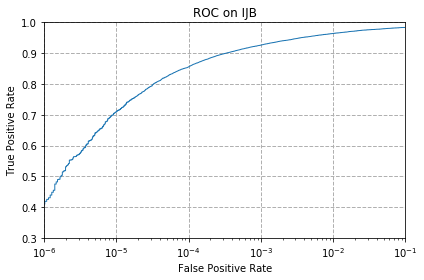

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.419083,0.71018,0.855602,0.926318,0.964156,0.983689,VGGFace2,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...

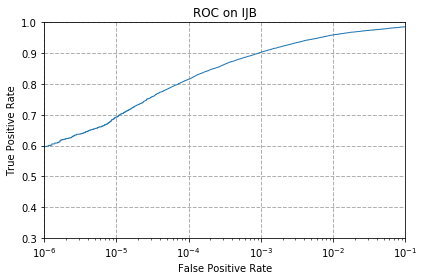

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.597126,0.692489,0.815667,0.902695,0.95935,0.985836,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Rel

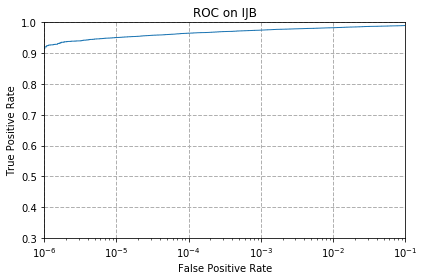

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.920796,0.95081,0.965025,0.974945,0.982768,0.989978,Glint360k,ResNet100,PartialFC_r0.1,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embed

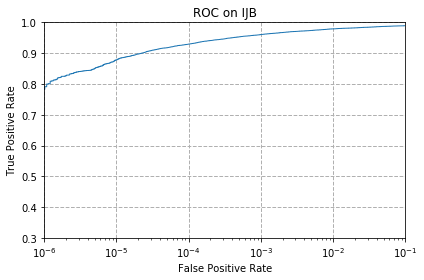

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.791277,0.8781,0.929488,0.960423,0.979087,0.989364,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from:

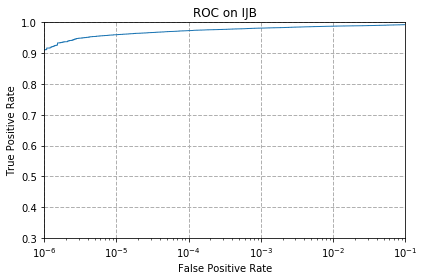

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_ortho,0.911592,0.959963,0.973309,0.98149,0.987677,0.992739,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b

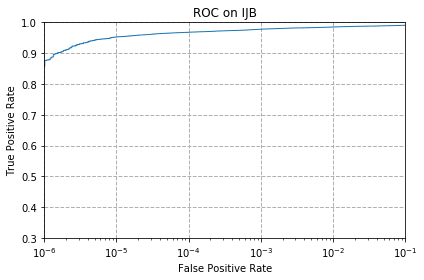

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_ortho,0.876413,0.952498,0.967991,0.97786,0.985069,0.990694,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/m

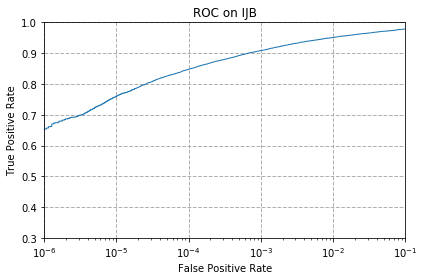

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_ortho,0.654344,0.760188,0.847574,0.908779,0.950964,0.978678,Glint360k,ResNet100,PartialFC_r0.1,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mo

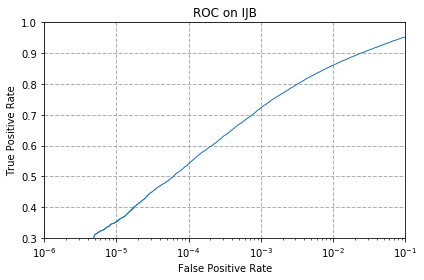

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.206473,0.352355,0.540932,0.722555,0.860919,0.953009,Glint360k,ResNet100,PartialFC_r0.1,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom

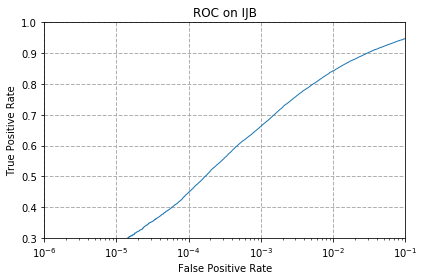

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.174106,0.273406,0.448228,0.662525,0.842614,0.948049,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/m

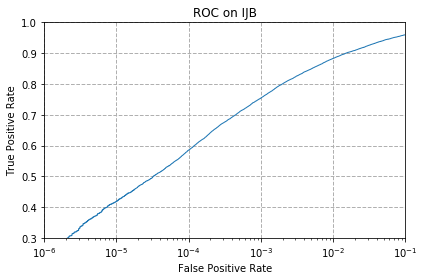

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_ortho,0.260265,0.418827,0.585366,0.754359,0.883162,0.960168,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embed

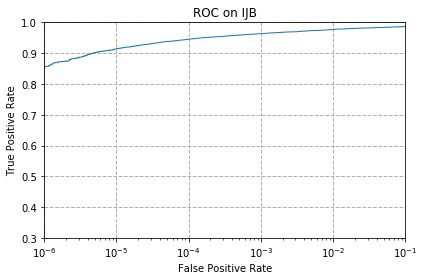

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.857238,0.913995,0.945237,0.96344,0.977041,0.986757,Glint360k,ResNet100,PartialFC_r0.1,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (lef

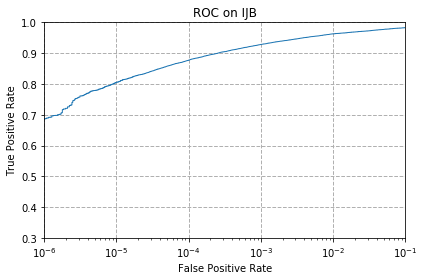

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.687682,0.805134,0.877077,0.928363,0.962775,0.982922,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (lef

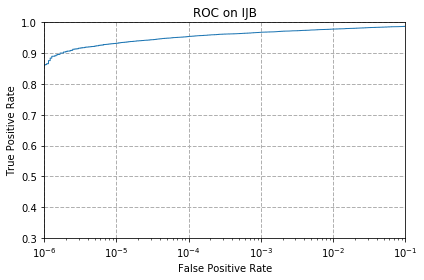

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.863067,0.932096,0.954236,0.967889,0.978269,0.987319,Glint360k,ResNet100,PartialFC_r1.0,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embed

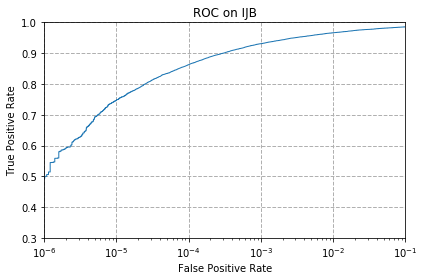

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.50023,0.746791,0.862709,0.930971,0.966355,0.985683,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: 

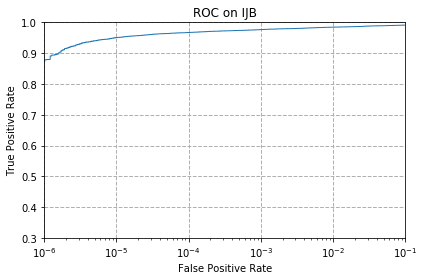

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_ortho,0.878765,0.950453,0.967326,0.976581,0.984507,0.991307,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/

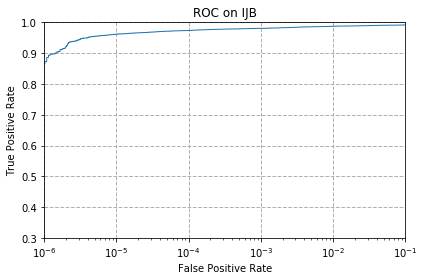

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_ortho,0.872424,0.961497,0.973871,0.980621,0.987421,0.99187,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/m

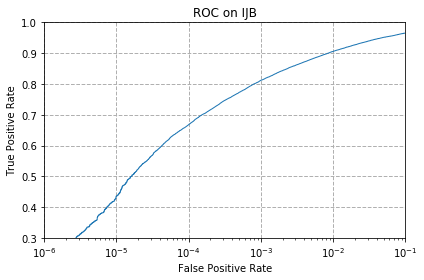

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_ortho,0.224625,0.435701,0.667587,0.811934,0.905558,0.965383,Glint360k,ResNet100,PartialFC_r1.0,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mo

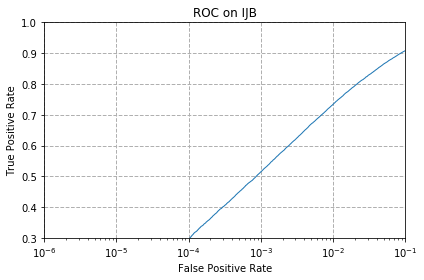

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.016209,0.095669,0.295188,0.514956,0.73452,0.90837,Glint360k,ResNet100,PartialFC_r1.0,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom

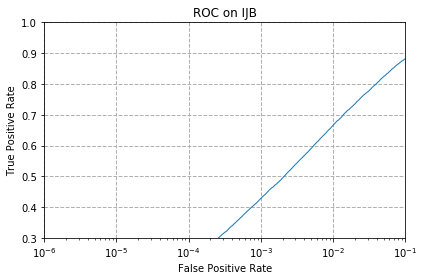

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.016669,0.070001,0.215473,0.428593,0.666258,0.882395,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/m

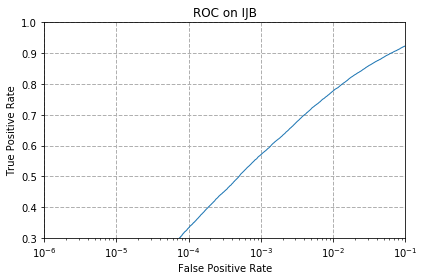

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_ortho,0.035997,0.136217,0.332771,0.570589,0.777471,0.923812,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embed

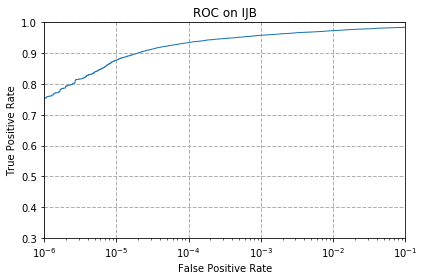

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.755126,0.877691,0.934601,0.958174,0.973309,0.984456,Glint360k,ResNet100,PartialFC_r1.0,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (lef

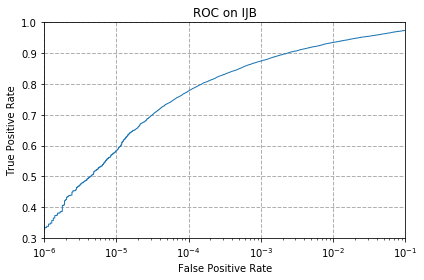

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.334305,0.583576,0.777829,0.874572,0.935062,0.974025,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/no

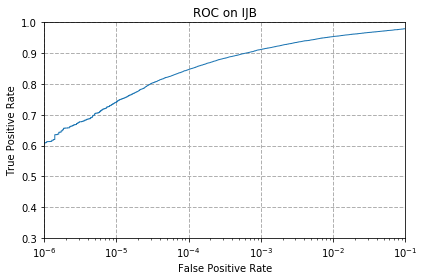

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.609756,0.74132,0.847062,0.912256,0.953981,0.979547,MS1M,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/

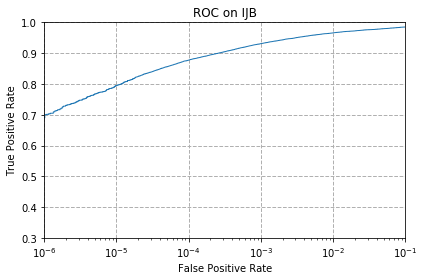

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.700465,0.794856,0.877282,0.931124,0.96615,0.98512,MS1M,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portabl

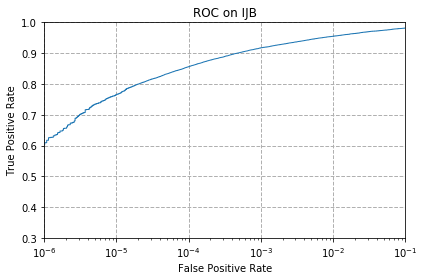

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_ortho,0.609449,0.765864,0.856113,0.91737,0.955003,0.981695,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/

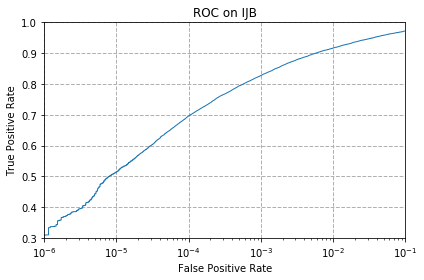

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_ortho,0.30971,0.514649,0.696017,0.827376,0.916705,0.972491,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_a

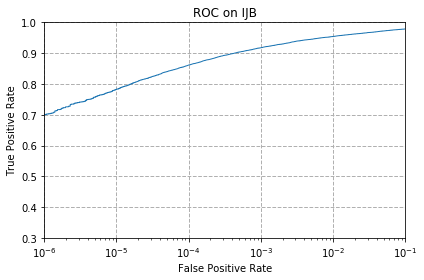

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_ortho,0.701232,0.782329,0.861431,0.917574,0.954287,0.978627,MS1M,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc

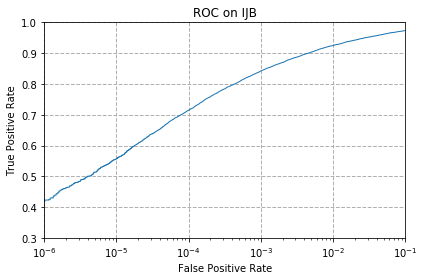

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.42302,0.556987,0.71468,0.842512,0.924988,0.973718,MS1M,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_

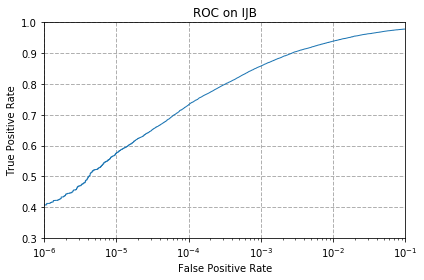

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.40768,0.575906,0.732883,0.858414,0.939203,0.978627,MS1M,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_ar

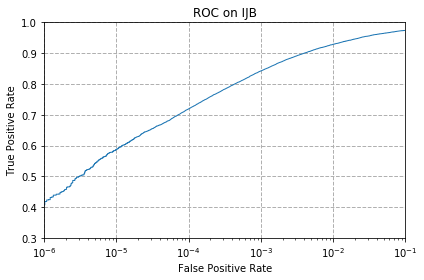

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_ortho,0.418469,0.587667,0.719282,0.842409,0.928926,0.974229,MS1M,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/

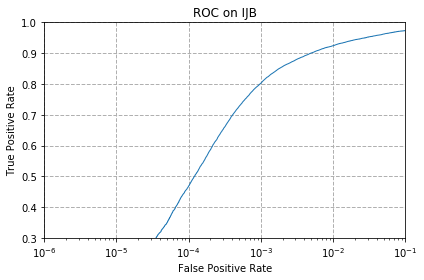

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.036662,0.136013,0.468119,0.802373,0.924324,0.973616,MS1M,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/n

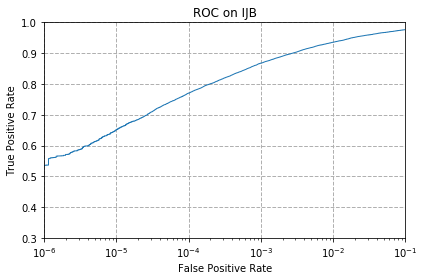

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.536381,0.651327,0.770312,0.867771,0.935675,0.976632,MS1M,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nob

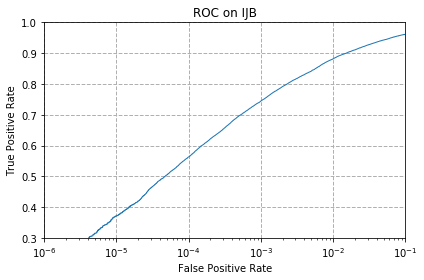

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.16434,0.371887,0.563277,0.744593,0.881884,0.961548,MS1M,MobileNetV2,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/dat

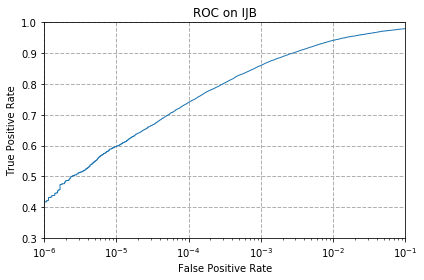

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.417549,0.597996,0.740349,0.859897,0.941709,0.979751,MS1M,MobileNetV2,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/t

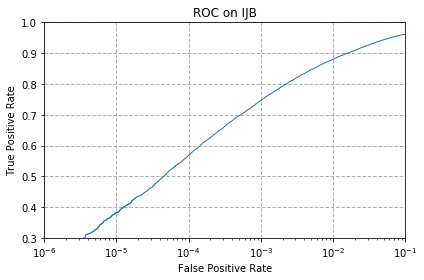

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_ortho,0.23388,0.38196,0.569157,0.746945,0.880299,0.96206,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mod

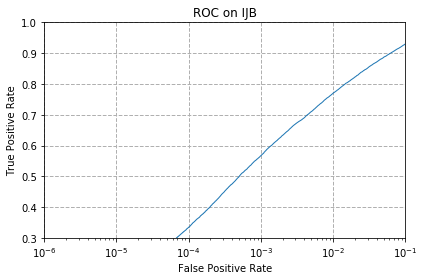

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_ortho,0.053076,0.143376,0.334458,0.567163,0.770261,0.930357,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_m

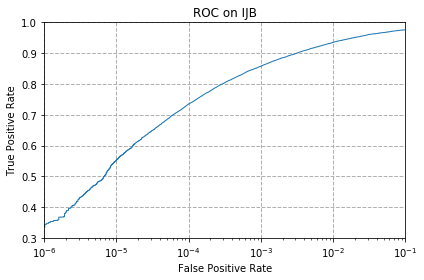

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_ortho,0.344685,0.553664,0.735082,0.8578,0.935368,0.97607,MS1M,MobileNetV2,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_m

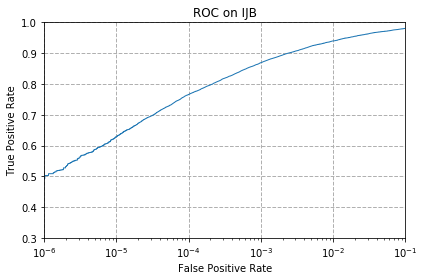

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.502787,0.628982,0.765915,0.869254,0.939766,0.980723,MS1M,MobileNetV2,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc

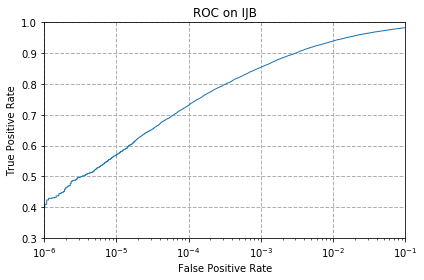

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.409367,0.569515,0.730787,0.85417,0.93951,0.982768,MS1M,MobileNetV2,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_m

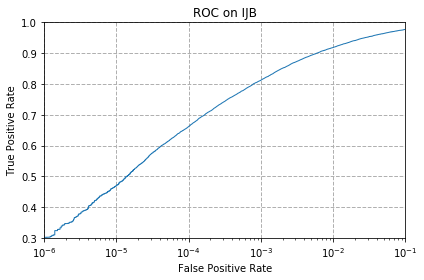

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_ortho,0.302296,0.470011,0.661656,0.81219,0.918392,0.977093,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/dat

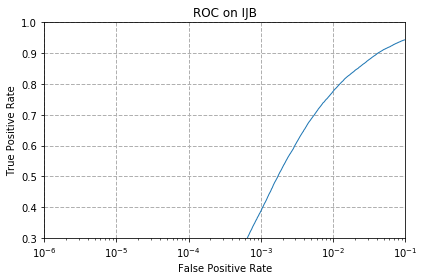

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.000102,0.003017,0.04832,0.387023,0.775937,0.944317,MS1M,MobileNetV2,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

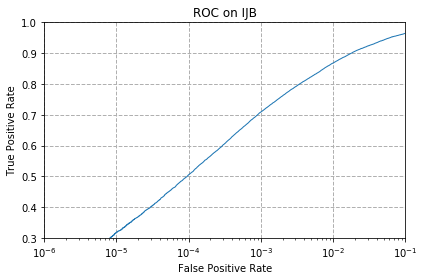

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.18239,0.318505,0.50519,0.709056,0.868385,0.964616,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

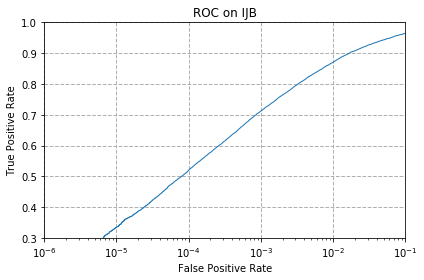

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.181981,0.334151,0.51966,0.71197,0.870583,0.964872,VGGFace2,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

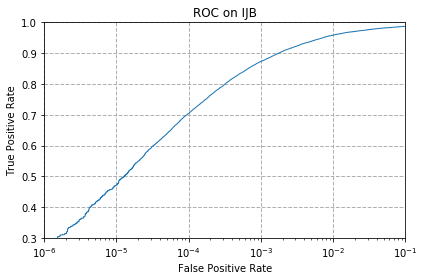

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.276014,0.471442,0.704198,0.873191,0.958634,0.987779,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/po

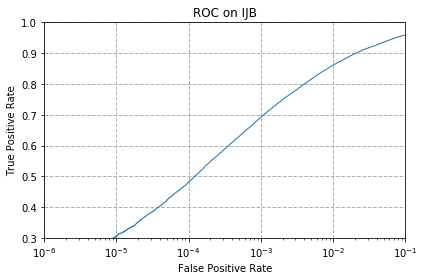

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ortho,0.162908,0.307409,0.481771,0.692233,0.861635,0.959503,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/t

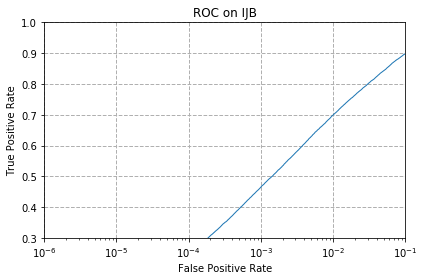

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ortho,0.034821,0.096232,0.248862,0.465153,0.699289,0.8984,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir

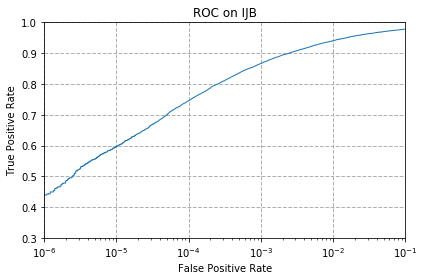

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ortho,0.439843,0.597484,0.745462,0.866544,0.94084,0.978422,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2

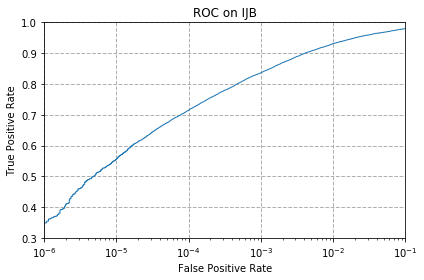

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.349389,0.555913,0.715243,0.836325,0.931073,0.980109,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2

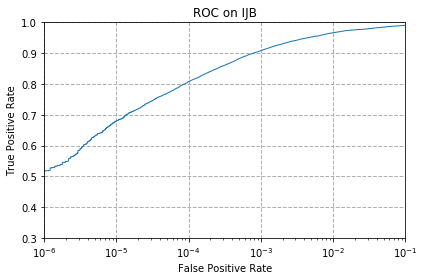

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.518382,0.680728,0.807946,0.908473,0.96661,0.990183,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir

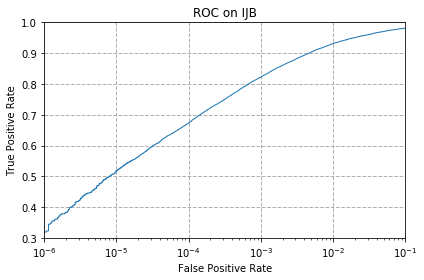

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ortho,0.319834,0.518433,0.673212,0.822212,0.931329,0.981643,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

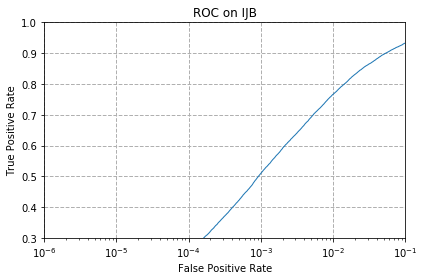

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.023879,0.088153,0.253771,0.509792,0.76658,0.933221,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/re

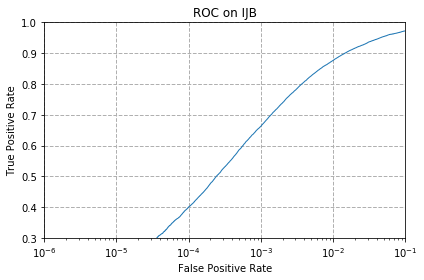

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.068313,0.199468,0.400726,0.662729,0.876617,0.97244,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/no

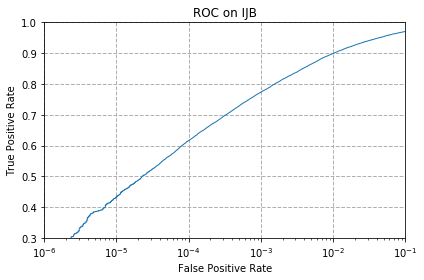

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.259958,0.432837,0.616454,0.773227,0.898911,0.970752,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data

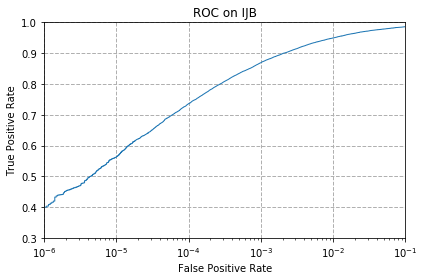

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.400368,0.563532,0.736156,0.869049,0.94943,0.986245,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tb

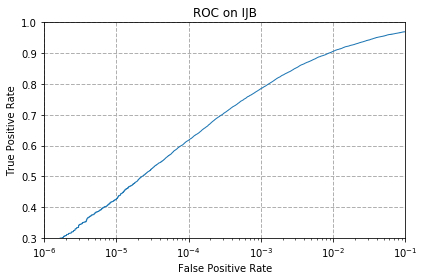

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ortho,0.256532,0.426446,0.617579,0.785039,0.906018,0.970036,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mode

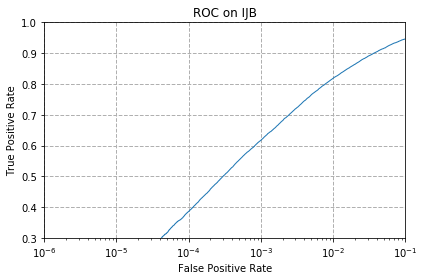

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ortho,0.091425,0.188577,0.386256,0.617119,0.81853,0.946413,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.

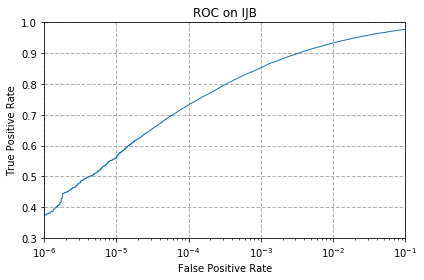

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ortho,0.375569,0.562101,0.732372,0.852994,0.933528,0.977655,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.n

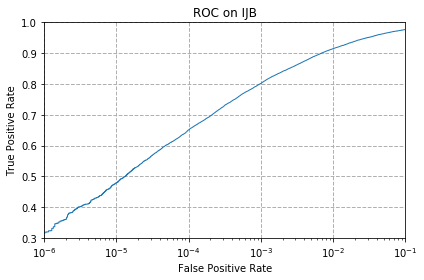

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.318914,0.47947,0.650918,0.801708,0.914557,0.976837,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_emb

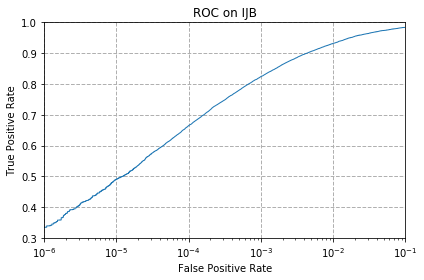

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.335072,0.490617,0.664826,0.824104,0.93184,0.983944,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs

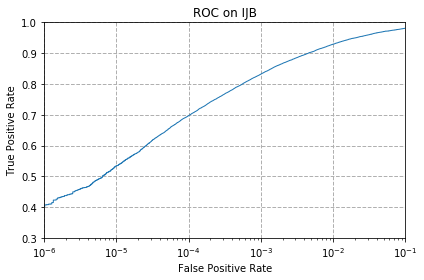

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ortho,0.407527,0.533875,0.697039,0.832132,0.929335,0.980979,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data

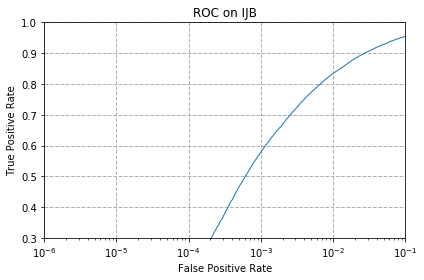

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.000665,0.011045,0.175538,0.578463,0.834586,0.954543,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobac

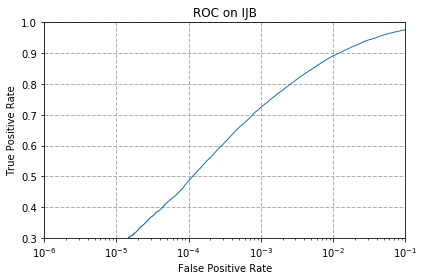

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.127269,0.274838,0.486271,0.724242,0.891292,0.976326,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz 

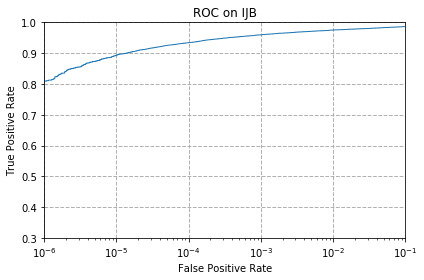

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.809787,0.893082,0.934346,0.959554,0.975354,0.986501,MS1M,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_bac

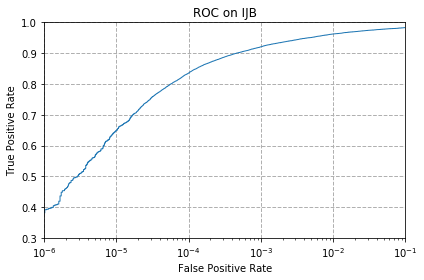

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.391931,0.649128,0.835404,0.920744,0.962315,0.983177,MS1M,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


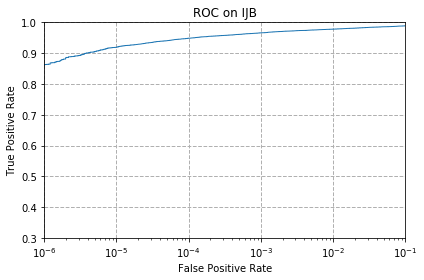

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_ortho,0.863323,0.919262,0.948612,0.966099,0.978115,0.988853,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Rel

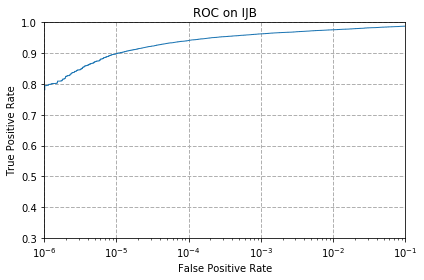

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_ortho,0.794805,0.898604,0.941249,0.962673,0.97607,0.98783,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/

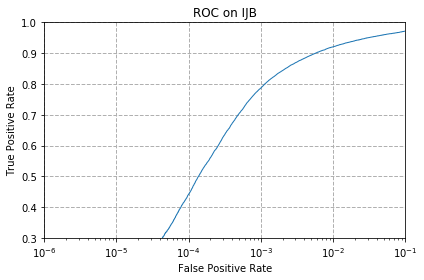

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_ortho,0.034412,0.134888,0.442246,0.786982,0.920693,0.971621,MS1M,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/r

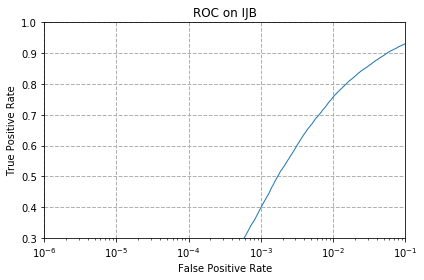

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.000818,0.006647,0.067393,0.398374,0.757171,0.931329,MS1M,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /

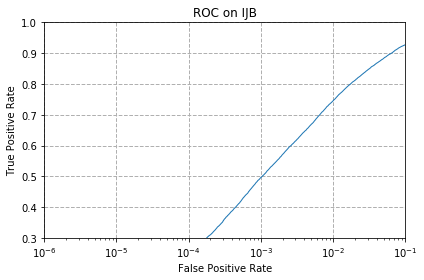

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.013806,0.075727,0.244669,0.496242,0.745718,0.927596,MS1M,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/

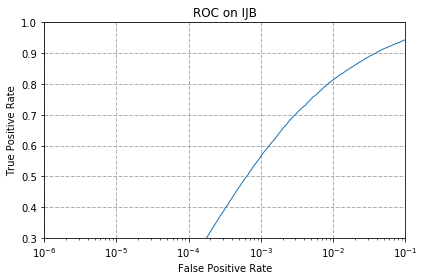

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_ortho,0.002761,0.025669,0.215524,0.565475,0.813571,0.943498,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_ba

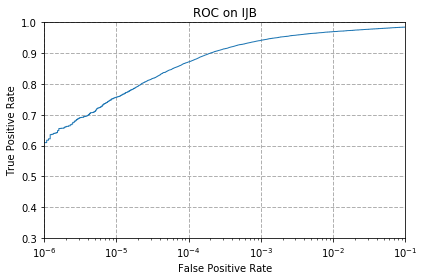

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.609756,0.757171,0.871759,0.941913,0.969883,0.984814,MS1M,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./

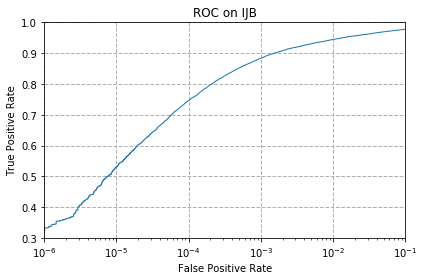

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.332771,0.531216,0.746587,0.883776,0.944726,0.977911,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_bac

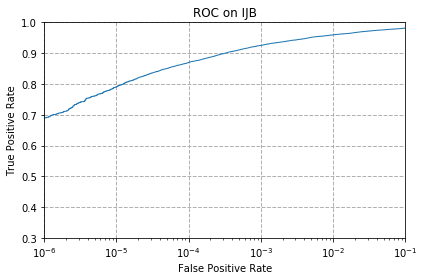

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho,0.690699,0.79051,0.869714,0.925346,0.959759,0.981746,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


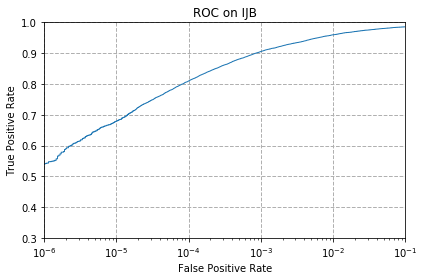

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho,0.542057,0.678938,0.809685,0.905354,0.95981,0.985683,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload 

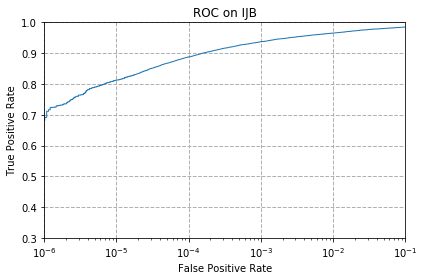

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_ortho,0.691722,0.812446,0.887713,0.93726,0.965179,0.985018,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

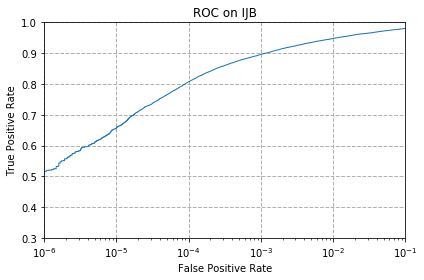

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_ortho,0.517053,0.656645,0.806923,0.896099,0.947691,0.980518,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

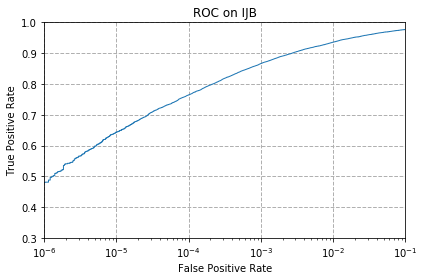

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_ortho,0.481209,0.644015,0.764688,0.866391,0.93588,0.977041,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku

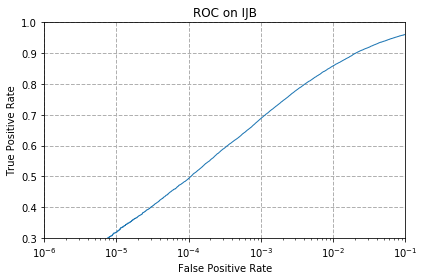

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_ortho,0.203661,0.319118,0.493225,0.687989,0.858976,0.96119,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

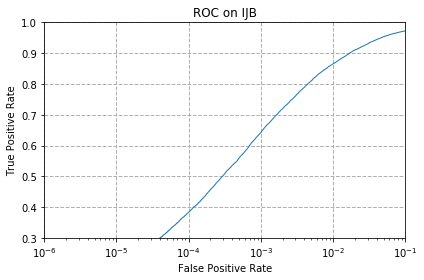

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_ortho,0.08263,0.197474,0.38329,0.642379,0.865368,0.972491,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

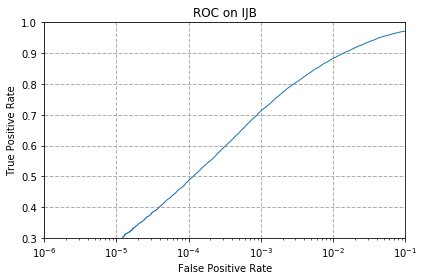

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_ortho,0.156363,0.285933,0.487038,0.71243,0.883009,0.97203,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


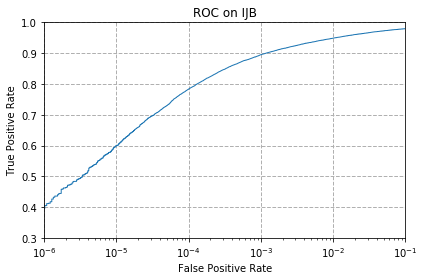

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho,0.405328,0.599274,0.783249,0.895178,0.948714,0.979649,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ortho.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup

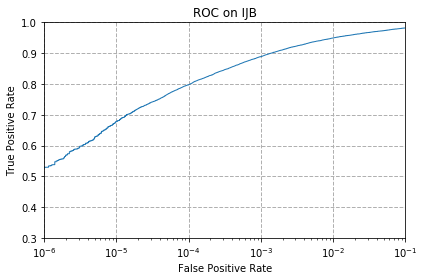

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho,0.529631,0.677507,0.797515,0.888838,0.94943,0.982155,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ortho.npz.csv


In [15]:
for left_embs, left_dataset, left_architecture, left_head in embs_list:
    for right_embs, right_dataset, right_architecture, right_head in embs_list:
        if left_embs == right_embs:
            fit_mapping=False
        else:
            fit_mapping=True

        try:
            #for pre_template_map in pre_template_map:
            save_result_name = '{}_TO_{}_N11856_ortho'.format(left_embs.split('/')[-1].split('.')[0], right_embs.split('/')[-1].split('.')[0])
            save_result = '../../../../results/{}.npz'.format(save_result_name)
            args = Args(subset='IJBC',  
                is_bunch=False,
                restore_embs_left=left_embs,
                restore_embs_right=right_embs,
                fit_mapping=fit_mapping,
                fit_flips=fit_flips,
                decay_coef=decay_coef,
                pre_template_map=pre_template_map,
                is_rotation_map=is_rotation_map,
                is_procrustes=True,
                save_result=save_result)
            df, fig = IJB.main(args)
            df['L_DATASET'] = left_dataset
            df['L_ARCH'] = left_architecture
            df['L_HEAD'] = left_head
            df['R_DATASET'] = right_dataset
            df['R_ARCH'] = right_architecture
            df['R_HEAD'] = right_head
            display(df)
            dataframes[save_result_name] = df
            print('saving to', args.save_result + '.csv')
            df.to_csv(args.save_result + '.csv')
        except Exception:
            traceback.print_exc()

# IDENTITY :')

<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/insightf

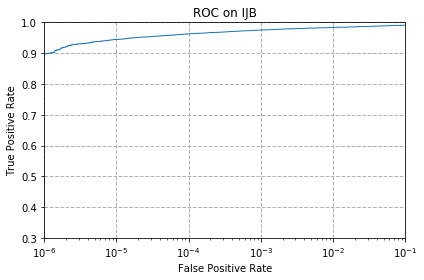

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.898451,0.944726,0.962827,0.975252,0.983638,0.990796,MS1MV2,ResNet100,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_

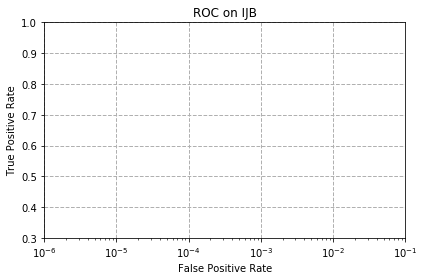

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.000051,0.000205,0.001074,0.009664,0.102112,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz .

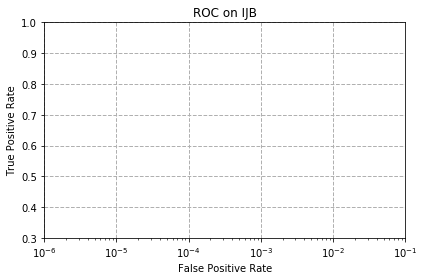

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_identity,0.0,0.0,0.0,0.000409,0.007056,0.082988,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> 

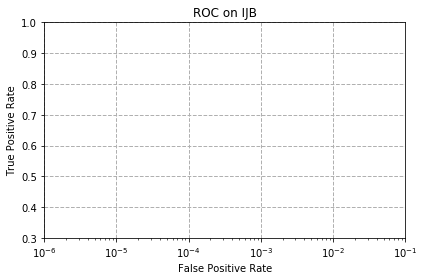

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_identity,0.0,0.0,0.000051,0.001176,0.008897,0.097714,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: 

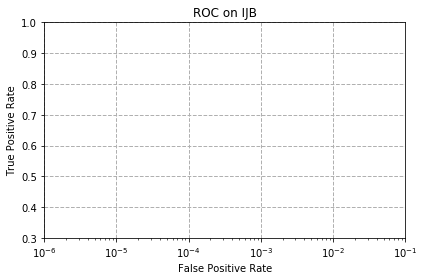

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_identity,0.0,0.000051,0.000153,0.001585,0.01176,0.110651,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /

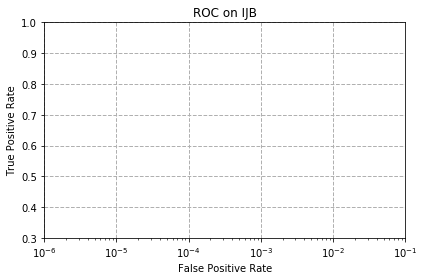

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_identity,0.000051,0.000051,0.000153,0.000869,0.00675,0.080994,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from

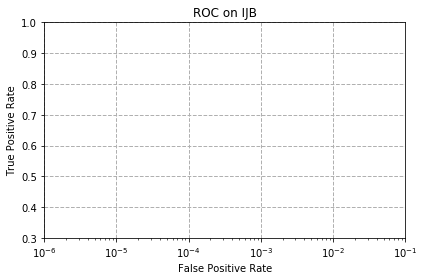

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.0,0.000205,0.001841,0.011863,0.110242,MS1MV2,ResNet100,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: 

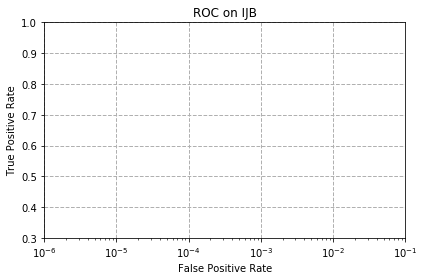

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_identity,0.0,0.0,0.000102,0.001534,0.013141,0.098175,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from

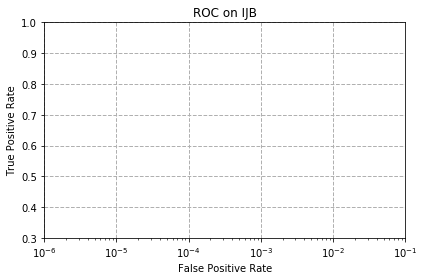

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.000051,0.000256,0.001534,0.012988,0.10881,MS1MV2,ResNet100,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>

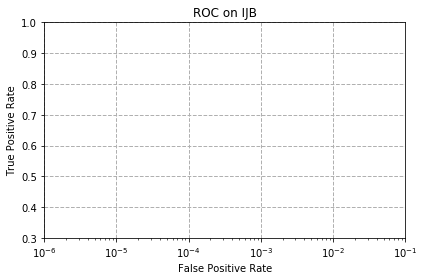

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.0,0.000051,0.000869,0.008079,0.102061,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backu

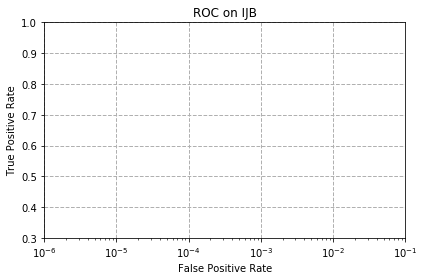

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.0,0.000205,0.000562,0.007568,0.095004,VGGFace2,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

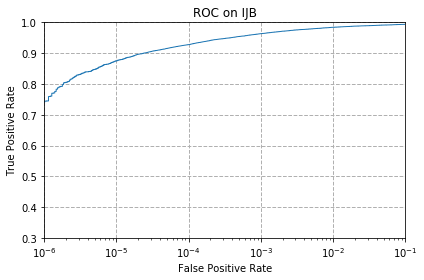

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.744439,0.875083,0.927852,0.963491,0.984098,0.993864,VGGFace2,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> R

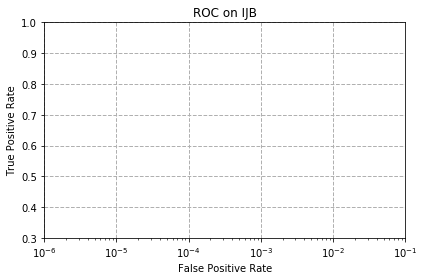

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_identity,0.0,0.0,0.000102,0.000869,0.010482,0.10114,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (l

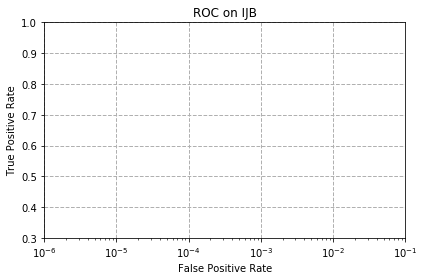

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_identity,0.0,0.0,0.000051,0.000767,0.011505,0.111827,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

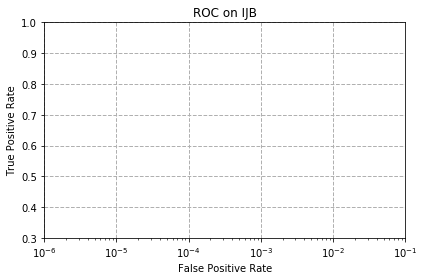

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_identity,0.0,0.0,0.000153,0.001636,0.011454,0.100885,VGGFace2,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/n

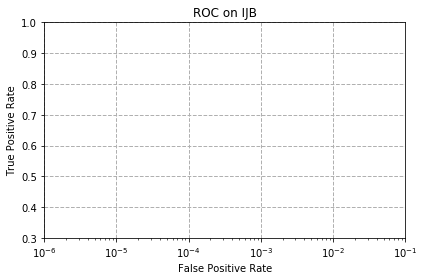

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_identity,0.0,0.0,0.000051,0.00179,0.011198,0.108759,VGGFace2,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/

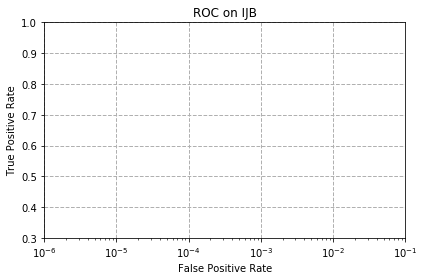

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.0,0.000102,0.001381,0.012374,0.130081,VGGFace2,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

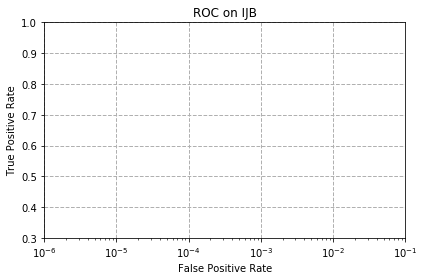

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_identity,0.0,0.0,0.0,0.00046,0.007619,0.094391,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: 

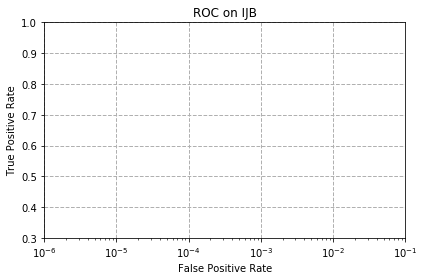

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.0,0.000102,0.000818,0.009357,0.102265,VGGFace2,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloadi

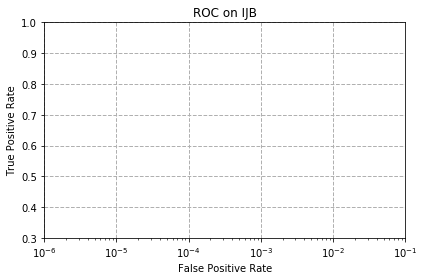

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.0,0.0,0.000511,0.008437,0.101191,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_ba

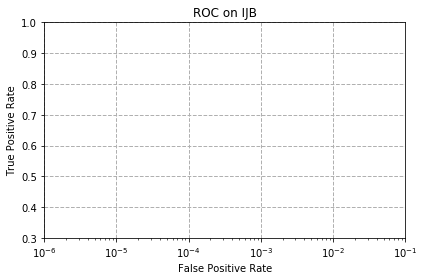

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.0,0.0,0.000614,0.008437,0.082272,Glint360k,ResNet100,PartialFC_r0.1,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload

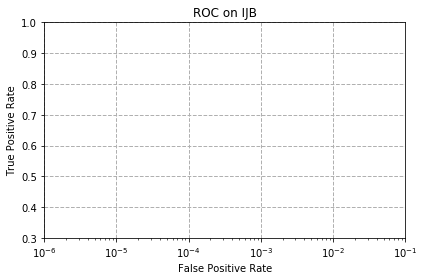

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.0,0.0,0.000614,0.010584,0.0948,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embe

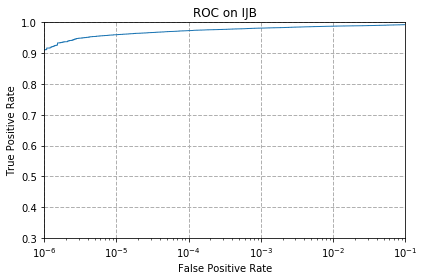

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_identity,0.911592,0.959963,0.973309,0.98149,0.987677,0.992739,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings f

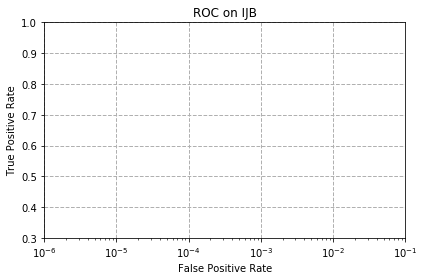

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_identity,0.0,0.000102,0.001176,0.008693,0.050468,0.278059,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/por

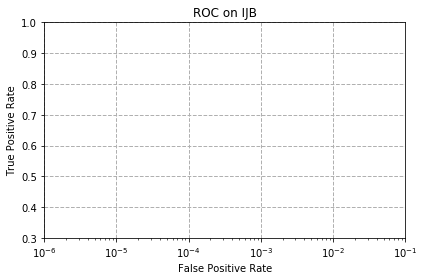

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_identity,0.0,0.0,0.000051,0.000511,0.008897,0.099299,Glint360k,ResNet100,PartialFC_r0.1,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/port

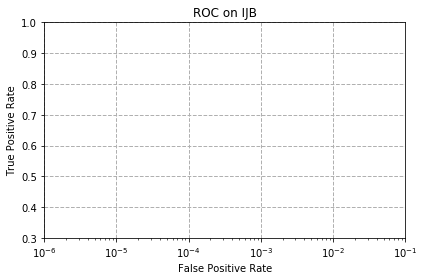

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_identity,0.0,0.0,0.000102,0.000716,0.008181,0.089635,Glint360k,ResNet100,PartialFC_r0.1,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/p

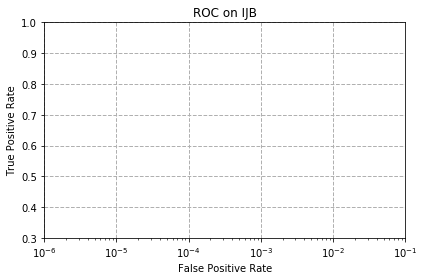

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.0,0.000205,0.00092,0.010175,0.103288,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/por

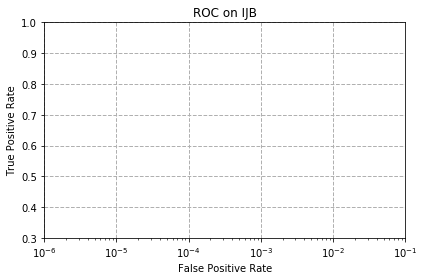

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_identity,0.0,0.0,0.0,0.000972,0.01176,0.112236,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz

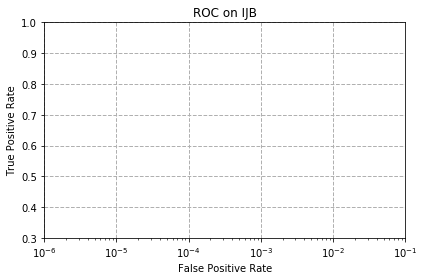

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.0,0.0,0.000614,0.010789,0.107992,Glint360k,ResNet100,PartialFC_r0.1,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: .

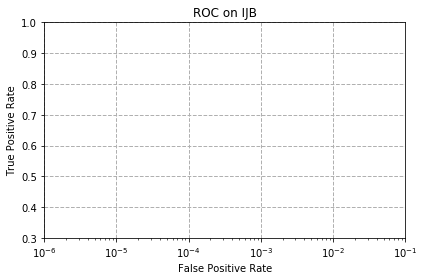

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.0,0.000051,0.001074,0.008999,0.093675,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz

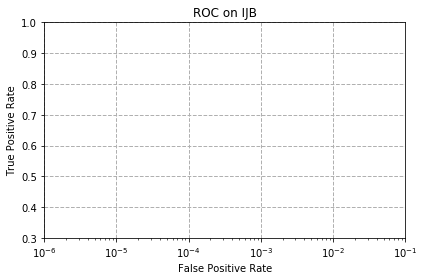

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.000051,0.000205,0.001023,0.008744,0.090607,Glint360k,ResNet100,PartialFC_r1.0,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload

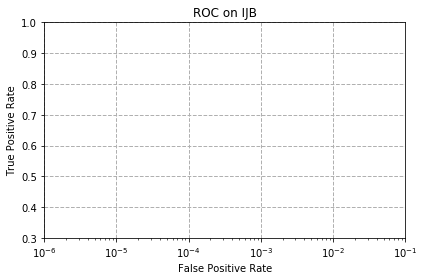

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.0,0.000205,0.001125,0.010738,0.107941,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embe

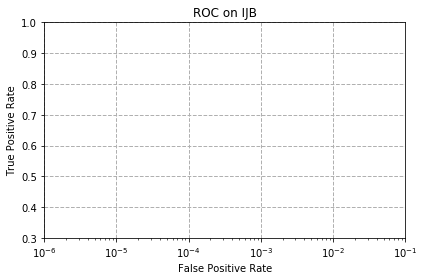

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_identity,0.000051,0.000256,0.001329,0.007823,0.04648,0.270133,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings f

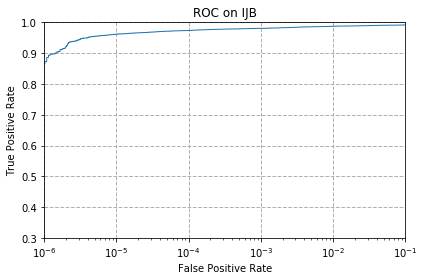

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_identity,0.872424,0.961497,0.973871,0.980621,0.987421,0.99187,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/por

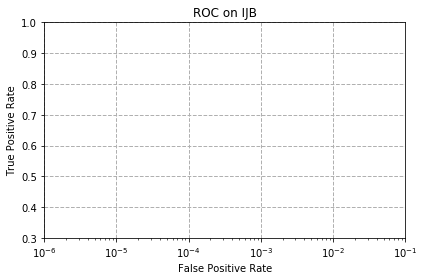

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_identity,0.0,0.0,0.000205,0.001483,0.010329,0.099146,Glint360k,ResNet100,PartialFC_r1.0,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/port

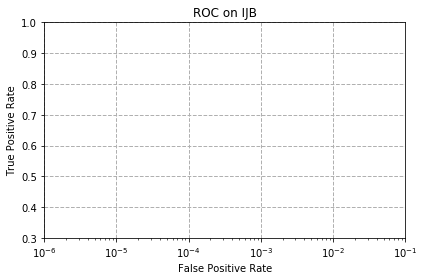

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_identity,0.0,0.0,0.000102,0.000562,0.006596,0.087999,Glint360k,ResNet100,PartialFC_r1.0,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/p

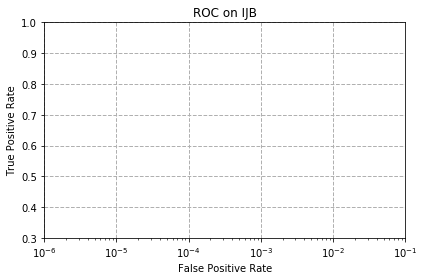

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.0,0.000102,0.001585,0.01401,0.120673,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/por

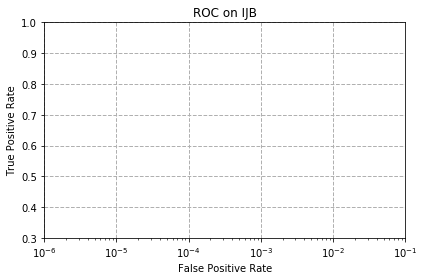

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_identity,0.0,0.0,0.000051,0.000562,0.007721,0.098123,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz

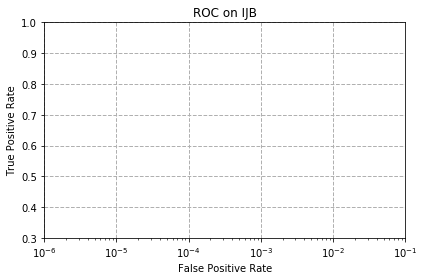

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.000051,0.000153,0.000767,0.009971,0.102828,Glint360k,ResNet100,PartialFC_r1.0,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: .

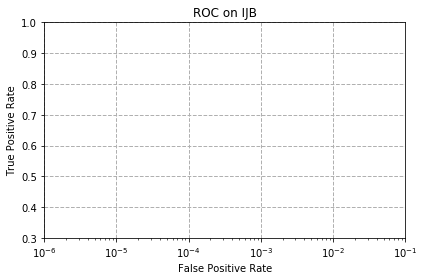

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.000051,0.000256,0.001892,0.011505,0.102674,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddi

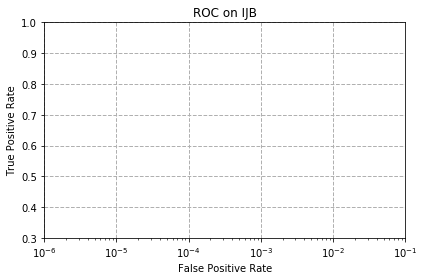

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.0,0.000102,0.001023,0.011556,0.116991,MS1M,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/re

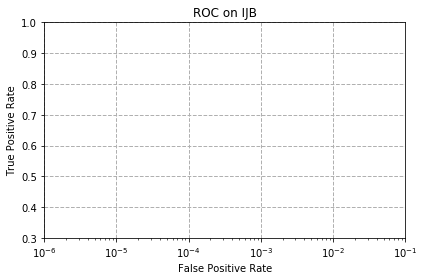

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.000051,0.000358,0.001176,0.01084,0.101191,MS1M,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup

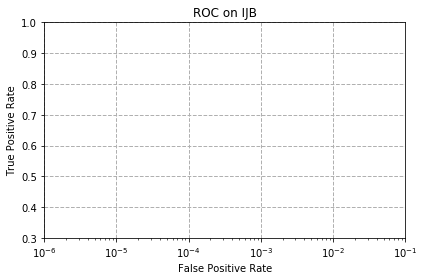

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_identity,0.0,0.0,0.000153,0.001074,0.008437,0.095209,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/po

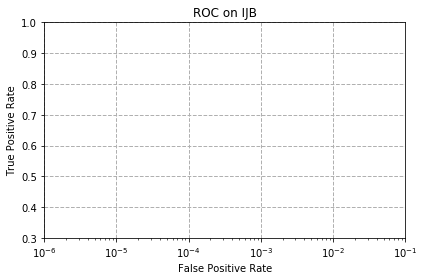

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_identity,0.0,0.0,0.000102,0.000767,0.010022,0.096334,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2

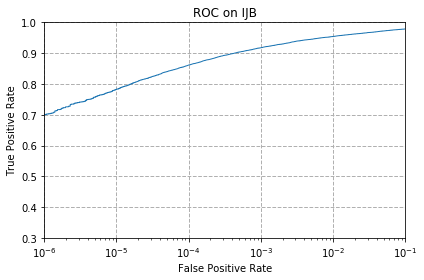

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_identity,0.701232,0.782329,0.861431,0.917574,0.954287,0.978627,MS1M,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/

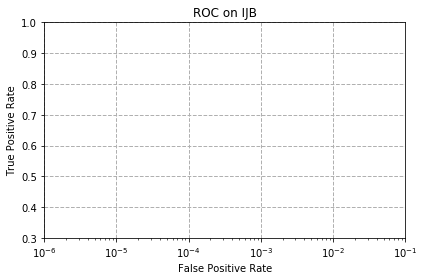

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_identity,0.0,0.0,0.000051,0.001023,0.01217,0.115969,MS1M,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-t

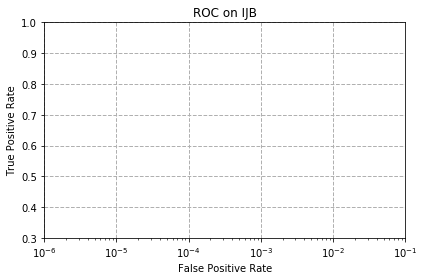

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.0,0.000102,0.000716,0.007312,0.082272,MS1M,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2

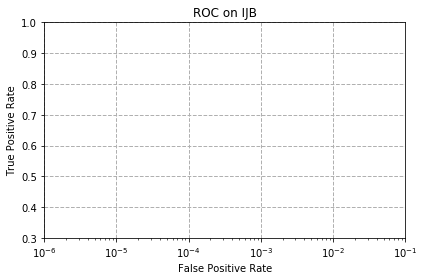

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_identity,0.0,0.0,0.000051,0.000972,0.009869,0.104668,MS1M,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedd

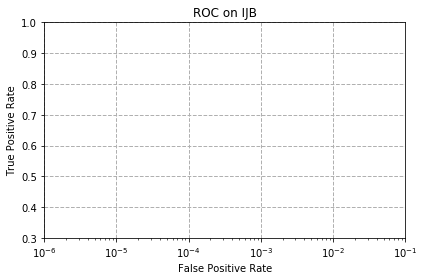

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.0,0.000051,0.000307,0.00767,0.091374,MS1M,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Relo

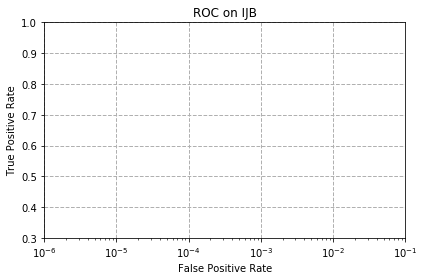

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.0,0.000153,0.001329,0.011658,0.107225,MS1M,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddin

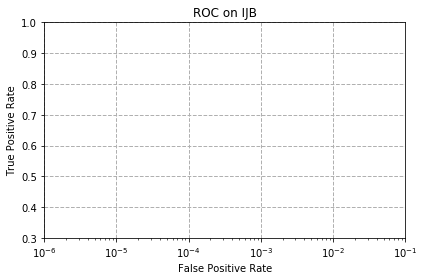

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.0,0.000205,0.001534,0.009102,0.079613,MS1M,MobileNetV2,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b

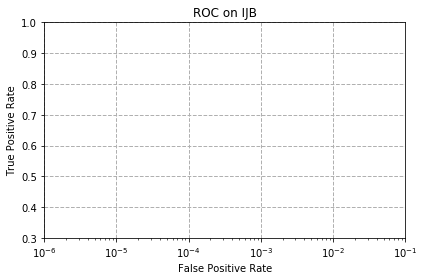

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.0,0.000102,0.000562,0.010994,0.108606,MS1M,MobileNetV2,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/da

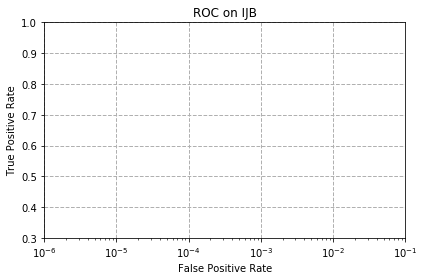

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_identity,0.0,0.0,0.000051,0.000767,0.009766,0.088204,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/porta

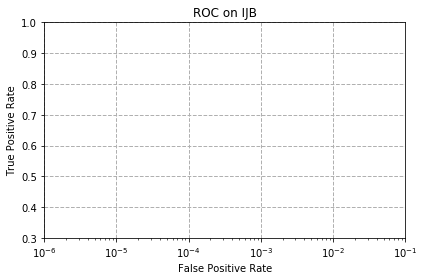

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_identity,0.0,0.0,0.000051,0.001227,0.008386,0.090863,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ij

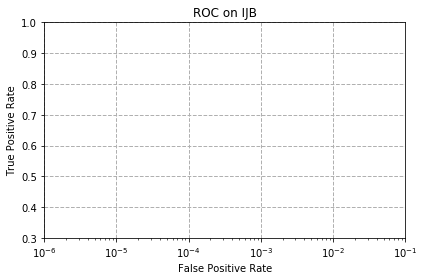

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_identity,0.0,0.0,0.000102,0.002454,0.014368,0.120877,MS1M,MobileNetV2,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijb

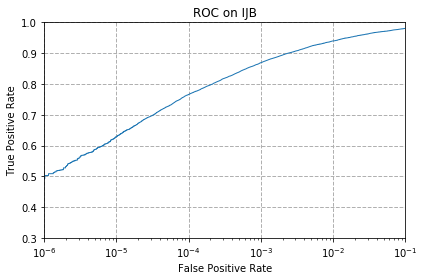

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_identity,0.502787,0.628982,0.765915,0.869254,0.939766,0.980723,MS1M,MobileNetV2,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/

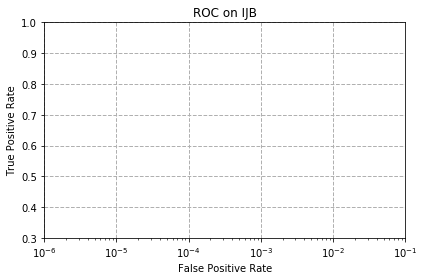

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.0,0.000051,0.000869,0.007977,0.08442,MS1M,MobileNetV2,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ij

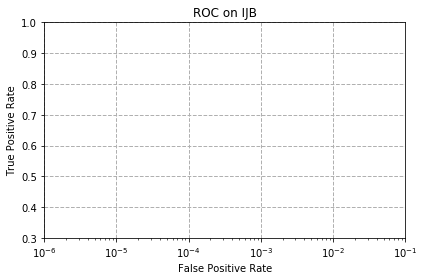

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_identity,0.0,0.0,0.000205,0.001534,0.009715,0.086925,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedding

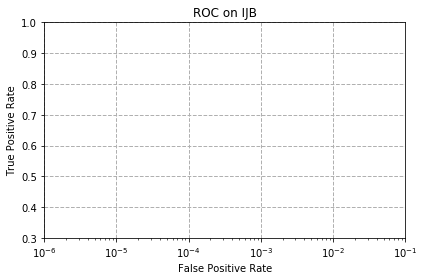

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.000051,0.000102,0.000665,0.007926,0.096232,MS1M,MobileNetV2,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload 

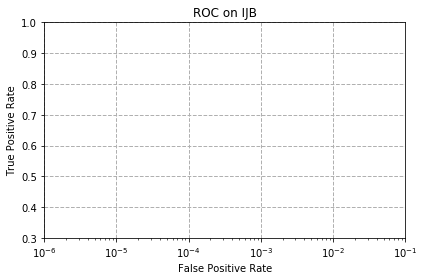

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.0,0.000307,0.001278,0.010994,0.107327,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embed

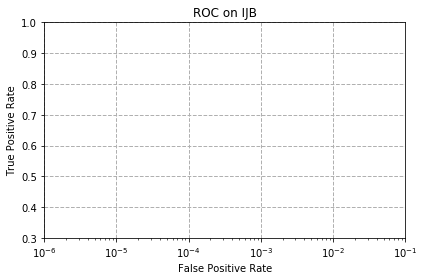

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.0,0.000102,0.001278,0.012476,0.113923,VGGFace2,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: 

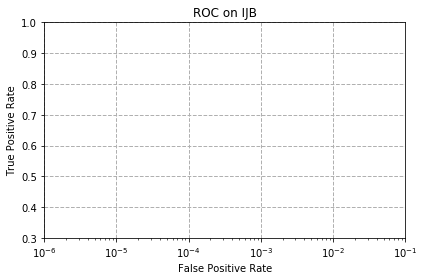

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.0,0.000051,0.00092,0.012885,0.128854,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nob

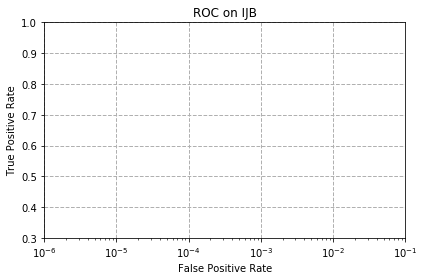

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_identity,0.0,0.0,0.000051,0.000818,0.010329,0.099146,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/da

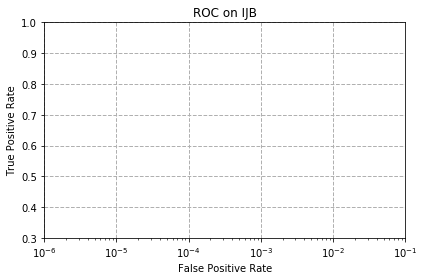

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_identity,0.000051,0.000256,0.000716,0.00225,0.013704,0.115099,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facene

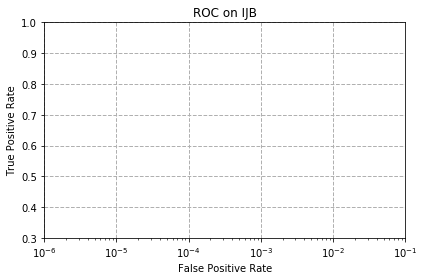

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_identity,0.0,0.0,0.000051,0.000716,0.007823,0.080738,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet

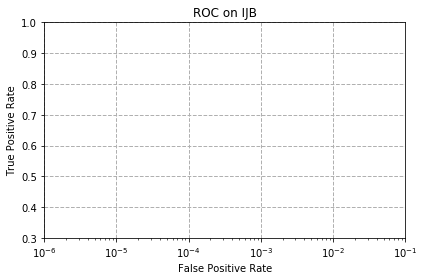

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_identity,0.0,0.0,0.000051,0.000665,0.008795,0.089226,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/face

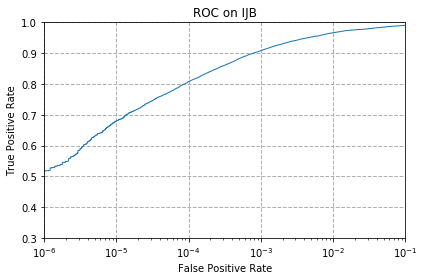

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_identity,0.518382,0.680728,0.807946,0.908473,0.96661,0.990183,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facene

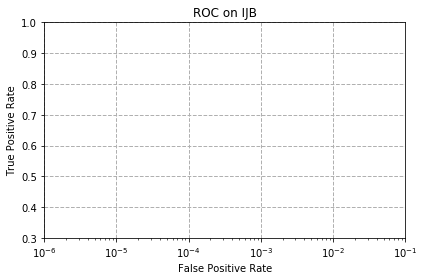

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_identity,0.0,0.000051,0.000716,0.004449,0.030066,0.211382,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

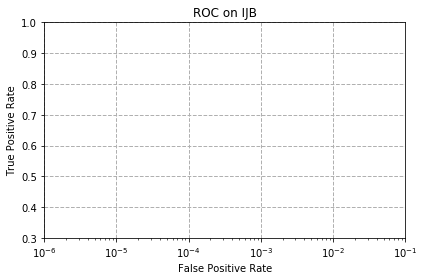

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.0,0.0,0.000562,0.009613,0.097663,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>>

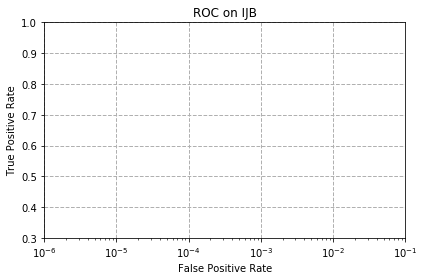

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.0,0.000153,0.000972,0.008897,0.101856,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddi

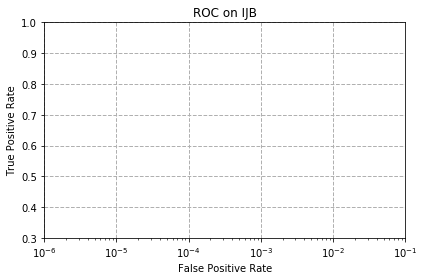

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.0,0.000153,0.00179,0.011045,0.10564,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

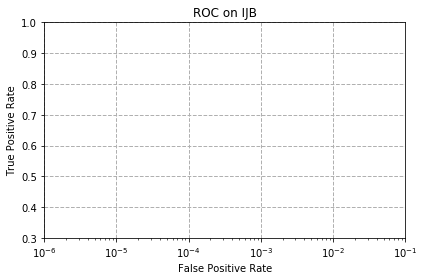

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.0,0.0,0.00046,0.009153,0.090147,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/dat

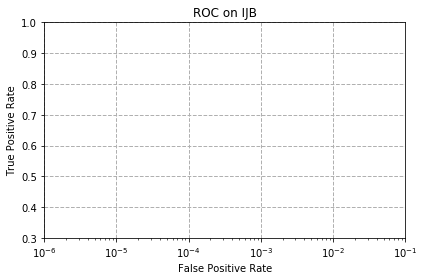

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_identity,0.0,0.0,0.000205,0.002148,0.010584,0.104004,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portab

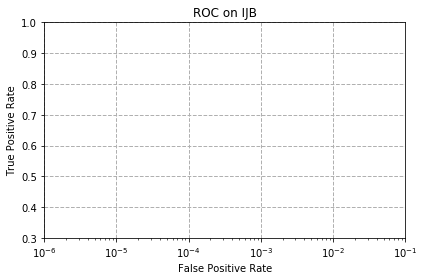

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_identity,0.0,0.000051,0.000153,0.000562,0.009153,0.090811,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_i

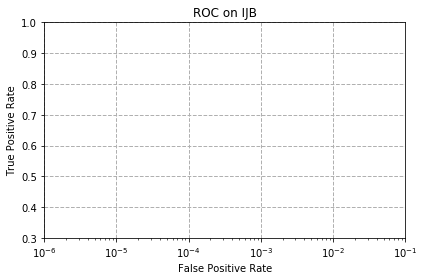

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_identity,0.0,0.0,0.000051,0.001329,0.011351,0.101652,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir

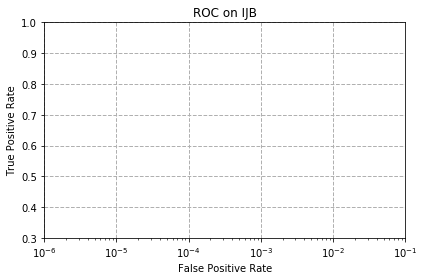

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_identity,0.0,0.0,0.000102,0.00046,0.008079,0.086465,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia

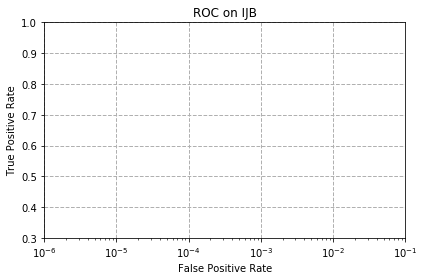

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.000256,0.001074,0.005318,0.031037,0.213632,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_i

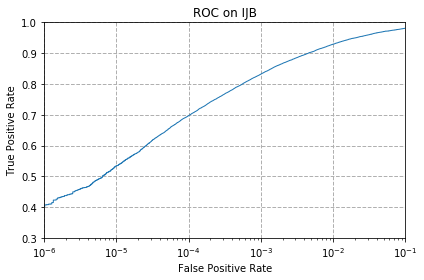

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_identity,0.407527,0.533875,0.697039,0.832132,0.929335,0.980979,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings

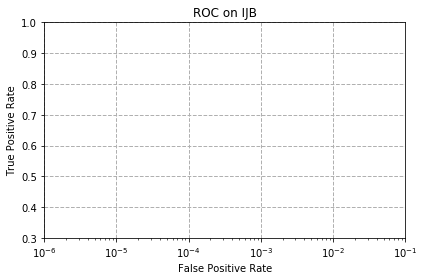

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.0,0.000051,0.000562,0.007465,0.101089,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (

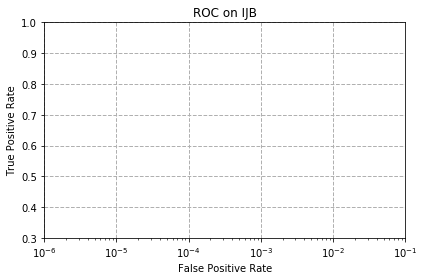

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.0,0.000051,0.000665,0.00905,0.097817,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Relo

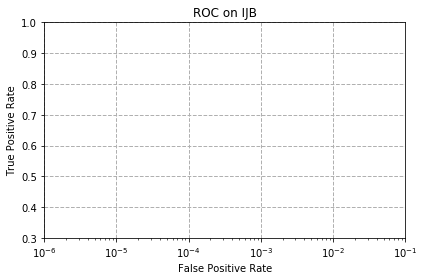

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.0,0.000102,0.001534,0.009613,0.106714,MS1M,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>

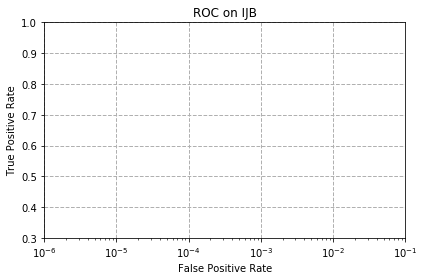

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.0,0.0,0.000614,0.008641,0.099044,MS1M,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloadin

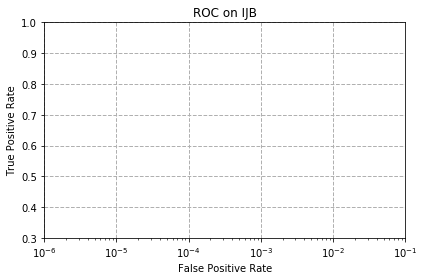

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_0_identity,0.0,0.000051,0.000153,0.001432,0.011812,0.107736,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from b

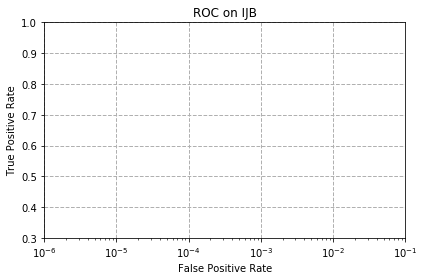

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_1_identity,0.0,0.0,0.000102,0.001074,0.00859,0.097101,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>

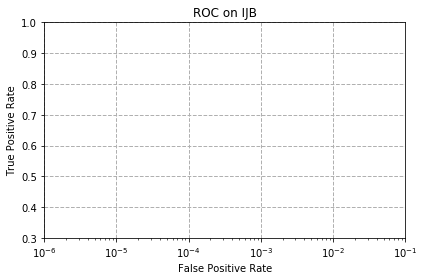

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_res50_identity,0.0,0.000051,0.000051,0.00046,0.010584,0.105026,MS1M,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>

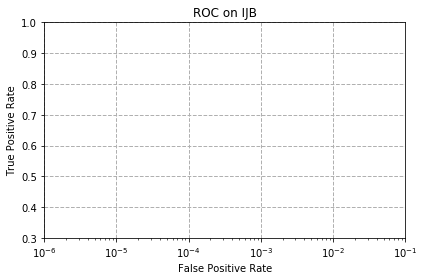

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_mbv2_identity,0.0,0.0,0.000051,0.00092,0.010329,0.099504,MS1M,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


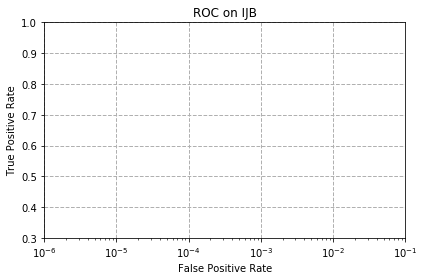

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.0,0.000051,0.001074,0.010942,0.097203,MS1M,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>

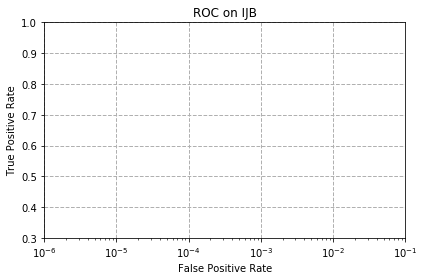

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_casia_ir2_ijbc_embs_identity,0.0,0.0,0.0,0.000562,0.008488,0.09255,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'prin

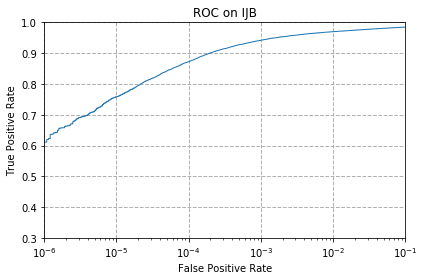

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.611188,0.758705,0.872322,0.941862,0.969832,0.984711,MS1M,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individ

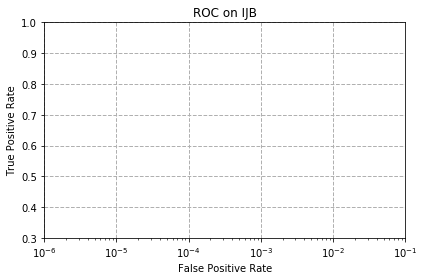

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.0,0.0,0.000051,0.000767,0.011863,0.108657,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': 

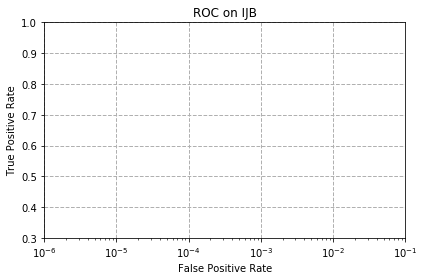

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_identity,0.0,0.000051,0.000205,0.000614,0.008488,0.096334,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_MS1MV2-ResNet100-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloadin

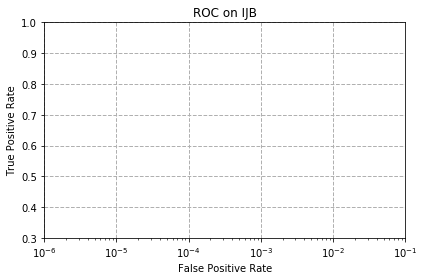

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_identity,0.0,0.0,0.000153,0.000767,0.008232,0.099146,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_VGG2-ResNet50-Arcface_IJBC_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_0_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backu

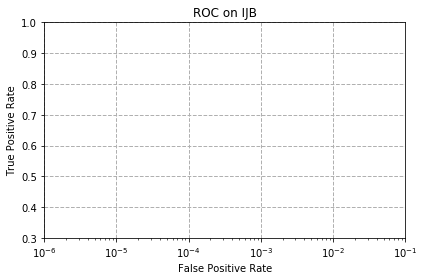

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_0_identity,0.0,0.000051,0.000102,0.000767,0.009102,0.093061,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_0_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_1_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJB

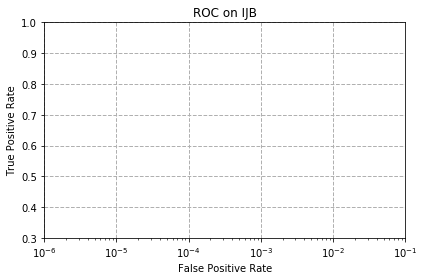

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_1_identity,0.0,0.000051,0.000051,0.000767,0.009766,0.104208,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_glint360k_r100FC_1_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_res50_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (l

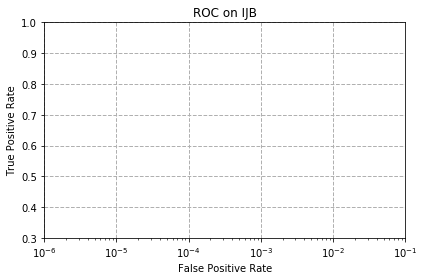

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_res50_identity,0.0,0.0,0.000153,0.000767,0.012272,0.108759,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_res50_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_mbv2_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (le

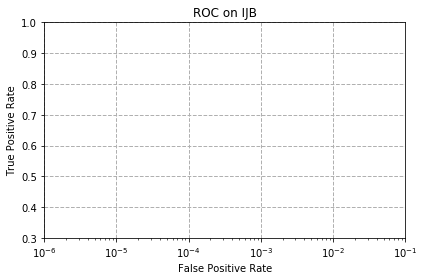

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_mbv2_identity,0.0,0.0,0.000102,0.001023,0.010942,0.107634,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_arc_mbv2_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_vggface2_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload 

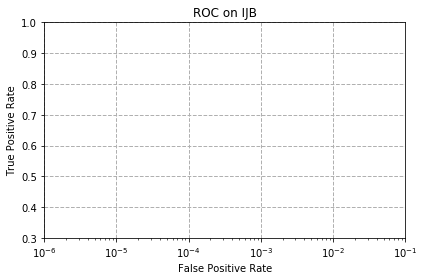

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_vggface2_ir2_ijbc_embs_identity,0.0,0.0,0.0,0.000307,0.008897,0.103953,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_vggface2_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_casia_ir2_ijbc_embs_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (l

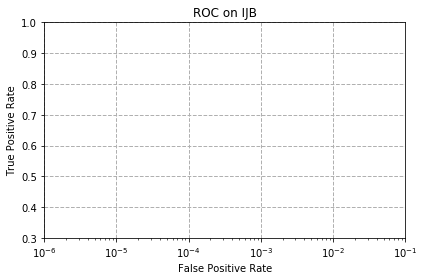

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_casia_ir2_ijbc_embs_identity,0.0,0.0,0.000051,0.000665,0.009613,0.106611,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_casia_ir2_ijbc_embs_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': Fals

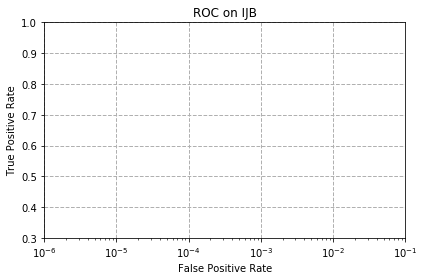

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity,0.0,0.0,0.000102,0.001023,0.01176,0.113208,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_msarcface_am_nosigma_identity.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am_nosigma.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': True, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, '

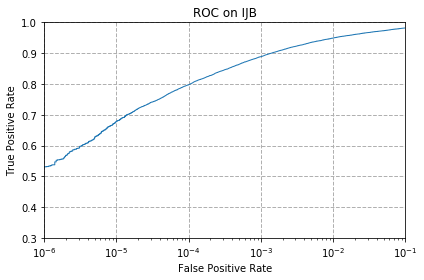

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity,0.531319,0.677456,0.797413,0.888787,0.949276,0.982001,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_nosigma_TO_ijbc_embs_pfe_sphere64_casia_am_nosigma_identity.npz.csv


In [12]:
for left_embs, left_dataset, left_architecture, left_head in embs_list_nosigma:
    for right_embs, right_dataset, right_architecture, right_head in embs_list_nosigma:

        try:
            #for pre_template_map in pre_template_map:
            save_result_name = '{}_TO_{}_identity'.format(left_embs.split('/')[-1].split('.')[0], right_embs.split('/')[-1].split('.')[0])
            save_result = '../../../../results/{}.npz'.format(save_result_name)
            args = Args(subset='IJBC',  
                is_bunch=False,
                restore_embs_left=left_embs,
                restore_embs_right=right_embs,
                fit_mapping=False,
                fit_flips=fit_flips,
                decay_coef=decay_coef,
                pre_template_map=pre_template_map,
                is_rotation_map=False,
                is_procrustes=True,
                save_result=save_result)
            df, fig = IJB.main(args)
            df['L_DATASET'] = left_dataset
            df['L_ARCH'] = left_architecture
            df['L_HEAD'] = left_head
            df['R_DATASET'] = right_dataset
            df['R_ARCH'] = right_architecture
            df['R_HEAD'] = right_head
            display(df)
            dataframes[save_result_name] = df
            print('saving to', args.save_result + '.csv')
            df.to_csv(args.save_result + '.csv')
        except Exception:
            traceback.print_exc()

# Rotation-only

<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/ins

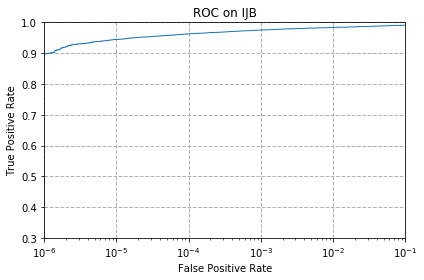

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.898451,0.944726,0.962827,0.975252,0.983638,0.990796,MS1MV2,ResNet100,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from back

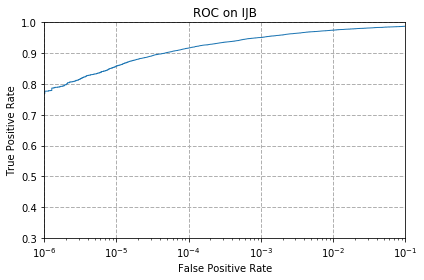

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.776653,0.858312,0.916552,0.951117,0.974843,0.987575,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_b

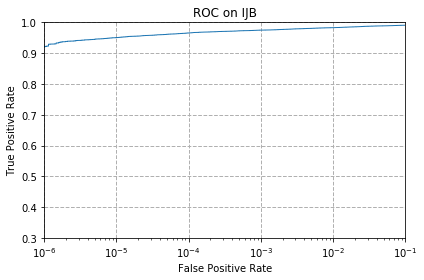

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation,0.922125,0.950708,0.965639,0.974843,0.983075,0.990796,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

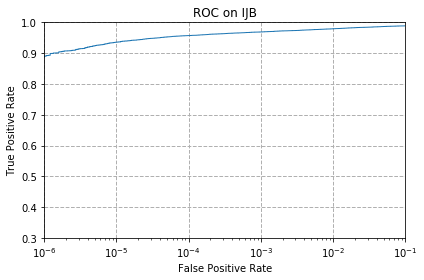

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation,0.891088,0.935982,0.957151,0.969065,0.979291,0.988955,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedd

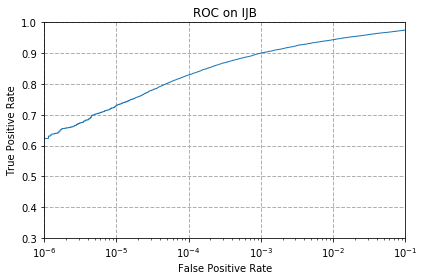

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation,0.623102,0.730276,0.829319,0.900087,0.943856,0.97515,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddi

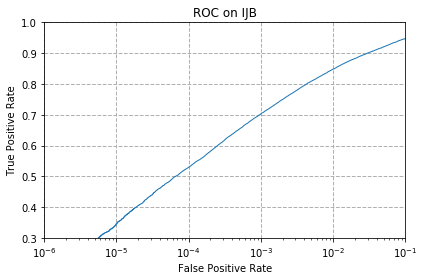

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.179731,0.345759,0.529427,0.702971,0.848238,0.947691,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embe

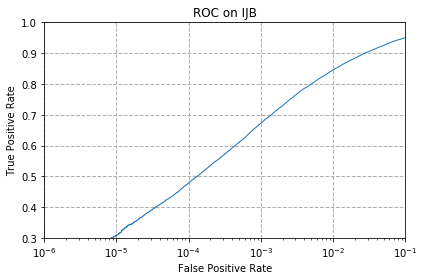

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.192105,0.308074,0.478192,0.673007,0.845938,0.950606,MS1MV2,ResNet100,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedd

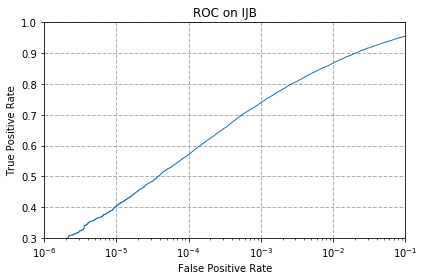

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation,0.258424,0.404612,0.570589,0.739531,0.868231,0.956282,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from back

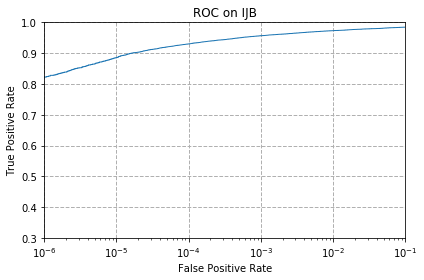

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.822774,0.885412,0.930051,0.956844,0.973258,0.98466,MS1MV2,ResNet100,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading f

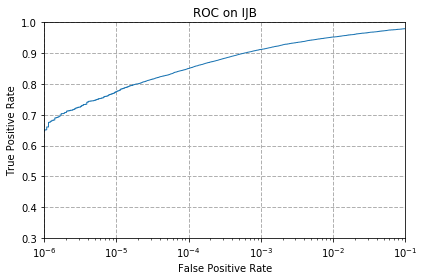

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.651276,0.774965,0.850437,0.912154,0.952498,0.979905,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from ba

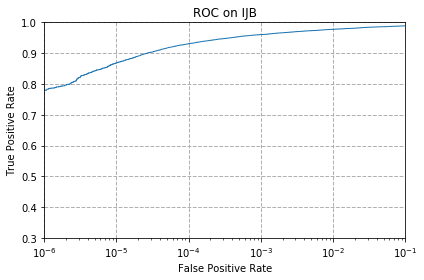

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.779976,0.868282,0.93092,0.960423,0.977604,0.988955,VGGFace2,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJ

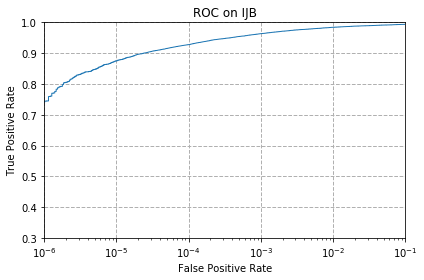

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.744439,0.875083,0.927852,0.963491,0.984098,0.993864,VGGFace2,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz

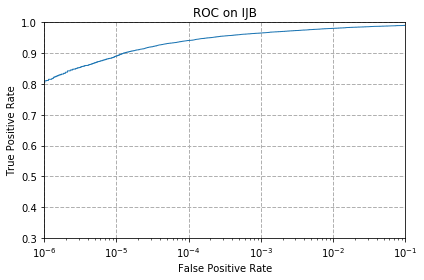

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation,0.810452,0.890883,0.941402,0.965639,0.980723,0.990438,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>

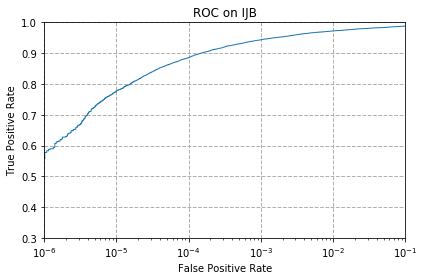

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation,0.577798,0.777522,0.88577,0.943856,0.972388,0.987984,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from

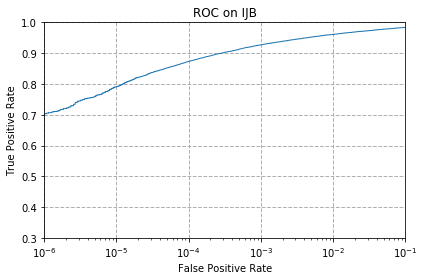

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation,0.70384,0.790919,0.873447,0.927034,0.961037,0.983893,VGGFace2,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from:

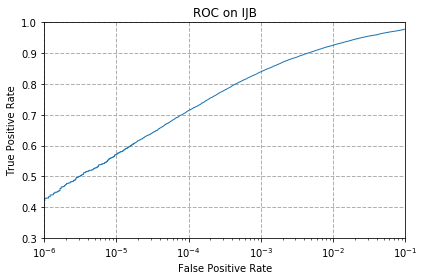

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.429002,0.570895,0.713862,0.839546,0.925807,0.97786,VGGFace2,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings fr

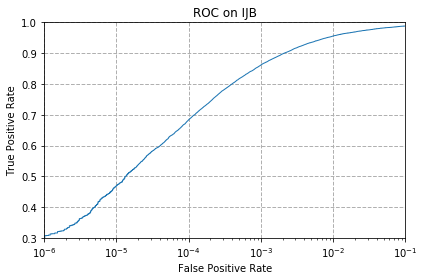

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.307665,0.470062,0.683131,0.861482,0.955975,0.988393,VGGFace2,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from

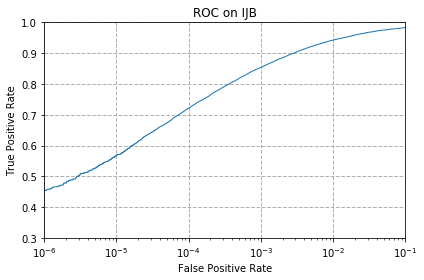

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation,0.454978,0.568441,0.721379,0.853659,0.942578,0.98328,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJB

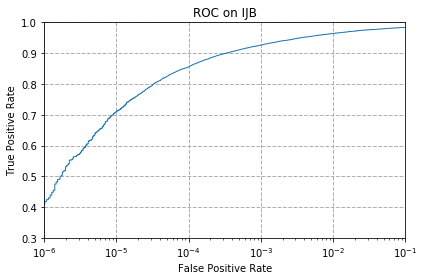

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.419083,0.71018,0.855602,0.926318,0.964156,0.983689,VGGFace2,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backu

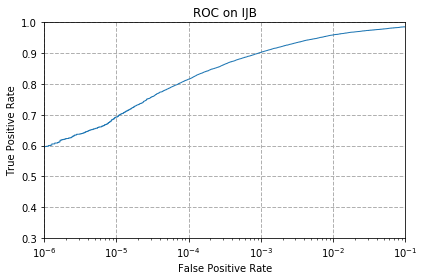

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.597126,0.692489,0.815667,0.902695,0.95935,0.985836,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC

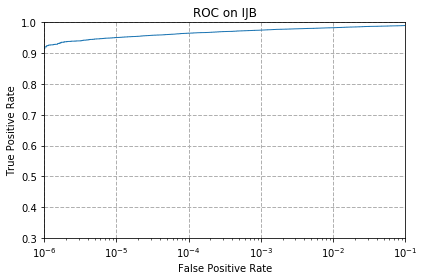

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.920796,0.95081,0.965025,0.974945,0.982768,0.989978,Glint360k,ResNet100,PartialFC_r0.1,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


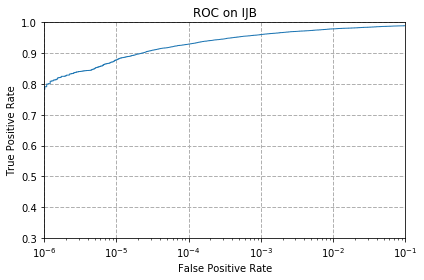

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.791277,0.8781,0.929488,0.960423,0.979087,0.989364,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload

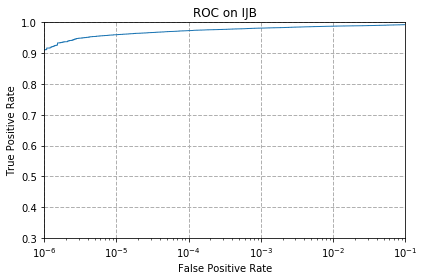

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_rotation,0.911592,0.959963,0.973309,0.98149,0.987677,0.992739,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

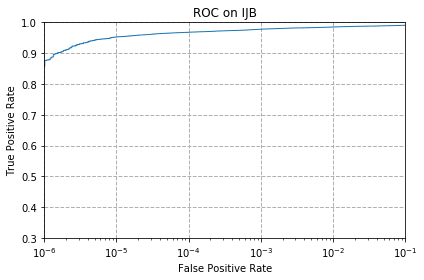

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_rotation,0.876413,0.952498,0.967991,0.97786,0.985069,0.990694,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

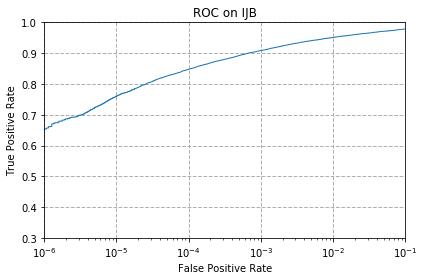

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_rotation,0.654344,0.760188,0.847574,0.908779,0.950964,0.978678,Glint360k,ResNet100,PartialFC_r0.1,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku

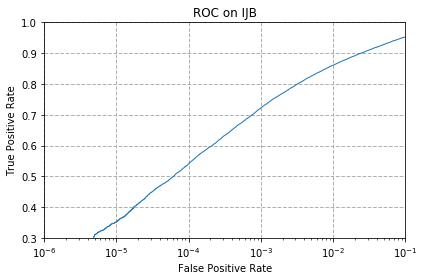

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.206473,0.352355,0.540932,0.722555,0.860919,0.953009,Glint360k,ResNet100,PartialFC_r0.1,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

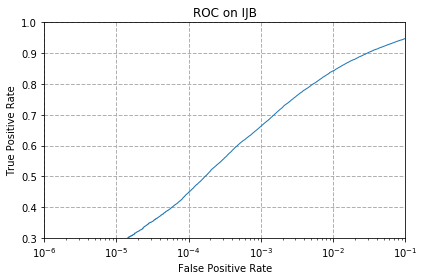

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.174106,0.273406,0.448228,0.662525,0.842614,0.948049,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

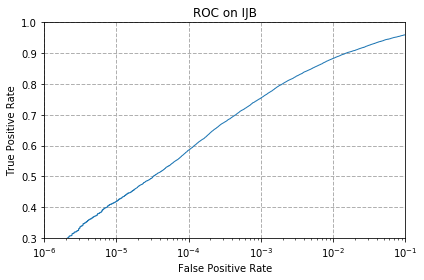

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_rotation,0.260265,0.418827,0.585366,0.754359,0.883162,0.960168,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


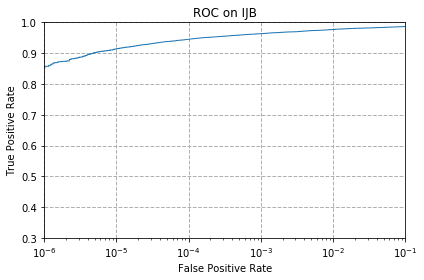

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.857238,0.913995,0.945237,0.96344,0.977041,0.986757,Glint360k,ResNet100,PartialFC_r0.1,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.

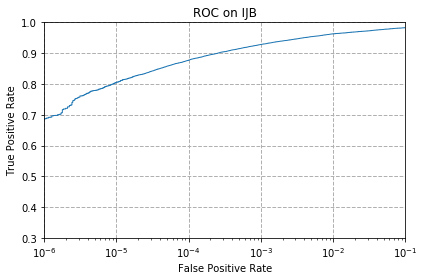

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.687682,0.805134,0.877077,0.928363,0.962775,0.982922,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.

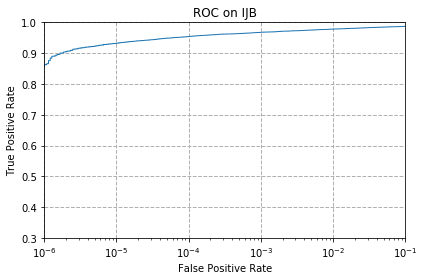

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.863016,0.932147,0.954185,0.967889,0.978269,0.987319,Glint360k,ResNet100,PartialFC_r1.0,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


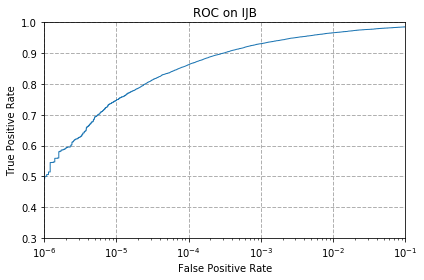

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.50023,0.746791,0.862709,0.930971,0.966355,0.985683,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload 

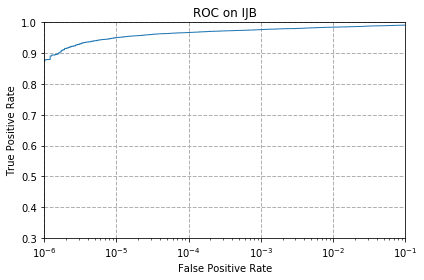

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_rotation,0.878765,0.950453,0.967326,0.976581,0.984507,0.991307,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 

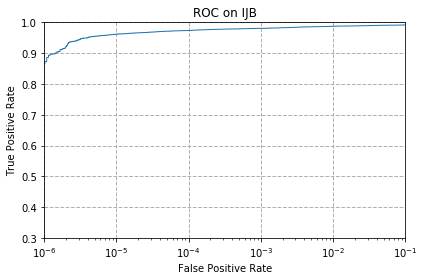

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_rotation,0.872424,0.961497,0.973871,0.980621,0.987421,0.99187,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

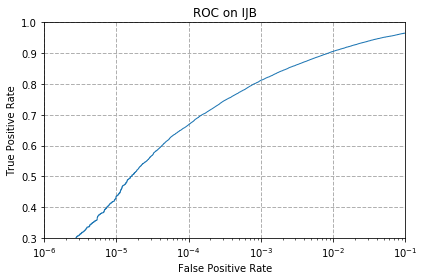

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_rotation,0.224625,0.435701,0.667587,0.811934,0.905558,0.965383,Glint360k,ResNet100,PartialFC_r1.0,MS1M,ResNet50,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku

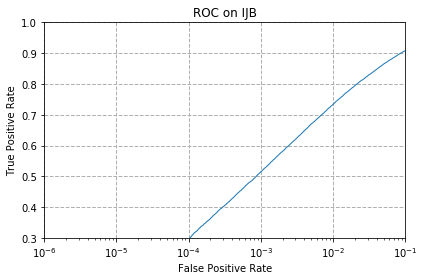

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.016209,0.095669,0.295188,0.514956,0.73452,0.90837,Glint360k,ResNet100,PartialFC_r1.0,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

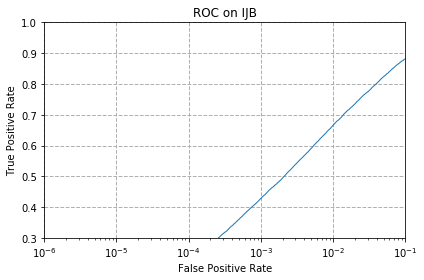

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.016669,0.070001,0.215473,0.428593,0.666258,0.882395,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

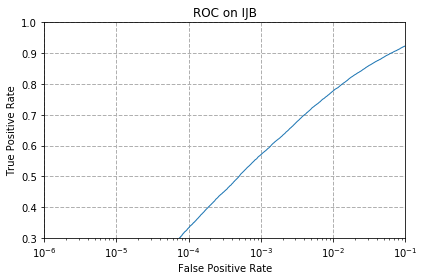

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_rotation,0.035997,0.136217,0.332771,0.570589,0.777471,0.923812,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


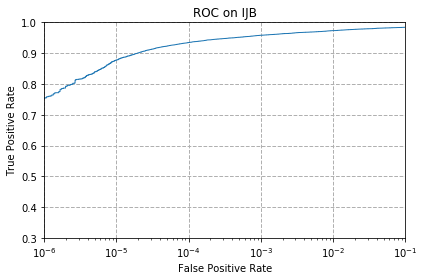

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.755279,0.877589,0.934653,0.958174,0.973309,0.984456,Glint360k,ResNet100,PartialFC_r1.0,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.

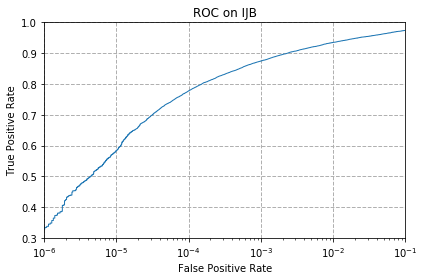

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.334356,0.58465,0.777778,0.874521,0.935062,0.974025,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embe

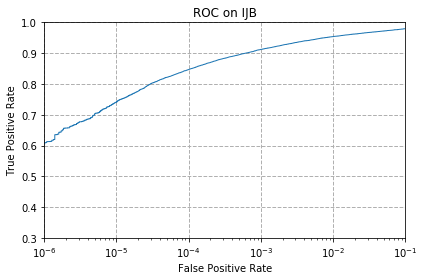

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.609756,0.74132,0.847062,0.912256,0.953981,0.979547,MS1M,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings 

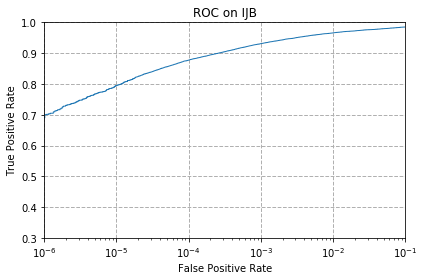

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.700465,0.794856,0.877282,0.931124,0.96615,0.98512,MS1M,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red

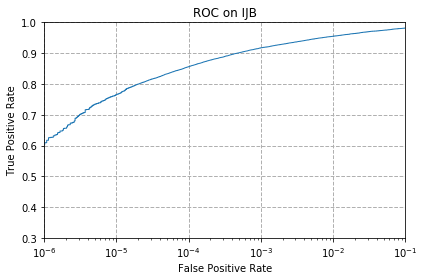

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_rotation,0.609449,0.765864,0.856113,0.91737,0.955003,0.981695,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobac

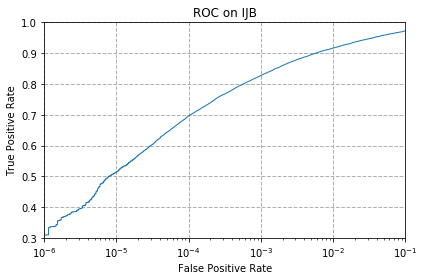

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_rotation,0.30971,0.514649,0.696017,0.827376,0.916705,0.972491,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models

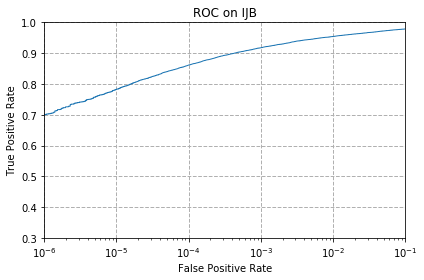

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_rotation,0.701232,0.782329,0.861431,0.917574,0.954287,0.978627,MS1M,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/a

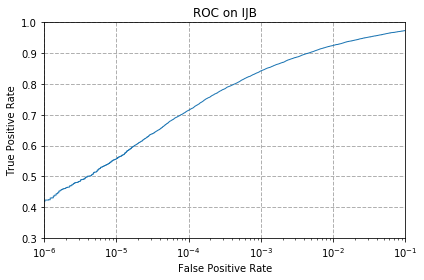

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.42302,0.556987,0.71468,0.842512,0.924988,0.973718,MS1M,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/model

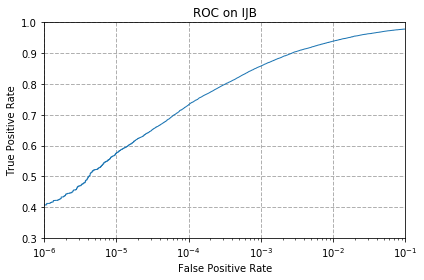

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.40768,0.575906,0.732883,0.858414,0.939203,0.978627,MS1M,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/

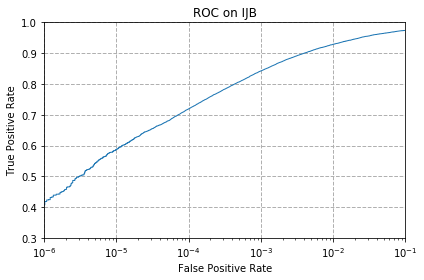

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_rotation,0.418469,0.587667,0.719282,0.842409,0.928926,0.974229,MS1M,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings 

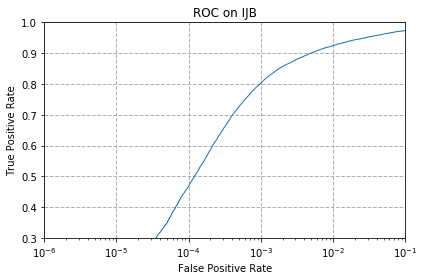

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.036662,0.136013,0.468119,0.802373,0.924324,0.973616,MS1M,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) emb

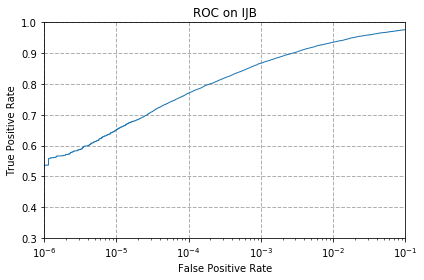

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.536381,0.651327,0.770312,0.867771,0.935675,0.976632,MS1M,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embed

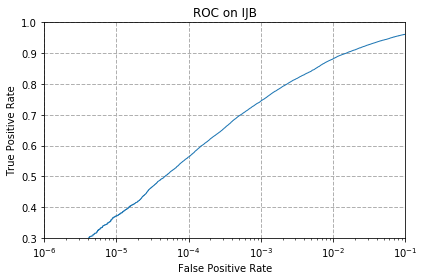

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.16434,0.371887,0.563277,0.744593,0.881884,0.961548,MS1M,MobileNetV2,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings fro

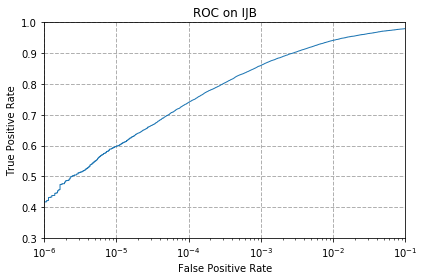

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.417549,0.597996,0.740349,0.859897,0.941709,0.979751,MS1M,MobileNetV2,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

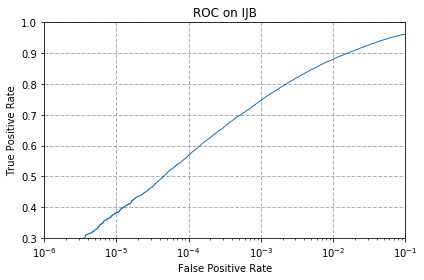

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_rotation,0.23388,0.38196,0.569157,0.746945,0.880299,0.96206,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup

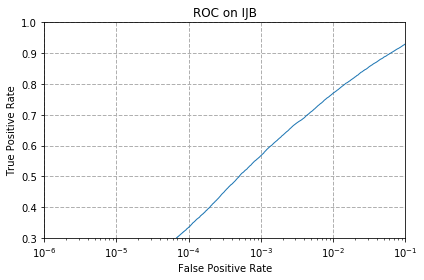

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_rotation,0.053076,0.143376,0.334458,0.567163,0.770261,0.930357,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arc

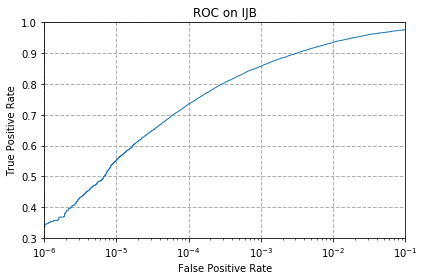

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_rotation,0.344685,0.553664,0.735082,0.8578,0.935368,0.97607,MS1M,MobileNetV2,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arc

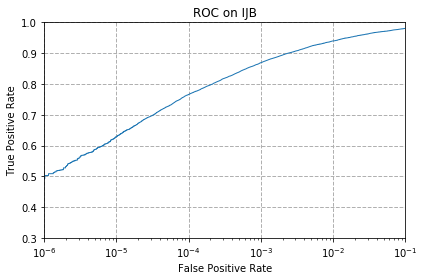

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.502787,0.628982,0.765915,0.869254,0.939766,0.980723,MS1M,MobileNetV2,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/a

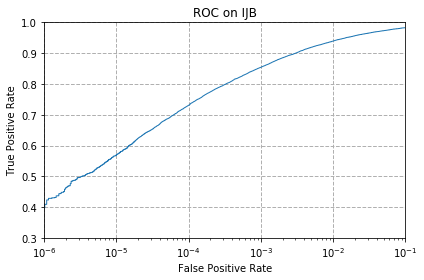

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.409367,0.569515,0.730787,0.85417,0.93951,0.982768,MS1M,MobileNetV2,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/arc

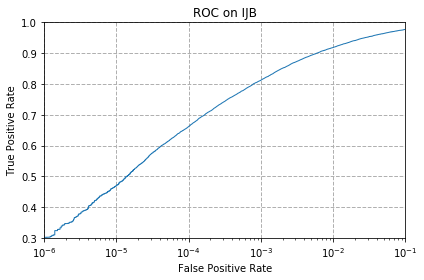

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_rotation,0.302296,0.470011,0.661656,0.81219,0.918392,0.977093,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings fro

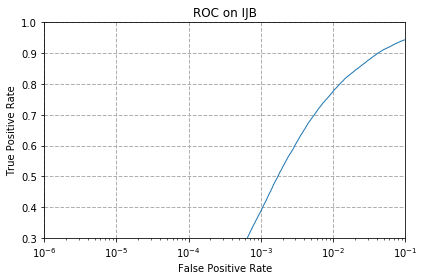

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.000102,0.003017,0.04832,0.387023,0.775937,0.944317,MS1M,MobileNetV2,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedd

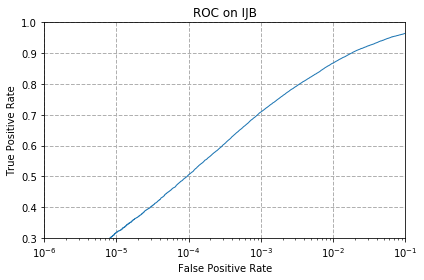

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.18239,0.318505,0.50519,0.709056,0.868385,0.964616,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) em

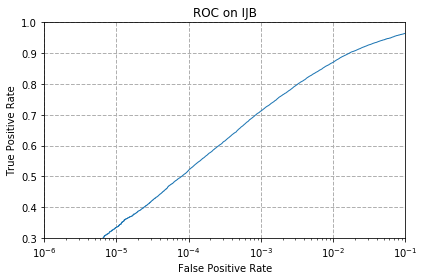

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.181981,0.334151,0.51966,0.71197,0.870583,0.964872,VGGFace2,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedd

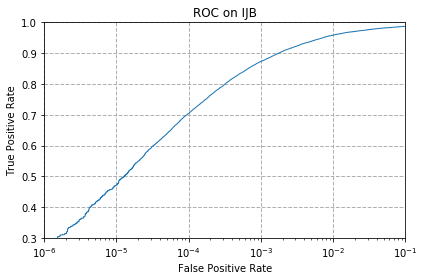

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.276014,0.471442,0.704198,0.873191,0.958634,0.987779,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /

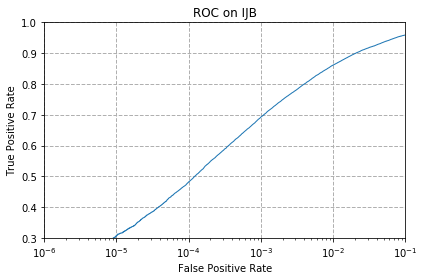

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation,0.162908,0.307409,0.481771,0.692233,0.861635,0.959503,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

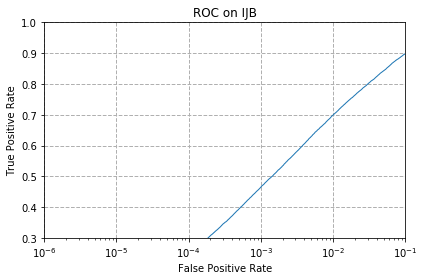

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation,0.034821,0.096232,0.248862,0.465153,0.699289,0.8984,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mo

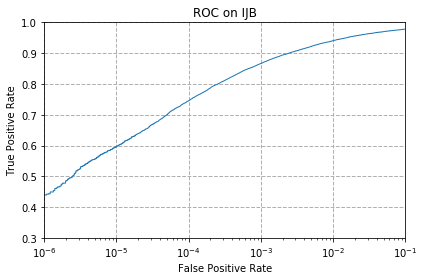

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation,0.439843,0.597484,0.745462,0.866544,0.94084,0.978422,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mod

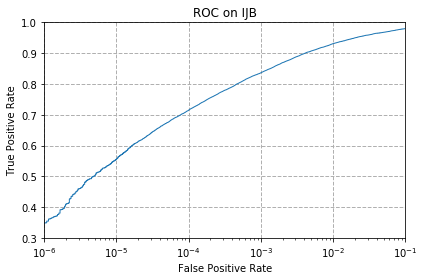

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.349389,0.555913,0.715243,0.836325,0.931073,0.980109,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom

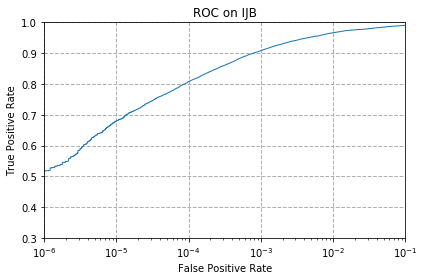

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.518382,0.680728,0.807946,0.908473,0.96661,0.990183,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/mo

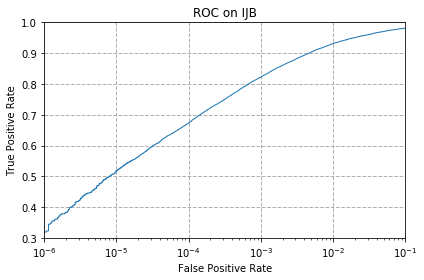

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation,0.319834,0.518433,0.673212,0.822212,0.931329,0.981643,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedd

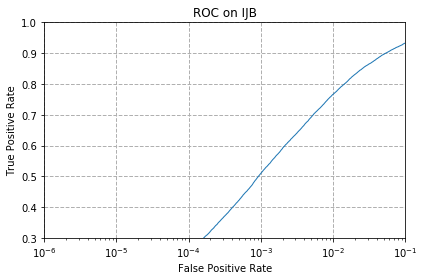

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.023879,0.088153,0.253771,0.509792,0.76658,0.933221,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left

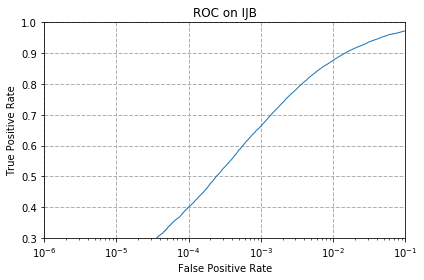

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.068313,0.199468,0.400726,0.662729,0.876617,0.97244,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embe

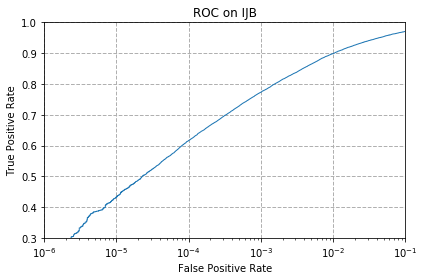

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.259958,0.432837,0.616454,0.773227,0.898911,0.970752,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from

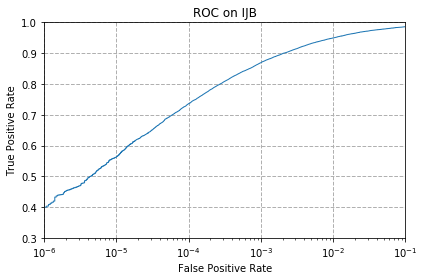

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.400368,0.563532,0.736156,0.869049,0.94943,0.986245,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/n

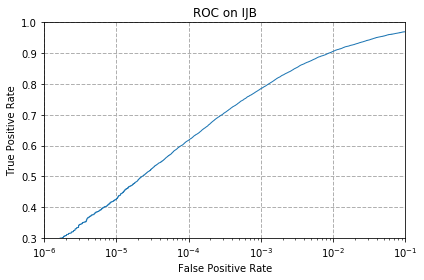

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation,0.256532,0.426446,0.617579,0.784987,0.906018,0.970036,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/

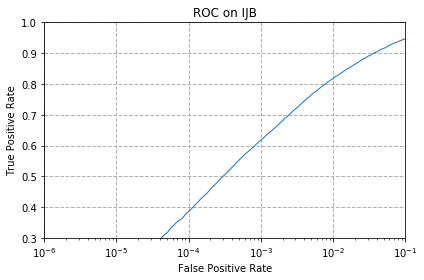

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation,0.091425,0.188577,0.386256,0.617119,0.81853,0.946413,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/face

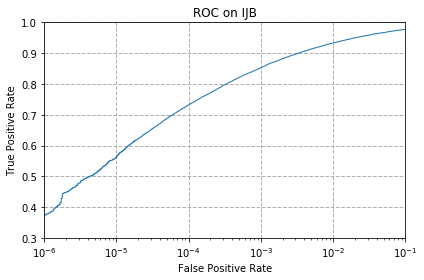

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation,0.375569,0.562101,0.732372,0.852994,0.933528,0.977655,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/facen

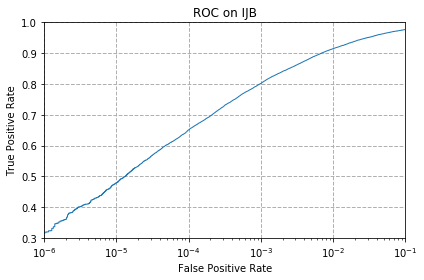

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.318914,0.47947,0.650918,0.801708,0.914557,0.976837,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/fa

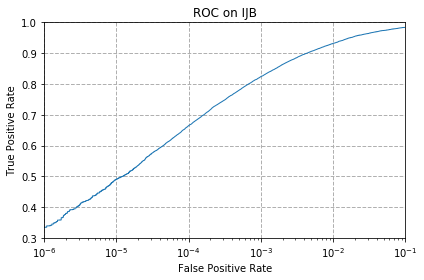

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.335072,0.490617,0.664826,0.824104,0.93184,0.983944,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/data/portable/tbiom/models/fac

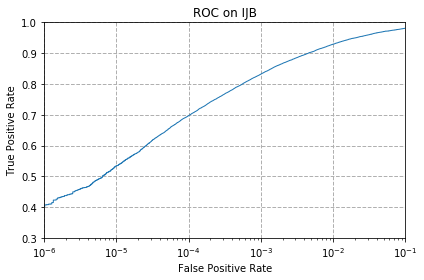

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation,0.407527,0.533875,0.697039,0.832132,0.929335,0.980979,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from

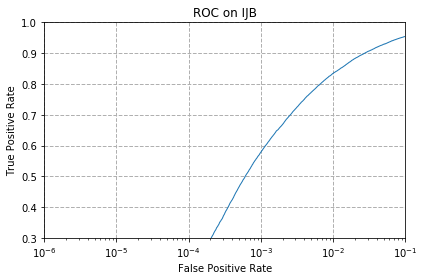

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.000665,0.011045,0.175538,0.578463,0.834586,0.954543,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddi

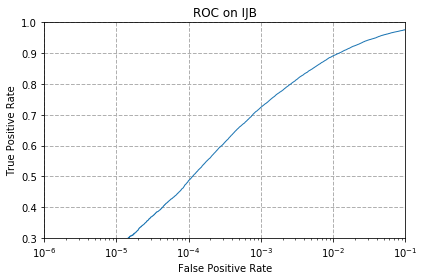

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.127269,0.274838,0.486271,0.724242,0.891292,0.976326,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from ba

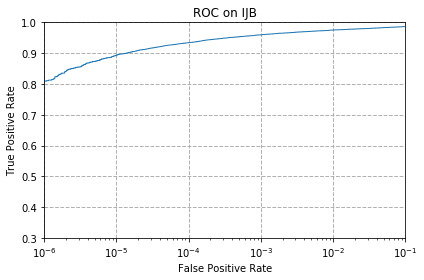

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.809787,0.893082,0.934346,0.959554,0.975354,0.986501,MS1M,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading

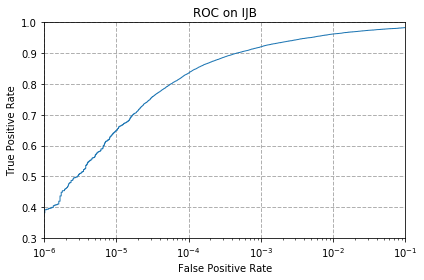

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.391931,0.649128,0.835404,0.920744,0.962315,0.983177,MS1M,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup

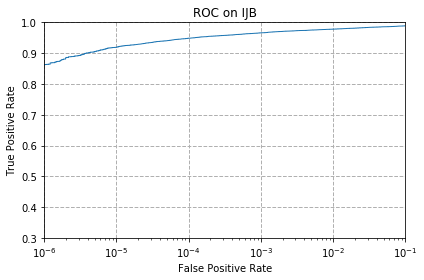

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_rotation,0.863323,0.919262,0.948612,0.966099,0.978115,0.988853,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC

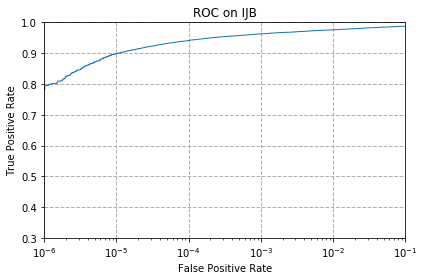

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_rotation,0.794754,0.898502,0.941249,0.962673,0.97607,0.98783,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (le

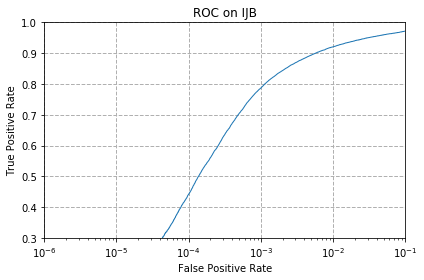

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_rotation,0.034412,0.134888,0.442246,0.786982,0.920693,0.971621,MS1M,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (lef

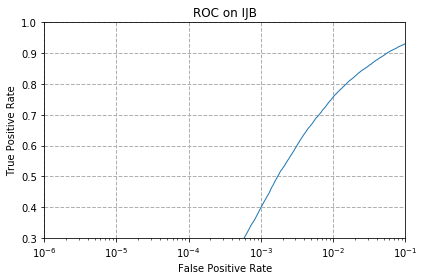

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.000818,0.006647,0.067393,0.398374,0.757171,0.931329,MS1M,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (

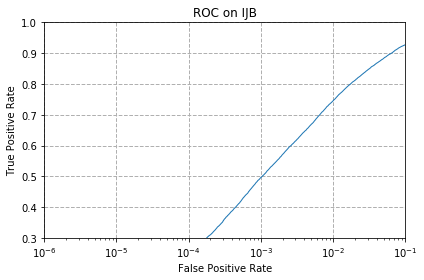

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.013806,0.075727,0.244669,0.496242,0.745718,0.927596,MS1M,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (le

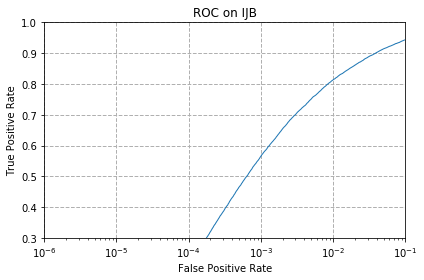

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_rotation,0.002761,0.025669,0.215524,0.565475,0.813571,0.943498,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloadin

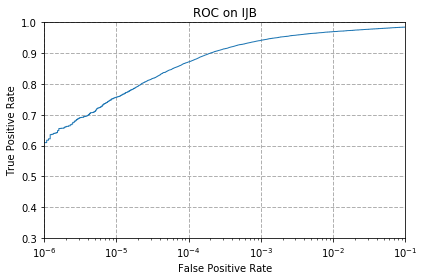

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.609756,0.757171,0.871759,0.941913,0.969883,0.984814,MS1M,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> R

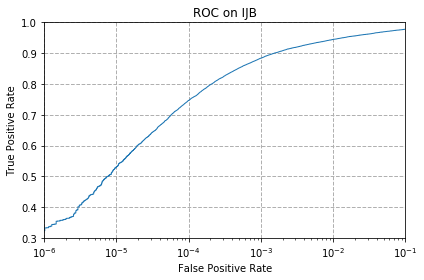

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.332771,0.531216,0.746587,0.883776,0.944726,0.977911,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading

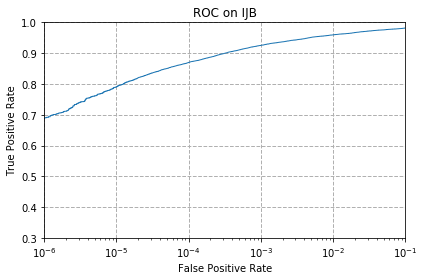

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.690699,0.79051,0.869714,0.925346,0.959759,0.981746,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup

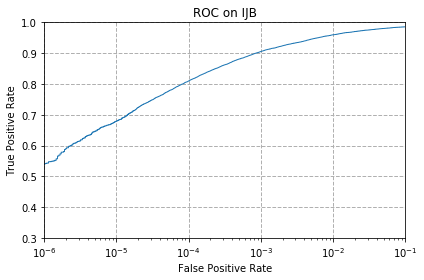

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.542057,0.678938,0.809685,0.905354,0.95981,0.985683,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_bac

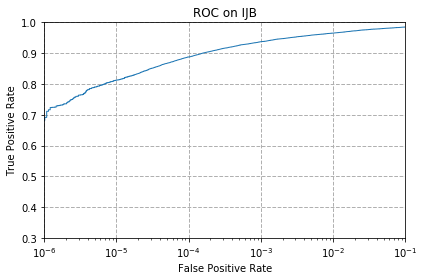

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_rotation,0.691722,0.812446,0.887713,0.93726,0.965179,0.985018,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz 

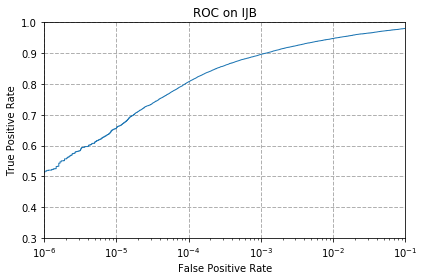

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_rotation,0.517053,0.656542,0.806974,0.89615,0.947691,0.980518,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddin

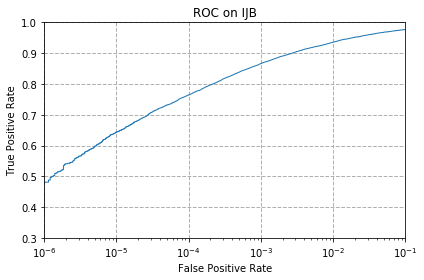

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_rotation,0.481209,0.644015,0.764688,0.866391,0.93588,0.977041,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedding

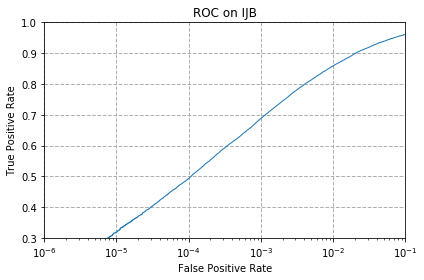

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.203661,0.319118,0.493225,0.687989,0.858976,0.96119,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embedd

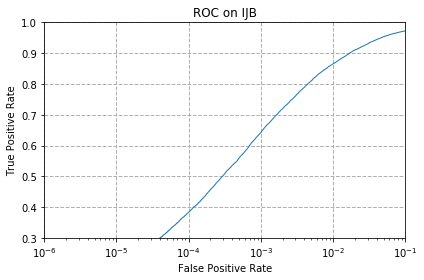

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.08263,0.197474,0.38329,0.642379,0.865368,0.972491,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddin

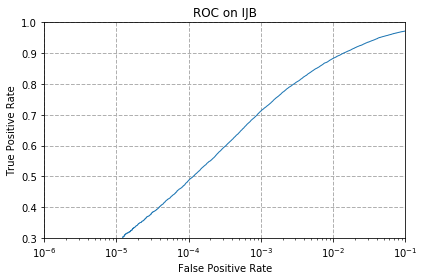

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_rotation,0.156363,0.285933,0.487038,0.71243,0.883009,0.97203,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup

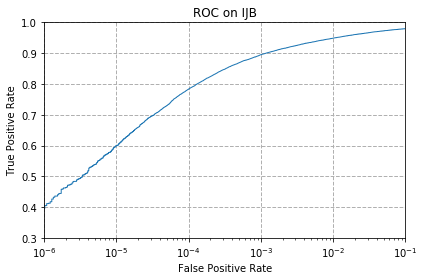

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.405328,0.599274,0.783249,0.895178,0.948714,0.979649,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading fr

In [ ]:
for left_embs, left_dataset, left_architecture, left_head in embs_list:
    for right_embs, right_dataset, right_architecture, right_head in embs_list:
        if left_embs == right_embs:
            fit_mapping=False
        else:
            fit_mapping=True

        try:
            #for pre_template_map in pre_template_map:
            save_result_name = '{}_TO_{}_N11856_rotation'.format(left_embs.split('/')[-1].split('.')[0], right_embs.split('/')[-1].split('.')[0])
            save_result = '../../../../results/{}.npz'.format(save_result_name)
            args = Args(subset='IJBC',  
                is_bunch=False,
                restore_embs_left=left_embs,
                restore_embs_right=right_embs,
                fit_mapping=fit_mapping,
                fit_flips=fit_flips,
                decay_coef=decay_coef,
                pre_template_map=pre_template_map,
                is_rotation_map=is_rotation_map,
                is_wahba=True,
                is_procrustes=True,
                save_result=save_result)
            df, fig = IJB.main(args)
            df['L_DATASET'] = left_dataset
            df['L_ARCH'] = left_architecture
            df['L_HEAD'] = left_head
            df['R_DATASET'] = right_dataset
            df['R_ARCH'] = right_architecture
            df['R_HEAD'] = right_head
            display(df)
            dataframes[save_result_name] = df
            print('saving to', args.save_result + '.csv')
            df.to_csv(args.save_result + '.csv')
        except Exception:
            traceback.print_exc()

# no face detector scores

<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/d

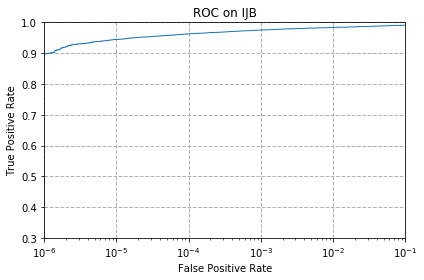

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.898451,0.944726,0.962827,0.975252,0.983638,0.990796,MS1MV2,ResNet100,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log':

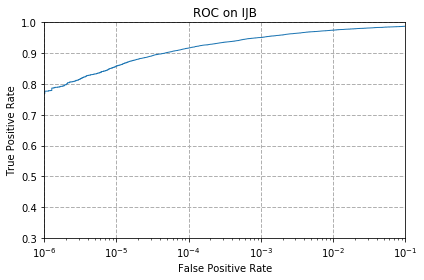

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.776653,0.858312,0.916552,0.951117,0.974843,0.987575,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>>

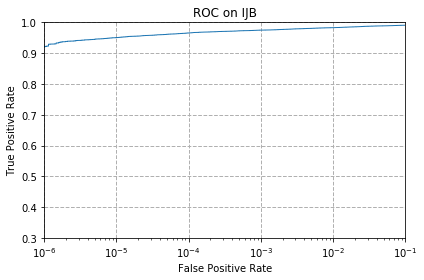

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation,0.922125,0.950708,0.965639,0.974843,0.983075,0.990796,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloadi

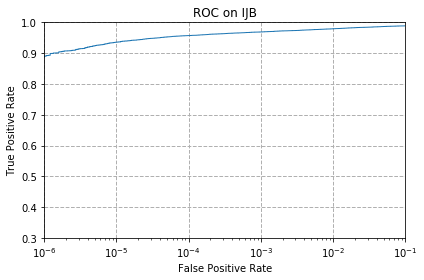

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation,0.891088,0.935982,0.957151,0.969065,0.979291,0.988955,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.n

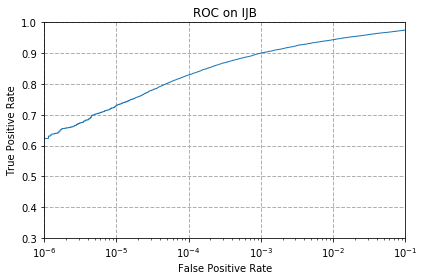

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation,0.623102,0.730276,0.829319,0.900087,0.943856,0.97515,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

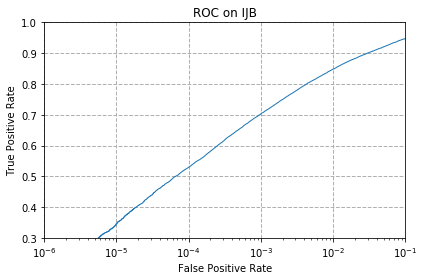

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.179731,0.345759,0.529427,0.702971,0.848238,0.947691,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup

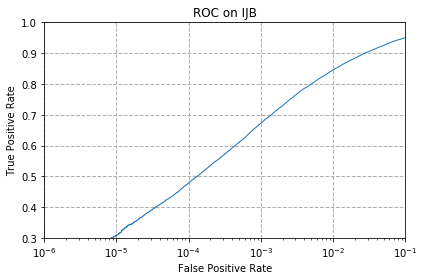

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.192105,0.308074,0.478192,0.673007,0.845938,0.950606,MS1MV2,ResNet100,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.n

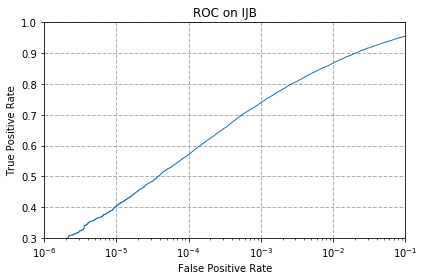

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation,0.258424,0.404612,0.570589,0.739531,0.868231,0.956282,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log':

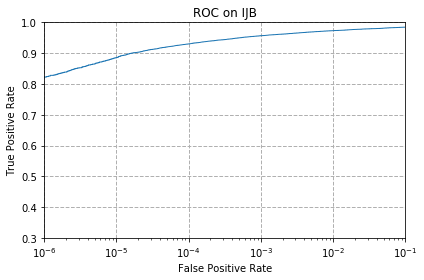

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.822774,0.885412,0.930051,0.956844,0.973258,0.98466,MS1MV2,ResNet100,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'pri

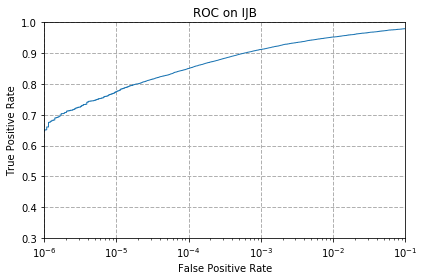

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.651276,0.774965,0.850437,0.912154,0.952498,0.979905,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log

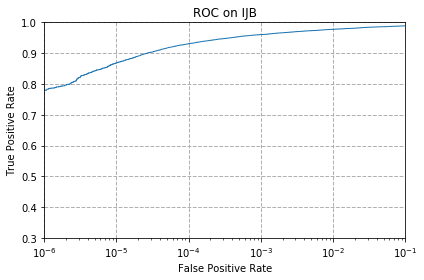

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.779976,0.868282,0.93092,0.960423,0.977604,0.988955,VGGFace2,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}


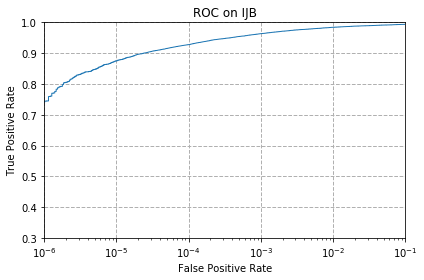

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.744439,0.875083,0.927852,0.963491,0.984098,0.993864,VGGFace2,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloadin

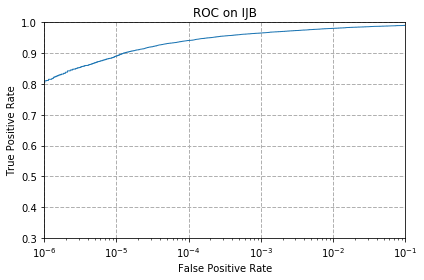

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation,0.810452,0.890883,0.941402,0.965639,0.980723,0.990438,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from b

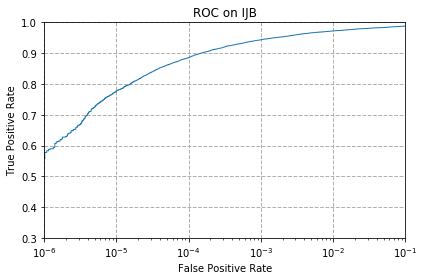

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation,0.577798,0.777522,0.88577,0.943856,0.972388,0.987984,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>

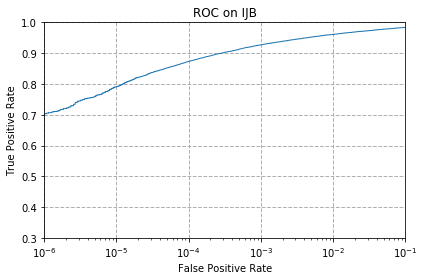

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation,0.70384,0.790919,0.873447,0.927034,0.961037,0.983893,VGGFace2,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>

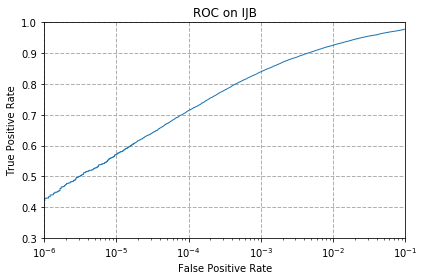

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.429002,0.570895,0.713862,0.839546,0.925807,0.97786,VGGFace2,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...


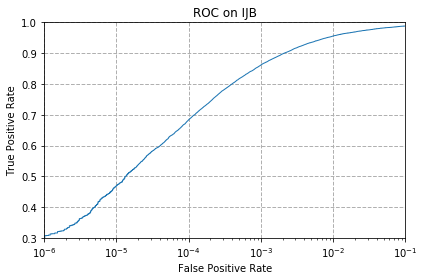

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.307665,0.470062,0.683131,0.861482,0.955975,0.988393,VGGFace2,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>

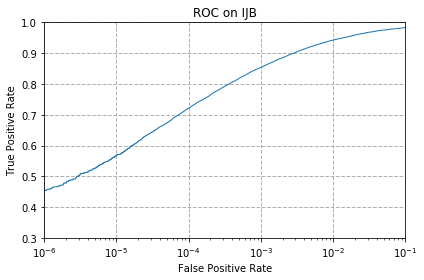

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation,0.454978,0.568441,0.721379,0.853659,0.942578,0.98328,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>

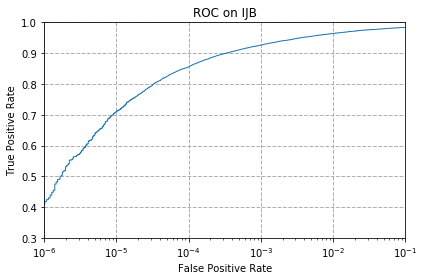

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.419083,0.71018,0.855602,0.926318,0.964156,0.983689,VGGFace2,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': 

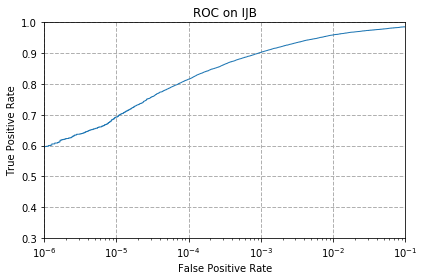

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.597126,0.692489,0.815667,0.902695,0.95935,0.985836,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>

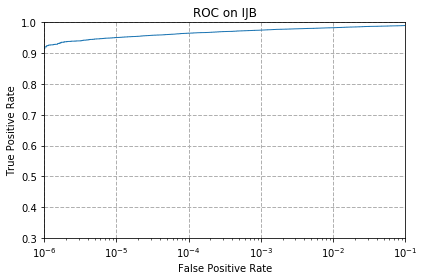

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.920796,0.95081,0.965025,0.974945,0.982768,0.989978,Glint360k,ResNet100,PartialFC_r0.1,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading fro

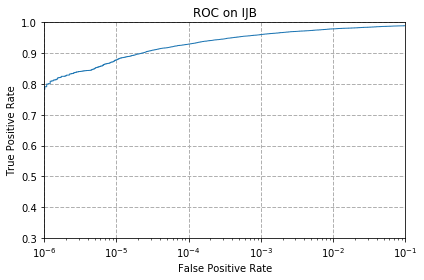

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.791277,0.8781,0.929488,0.960423,0.979087,0.989364,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: .

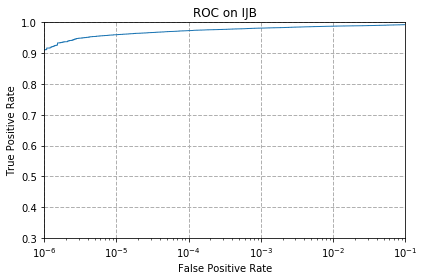

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_rotation,0.911592,0.959963,0.973309,0.98149,0.987677,0.992739,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_bac

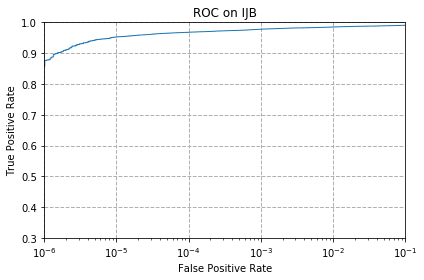

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_rotation,0.876413,0.952498,0.967991,0.97786,0.985069,0.990694,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 

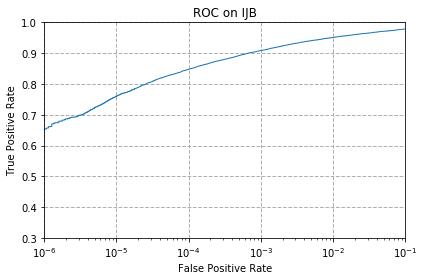

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_rotation,0.654344,0.760188,0.847574,0.908779,0.950964,0.978678,Glint360k,ResNet100,PartialFC_r0.1,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

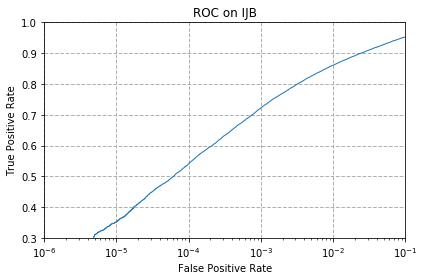

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.206473,0.352355,0.540932,0.722555,0.860919,0.953009,Glint360k,ResNet100,PartialFC_r0.1,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left

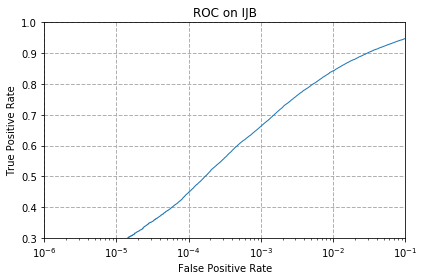

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.174106,0.273406,0.448228,0.662525,0.842614,0.948049,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 

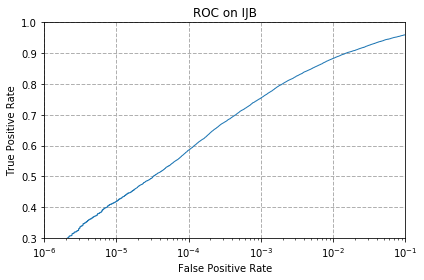

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_rotation,0.260265,0.418827,0.585366,0.754359,0.883162,0.960168,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading fro

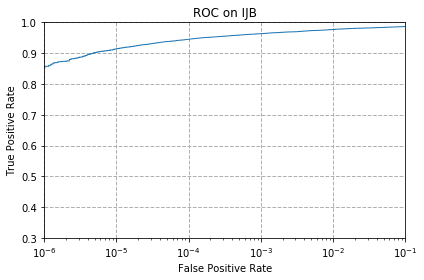

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.857238,0.913995,0.945237,0.96344,0.977041,0.986757,Glint360k,ResNet100,PartialFC_r0.1,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloa

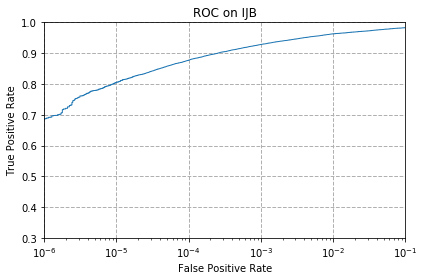

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.687682,0.805134,0.877077,0.928363,0.962775,0.982922,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloa

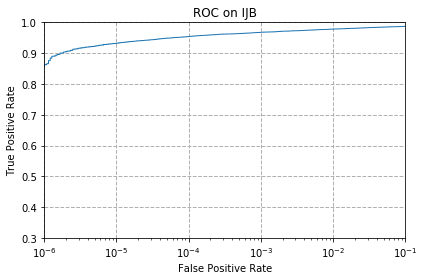

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.863016,0.932147,0.954185,0.967889,0.978269,0.987319,Glint360k,ResNet100,PartialFC_r1.0,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading fro

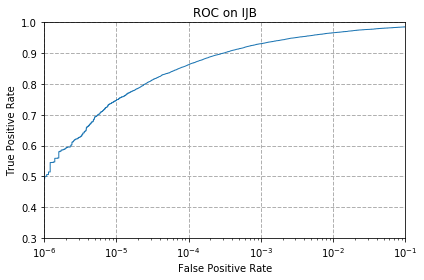

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.50023,0.746791,0.862709,0.930971,0.966355,0.985683,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./

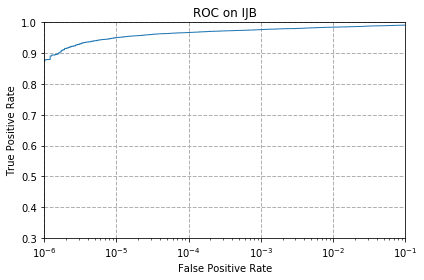

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_rotation,0.878765,0.950453,0.967326,0.976581,0.984507,0.991307,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_ba

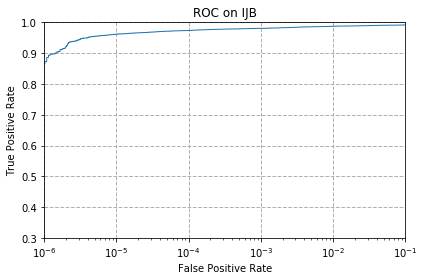

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_rotation,0.872424,0.961497,0.973871,0.980621,0.987421,0.99187,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 

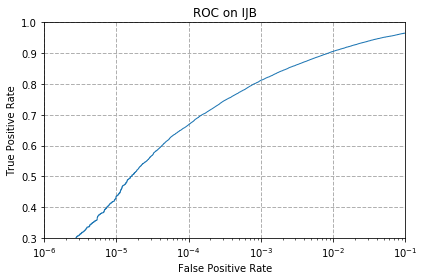

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_rotation,0.224625,0.435701,0.667587,0.811934,0.905558,0.965383,Glint360k,ResNet100,PartialFC_r1.0,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

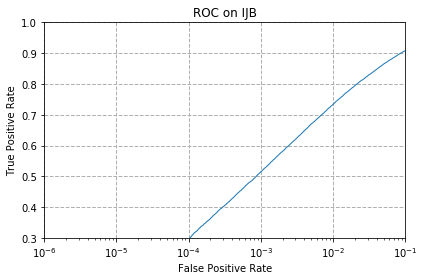

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.016209,0.095669,0.295188,0.514956,0.73452,0.90837,Glint360k,ResNet100,PartialFC_r1.0,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left

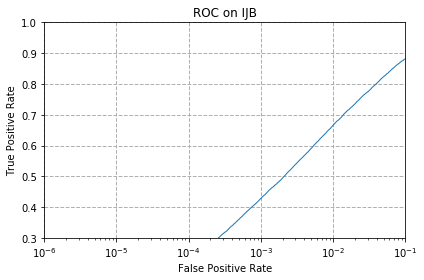

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.016669,0.070001,0.215473,0.428593,0.666258,0.882395,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 

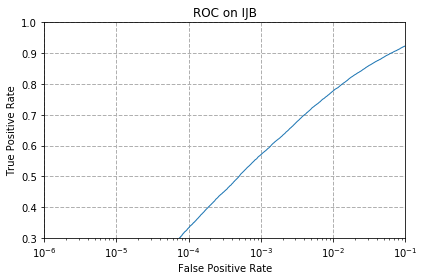

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_rotation,0.035997,0.136217,0.332771,0.570589,0.777471,0.923812,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading fro

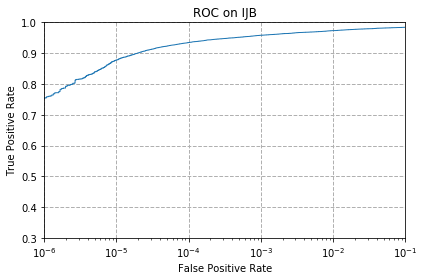

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.755279,0.877589,0.934653,0.958174,0.973309,0.984456,Glint360k,ResNet100,PartialFC_r1.0,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloa

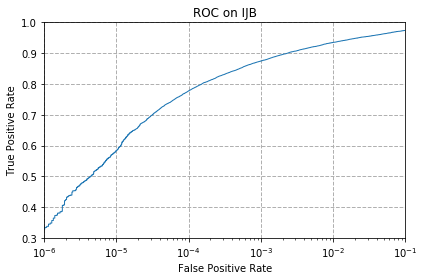

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.334356,0.58465,0.777778,0.874521,0.935062,0.974025,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup

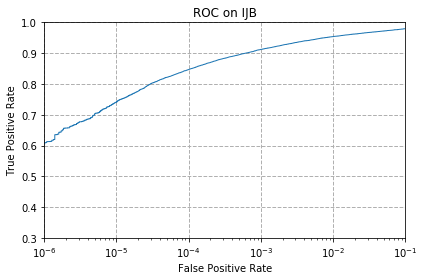

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.609756,0.74132,0.847062,0.912256,0.953981,0.979547,MS1M,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ..

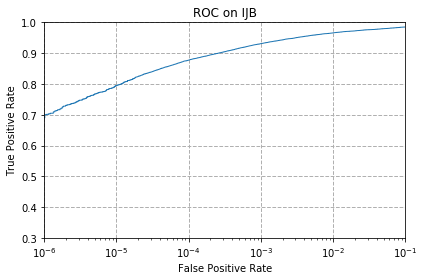

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.700465,0.794856,0.877282,0.931124,0.96615,0.98512,MS1M,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reloa

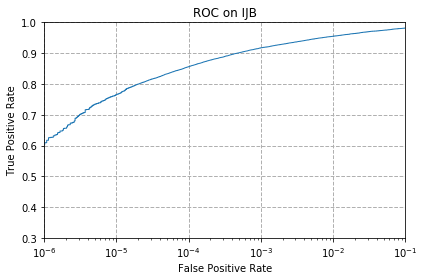

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_rotation,0.609449,0.765864,0.856113,0.91737,0.955003,0.981695,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left)

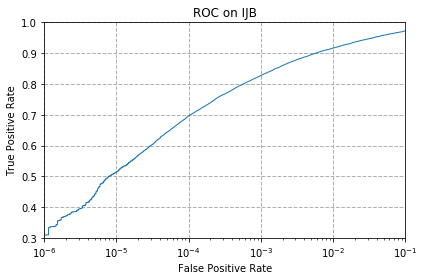

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_rotation,0.30971,0.514649,0.696017,0.827376,0.916705,0.972491,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nob

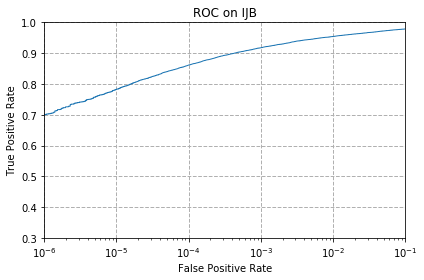

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_rotation,0.701232,0.782329,0.861431,0.917574,0.954287,0.978627,MS1M,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobac

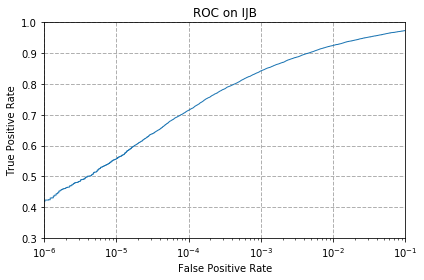

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.42302,0.556987,0.71468,0.842512,0.924988,0.973718,MS1M,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/no

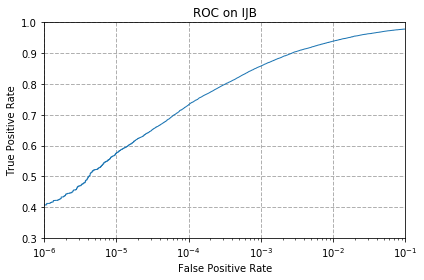

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.40768,0.575906,0.732883,0.858414,0.939203,0.978627,MS1M,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

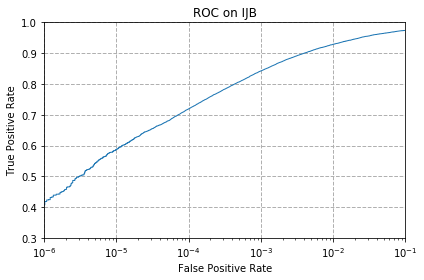

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_rotation,0.418469,0.587667,0.719282,0.842409,0.928926,0.974229,MS1M,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ..

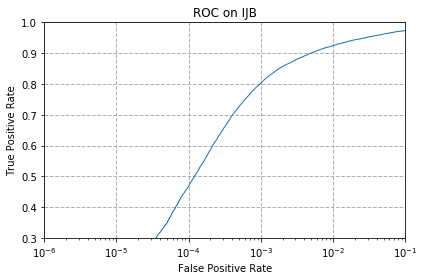

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.036662,0.136013,0.468119,0.802373,0.924324,0.973616,MS1M,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backu

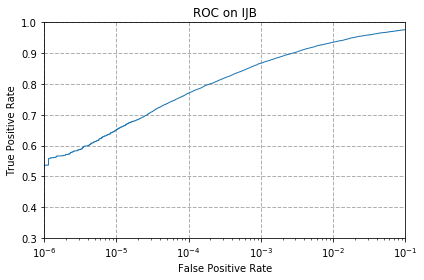

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.536381,0.651327,0.770312,0.867771,0.935675,0.976632,MS1M,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.

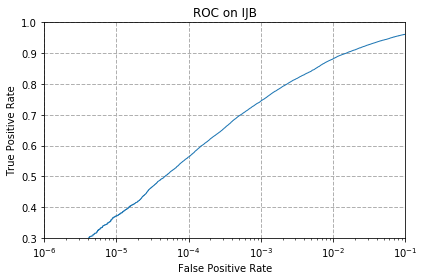

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.16434,0.371887,0.563277,0.744593,0.881884,0.961548,MS1M,MobileNetV2,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>

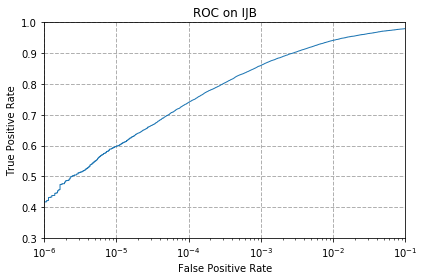

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.417549,0.597996,0.740349,0.859897,0.941709,0.979751,MS1M,MobileNetV2,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (

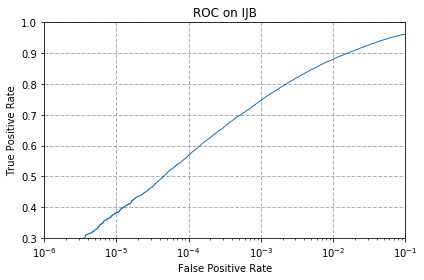

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_rotation,0.23388,0.38196,0.569157,0.746945,0.880299,0.96206,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) em

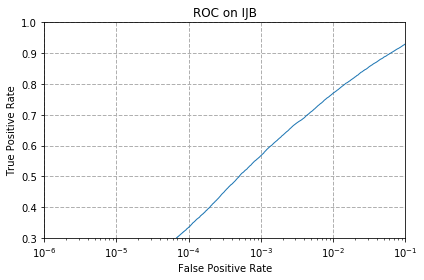

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_rotation,0.053076,0.143376,0.334458,0.567163,0.770261,0.930357,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku

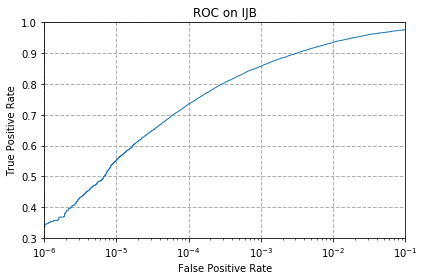

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_rotation,0.344685,0.553664,0.735082,0.8578,0.935368,0.97607,MS1M,MobileNetV2,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku

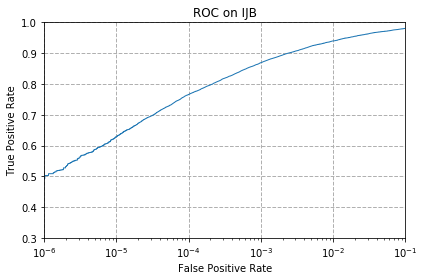

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.502787,0.628982,0.765915,0.869254,0.939766,0.980723,MS1M,MobileNetV2,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobac

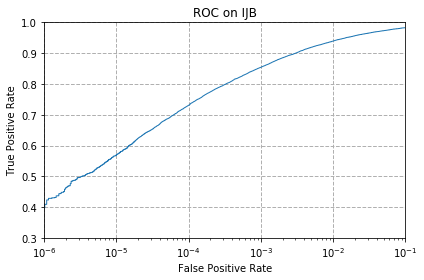

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.409367,0.569515,0.730787,0.85417,0.93951,0.982768,MS1M,MobileNetV2,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku

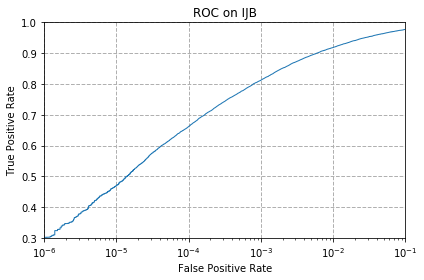

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_rotation,0.302296,0.470011,0.661656,0.81219,0.918392,0.977093,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>

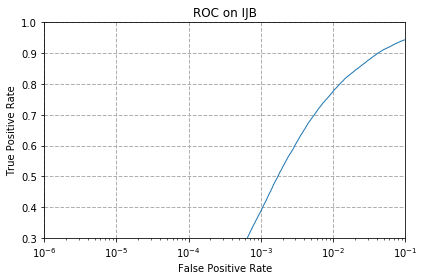

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.000102,0.003017,0.04832,0.387023,0.775937,0.944317,MS1M,MobileNetV2,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.n

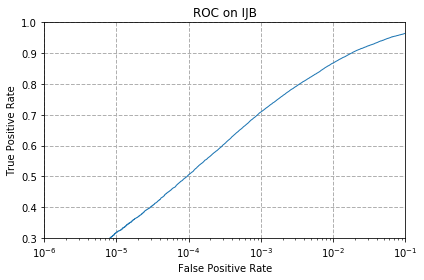

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.18239,0.318505,0.50519,0.709056,0.868385,0.964616,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_back

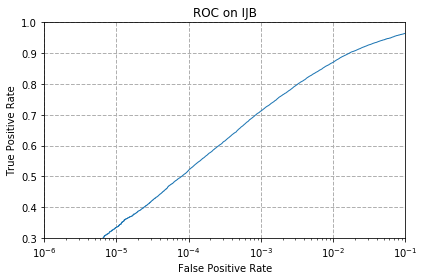

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.181981,0.334151,0.51966,0.71197,0.870583,0.964872,VGGFace2,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.n

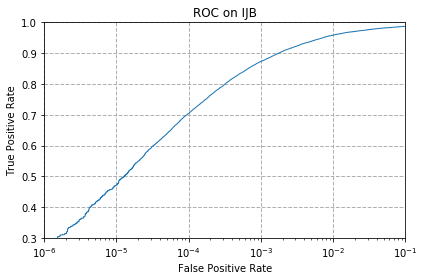

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.276014,0.471442,0.704198,0.873191,0.958634,0.987779,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> 

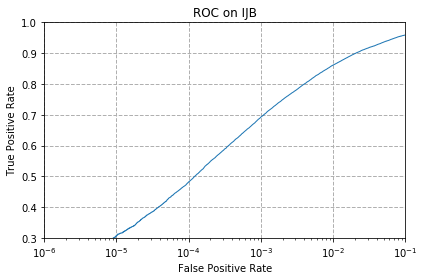

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation,0.162908,0.307409,0.481771,0.692233,0.861635,0.959503,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (

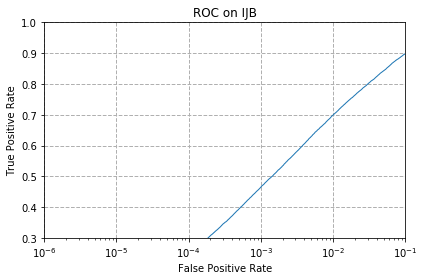

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation,0.034821,0.096232,0.248862,0.465153,0.699289,0.8984,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b

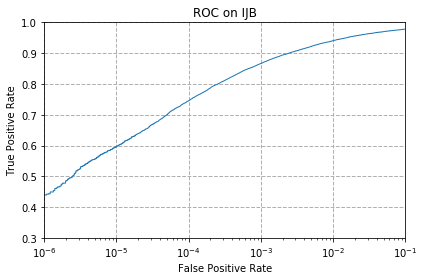

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation,0.439843,0.597484,0.745462,0.866544,0.94084,0.978422,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

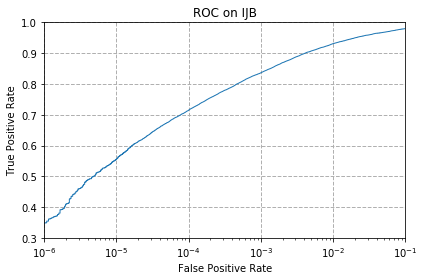

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.349389,0.555913,0.715243,0.836325,0.931073,0.980109,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/re

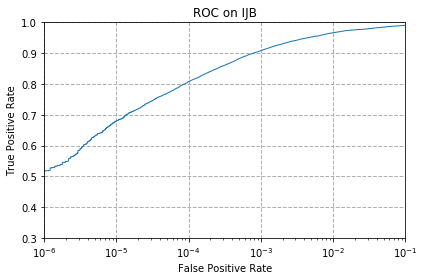

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.518382,0.680728,0.807946,0.908473,0.96661,0.990183,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b

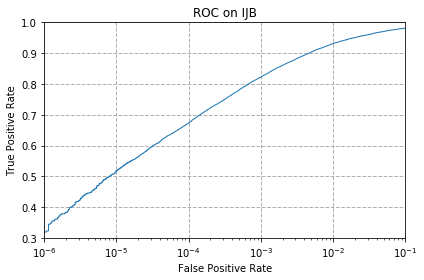

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation,0.319834,0.518433,0.673212,0.822212,0.931329,0.981643,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.n

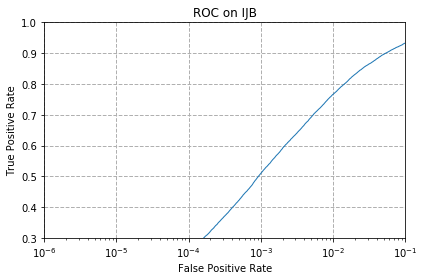

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.023879,0.088153,0.253771,0.509792,0.76658,0.933221,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_

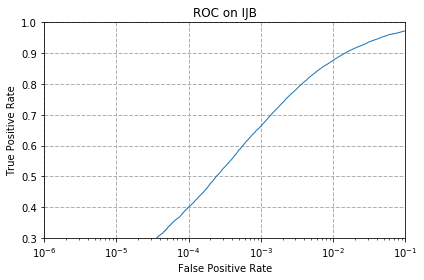

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.068313,0.199468,0.400726,0.662729,0.876617,0.97244,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup

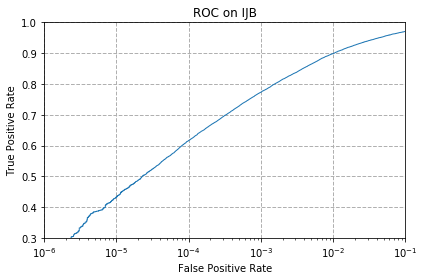

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.259958,0.432837,0.616454,0.773227,0.898911,0.970752,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>

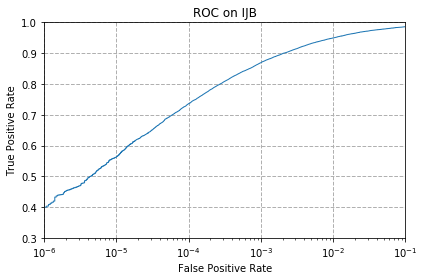

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.400368,0.563532,0.736156,0.869049,0.94943,0.986245,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (l

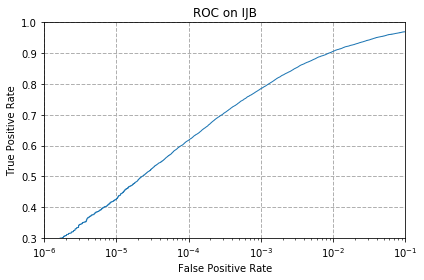

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation,0.256532,0.426446,0.617579,0.784987,0.906018,0.970036,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) emb

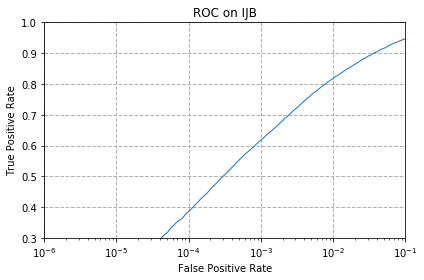

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation,0.091425,0.188577,0.386256,0.617119,0.81853,0.946413,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup

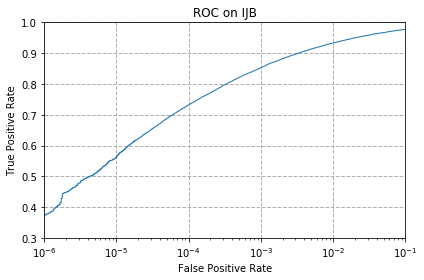

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation,0.375569,0.562101,0.732372,0.852994,0.933528,0.977655,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/

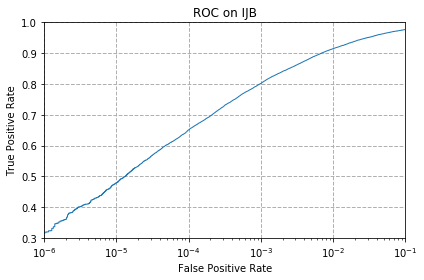

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.318914,0.47947,0.650918,0.801708,0.914557,0.976837,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

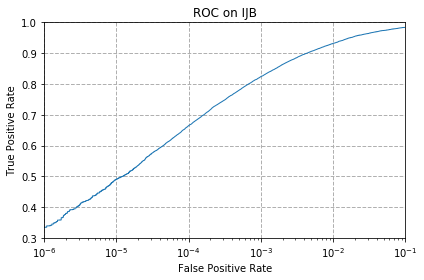

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.335072,0.490617,0.664826,0.824104,0.93184,0.983944,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku

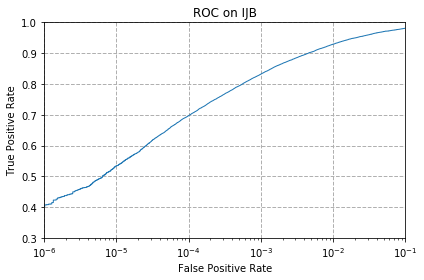

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation,0.407527,0.533875,0.697039,0.832132,0.929335,0.980979,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>

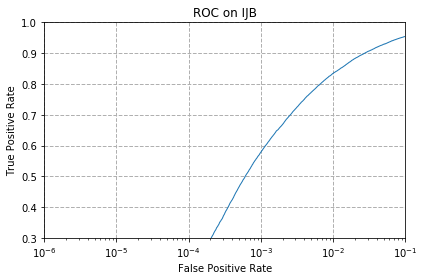

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.000665,0.011045,0.175538,0.578463,0.834586,0.954543,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

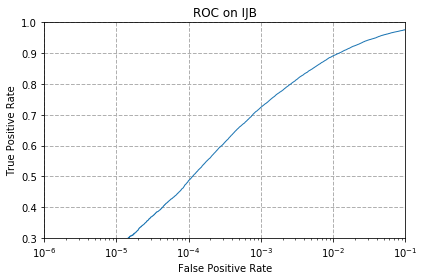

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.127269,0.274838,0.486271,0.724242,0.891292,0.976326,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log

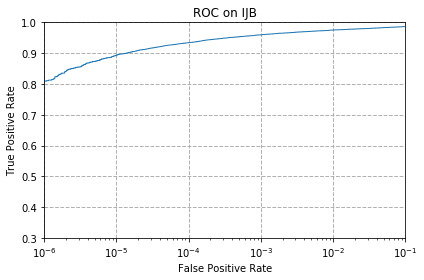

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.809787,0.893082,0.934346,0.959554,0.975354,0.986501,MS1M,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'p

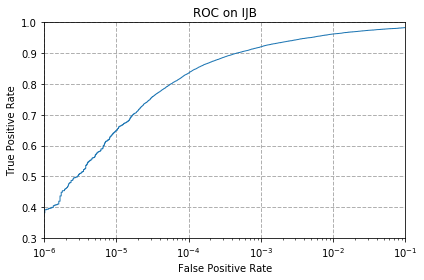

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.391931,0.649128,0.835404,0.920744,0.962315,0.983177,MS1M,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': F

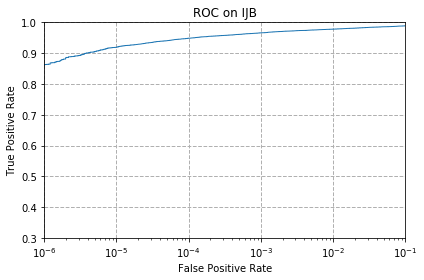

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_rotation,0.863323,0.919262,0.948612,0.966099,0.978115,0.988853,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>

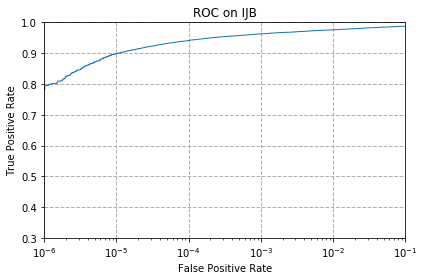

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_rotation,0.794754,0.898502,0.941249,0.962673,0.97607,0.98783,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJB

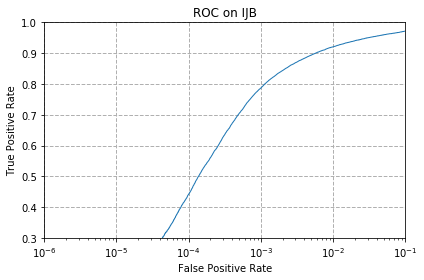

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_rotation,0.034412,0.134888,0.442246,0.786982,0.920693,0.971621,MS1M,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC

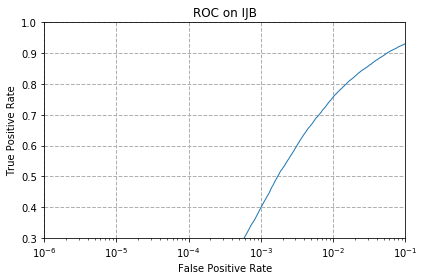

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.000818,0.006647,0.067393,0.398374,0.757171,0.931329,MS1M,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./I

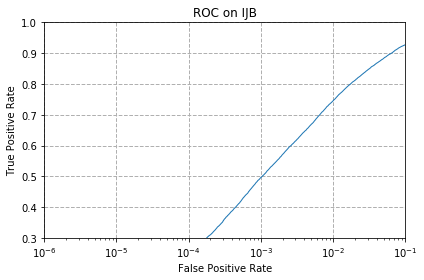

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.013806,0.075727,0.244669,0.496242,0.745718,0.927596,MS1M,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJB

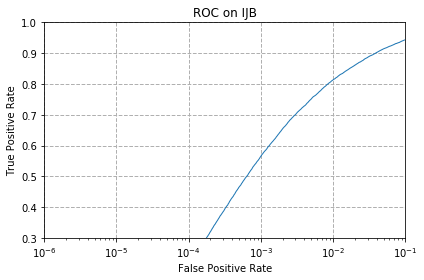

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_rotation,0.002761,0.025669,0.215524,0.565475,0.813571,0.943498,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, '

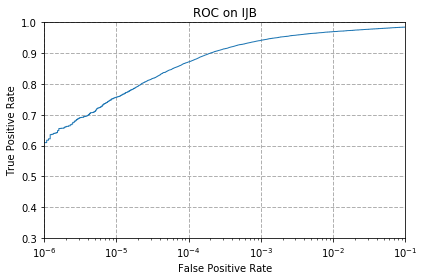

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.609756,0.757171,0.871759,0.941913,0.969883,0.984814,MS1M,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals'

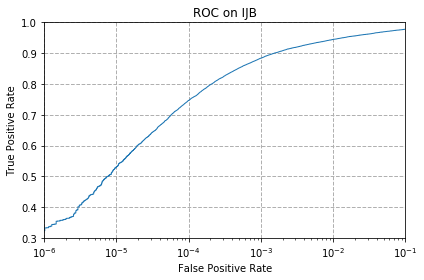

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.332771,0.531216,0.746587,0.883776,0.944726,0.977911,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'p

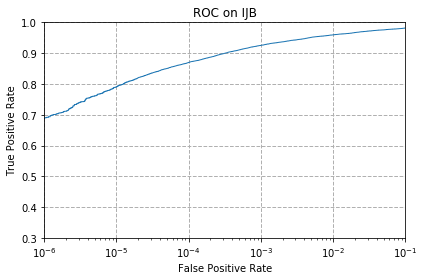

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation,0.690699,0.79051,0.869714,0.925346,0.959759,0.981746,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': F

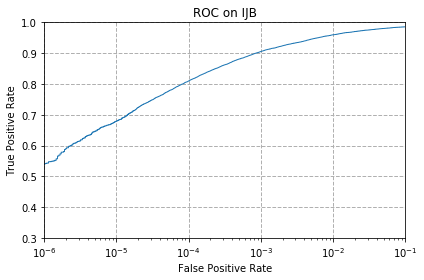

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation,0.542057,0.678938,0.809685,0.905354,0.95981,0.985683,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> R

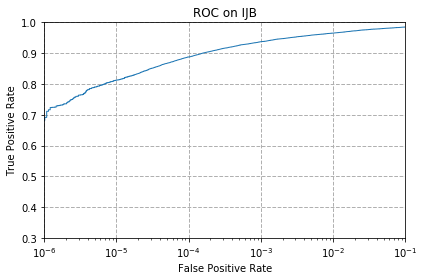

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_rotation,0.691722,0.812446,0.887713,0.93726,0.965179,0.985018,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading

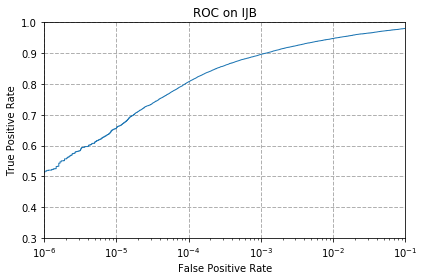

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_rotation,0.517053,0.656542,0.806974,0.89615,0.947691,0.980518,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz

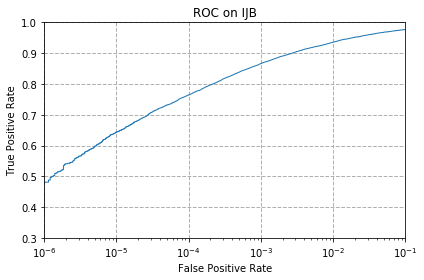

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_rotation,0.481209,0.644015,0.764688,0.866391,0.93588,0.977041,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz 

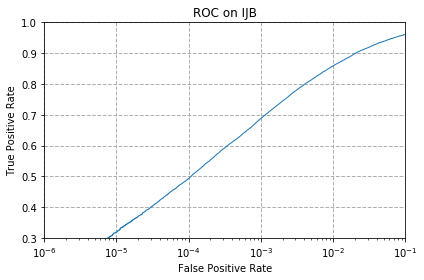

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_rotation,0.203661,0.319118,0.493225,0.687989,0.858976,0.96119,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.n

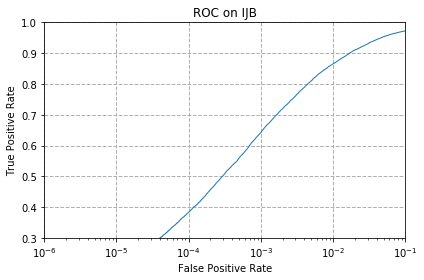

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation,0.08263,0.197474,0.38329,0.642379,0.865368,0.972491,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz

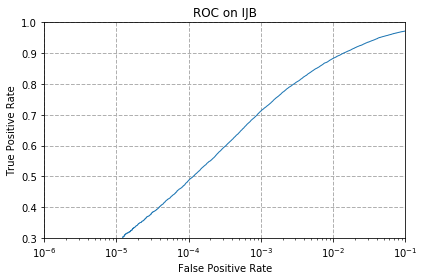

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_rotation,0.156363,0.285933,0.487038,0.71243,0.883009,0.97203,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': F

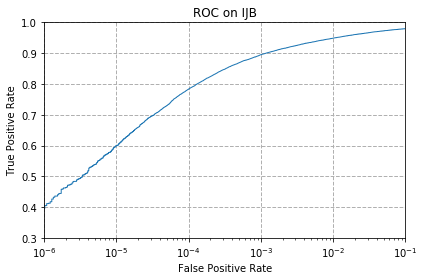

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation,0.405328,0.599274,0.783249,0.895178,0.948714,0.979649,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_rotation.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.0, 'pre_template_map': True, 'is_rotation_map': True, 'is_procrustes': True, 'is_wahba': True, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'prin

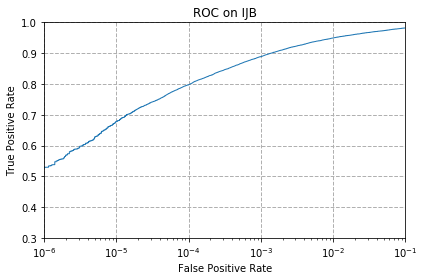

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation,0.529631,0.677507,0.797515,0.888838,0.94943,0.982155,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_rotation.npz.csv


In [18]:
for left_embs, left_dataset, left_architecture, left_head in embs_list:
    for right_embs, right_dataset, right_architecture, right_head in embs_list:
        if left_embs == right_embs:
            fit_mapping=False
        else:
            fit_mapping=True

        try:
            #for pre_template_map in pre_template_map:
            save_result_name = '{}_TO_{}_N11856_rotation'.format(left_embs.split('/')[-1].split('.')[0], right_embs.split('/')[-1].split('.')[0])
            save_result = '../../../../results/D0/{}.npz'.format(save_result_name)
            args = Args(subset='IJBC',  
                is_bunch=False,
                restore_embs_left=left_embs,
                restore_embs_right=right_embs,
                fit_mapping=fit_mapping,
                fit_flips=False,
                decay_coef=decay_coef,
                pre_template_map=True,
                is_rotation_map=True,
                is_wahba=True,
                is_procrustes=True,
                use_face_scores=False,
                save_result=save_result)
            df, fig = IJB.main(args)
            df['L_DATASET'] = left_dataset
            df['L_ARCH'] = left_architecture
            df['L_HEAD'] = left_head
            df['R_DATASET'] = right_dataset
            df['R_ARCH'] = right_architecture
            df['R_HEAD'] = right_head
            display(df)
            dataframes[save_result_name] = df
            print('saving to', args.save_result + '.csv')
            df.to_csv(args.save_result + '.csv')
        except Exception:
            traceback.print_exc()

In [20]:
decay_coef=0.001

<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup

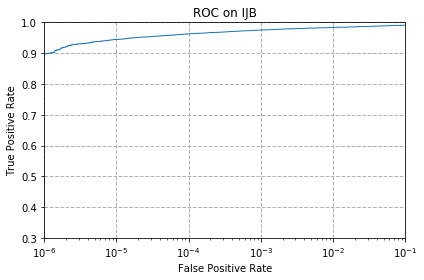

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.898451,0.944726,0.962827,0.975252,0.983638,0.990796,MS1MV2,ResNet100,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': 

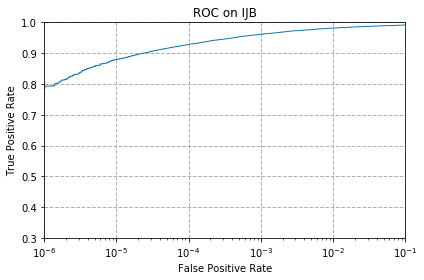

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.793015,0.879429,0.928875,0.961497,0.981746,0.991563,MS1MV2,ResNet100,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> 

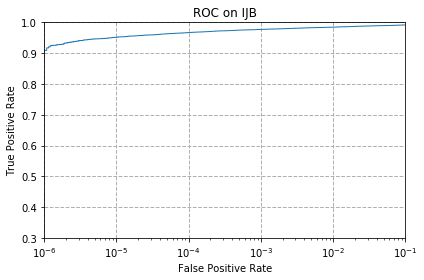

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ridge,0.909291,0.95168,0.966968,0.977246,0.984558,0.991768,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloadin

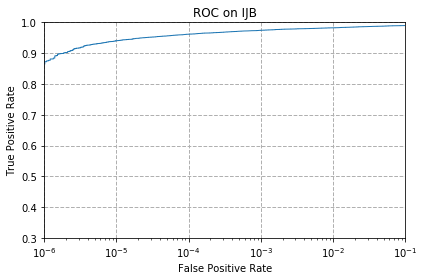

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ridge,0.872475,0.940482,0.961651,0.974434,0.982564,0.989825,MS1MV2,ResNet100,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

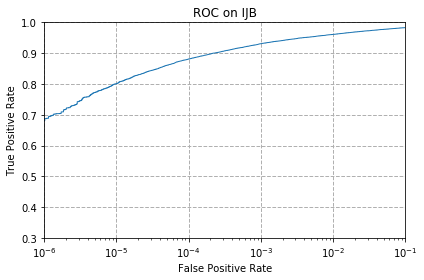

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ridge,0.687631,0.800941,0.881014,0.930715,0.961088,0.983075,MS1MV2,ResNet100,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz

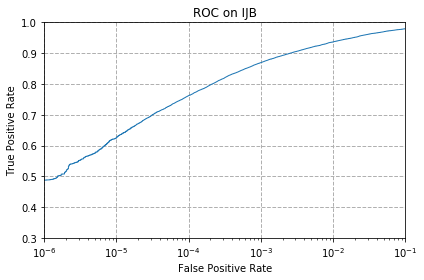

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.488112,0.626272,0.762182,0.869407,0.936647,0.979649,MS1MV2,ResNet100,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.

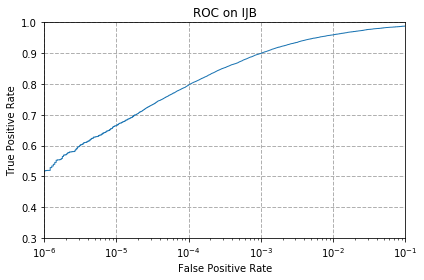

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.518893,0.664928,0.796543,0.899269,0.959605,0.988086,MS1MV2,ResNet100,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

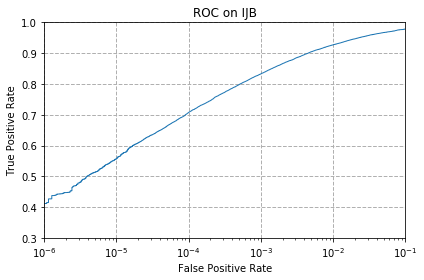

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ridge,0.412026,0.556732,0.707573,0.832899,0.927289,0.97832,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': 

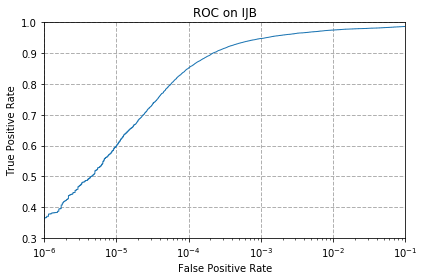

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.366263,0.599018,0.852022,0.947794,0.975303,0.986961,MS1MV2,ResNet100,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'prin

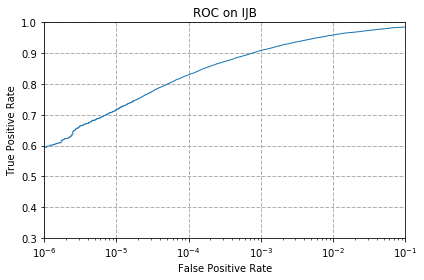

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.594723,0.716521,0.829831,0.908882,0.958941,0.98512,MS1MV2,ResNet100,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/MS1MV2-ResNet100-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log'

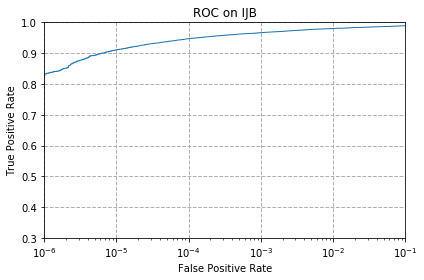

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.832694,0.910518,0.947282,0.966815,0.980161,0.989416,VGGFace2,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>

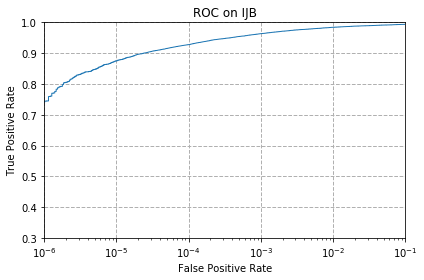

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.744439,0.875083,0.927852,0.963491,0.984098,0.993864,VGGFace2,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading

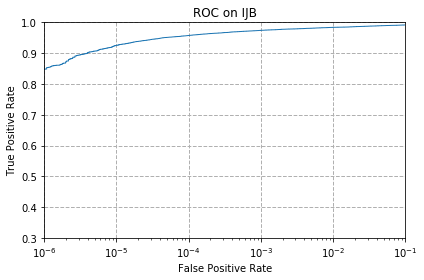

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ridge,0.84875,0.925193,0.95756,0.97428,0.983893,0.991665,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from ba

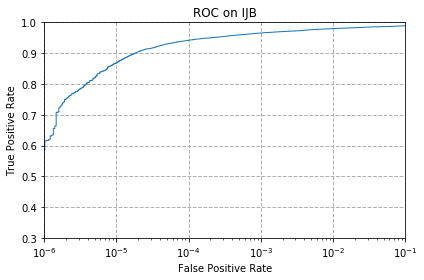

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ridge,0.61533,0.868231,0.942016,0.965383,0.979751,0.98916,VGGFace2,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>

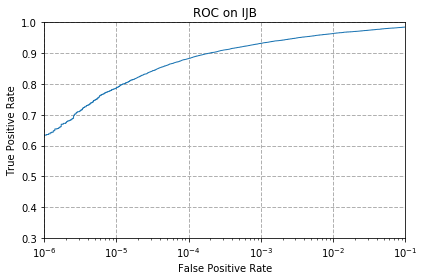

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ridge,0.6343,0.787186,0.882651,0.931891,0.963952,0.984865,VGGFace2,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>>

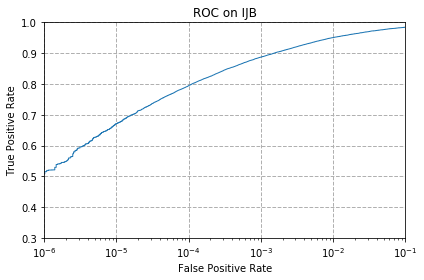

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.515468,0.670757,0.7946,0.887406,0.950759,0.984405,VGGFace2,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>

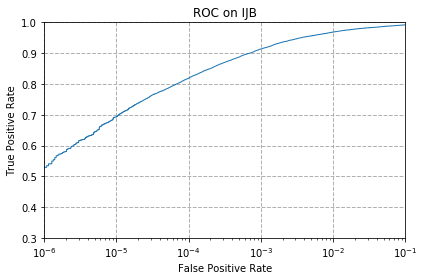

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.529734,0.693511,0.818735,0.913739,0.968605,0.992177,VGGFace2,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>

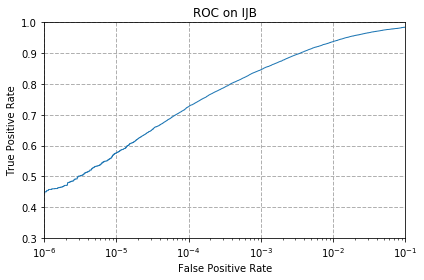

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ridge,0.450325,0.576469,0.726338,0.846091,0.937772,0.984558,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>

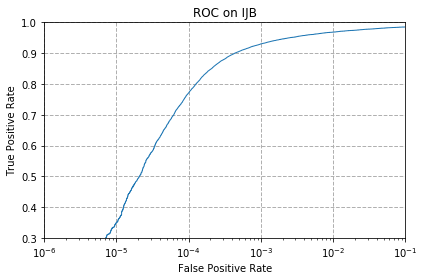

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.074449,0.349542,0.770875,0.930204,0.968502,0.98512,VGGFace2,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': F

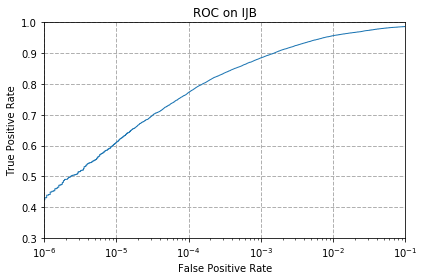

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.430843,0.609705,0.772511,0.884798,0.956997,0.986552,VGGFace2,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/VGG2-ResNet50-Arcface_IJBC_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>

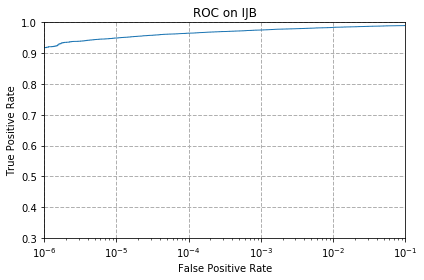

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.918341,0.949328,0.964974,0.975252,0.983638,0.989773,Glint360k,ResNet100,PartialFC_r0.1,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_0_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from

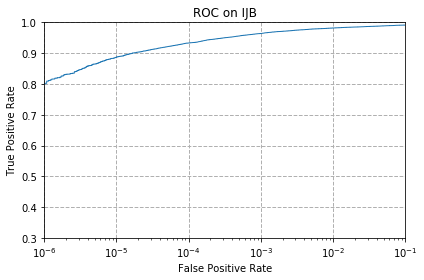

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.802321,0.886844,0.933119,0.963798,0.981899,0.99141,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_0_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./

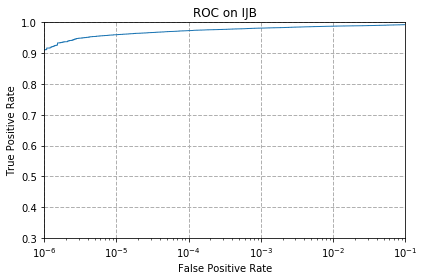

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_ridge,0.911592,0.959963,0.973309,0.98149,0.987677,0.992739,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_back

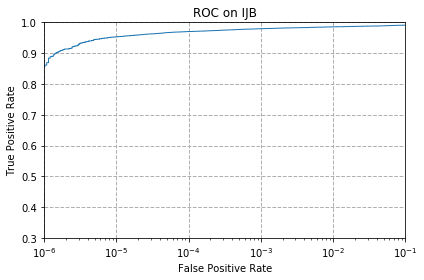

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_ridge,0.86138,0.95306,0.970292,0.979496,0.985632,0.991103,Glint360k,ResNet100,PartialFC_r0.1,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/glint360k_r100FC_0_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

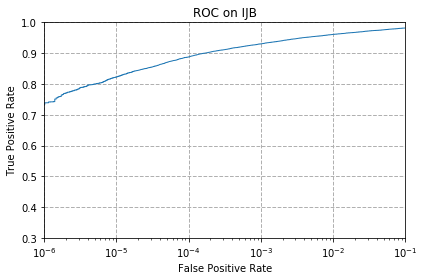

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_ridge,0.738866,0.822826,0.887815,0.930204,0.961139,0.981848,Glint360k,ResNet100,PartialFC_r0.1,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) em

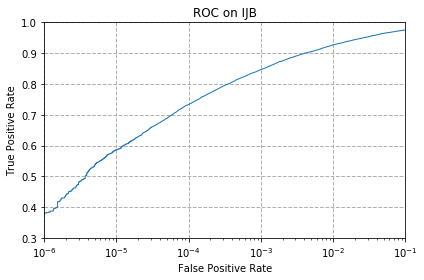

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.3815,0.586184,0.733548,0.846449,0.927136,0.976019,Glint360k,ResNet100,PartialFC_r0.1,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left)

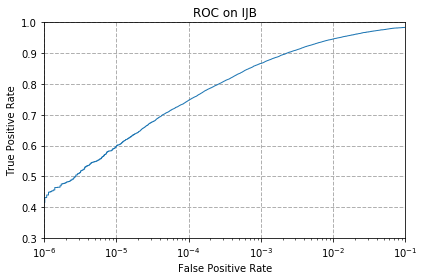

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.431355,0.597433,0.747303,0.8668,0.946004,0.983996,Glint360k,ResNet100,PartialFC_r0.1,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/glint360k_r100FC_0_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

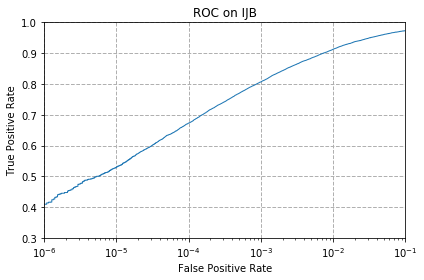

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_ridge,0.409725,0.529478,0.673058,0.806719,0.912768,0.973258,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/glint360k_r100FC_0_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from

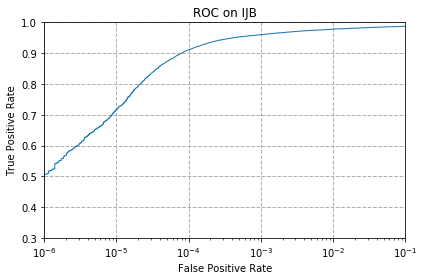

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.506826,0.717186,0.910825,0.960321,0.977962,0.987524,Glint360k,ResNet100,PartialFC_r0.1,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reload

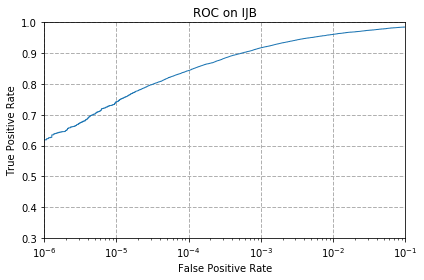

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.61896,0.742189,0.843739,0.917421,0.96119,0.985018,Glint360k,ResNet100,PartialFC_r0.1,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/glint360k_r100FC_0_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reload

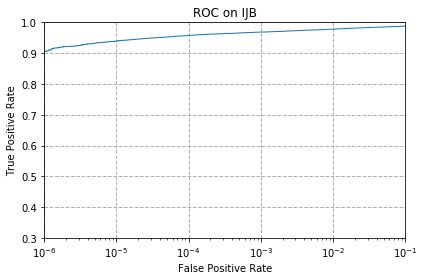

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.906121,0.939254,0.957713,0.968553,0.978166,0.987933,Glint360k,ResNet100,PartialFC_r1.0,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_1_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from

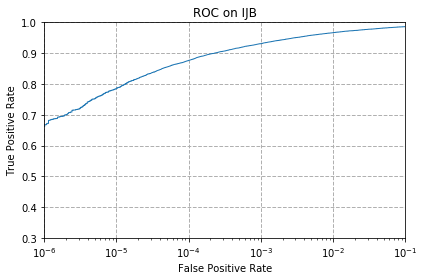

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.667996,0.784987,0.876361,0.930818,0.96661,0.986245,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_1_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./I

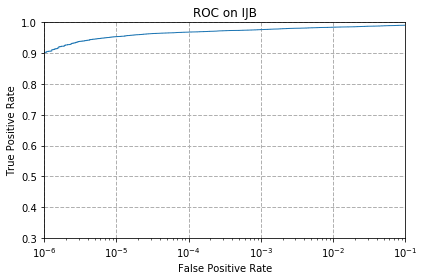

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_ridge,0.903104,0.953776,0.968451,0.976581,0.984353,0.99095,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_bac

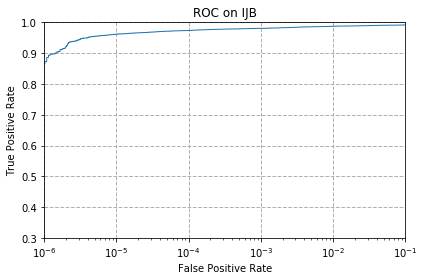

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_ridge,0.872424,0.961497,0.973871,0.980621,0.987421,0.99187,Glint360k,ResNet100,PartialFC_r1.0,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/glint360k_r100FC_1_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

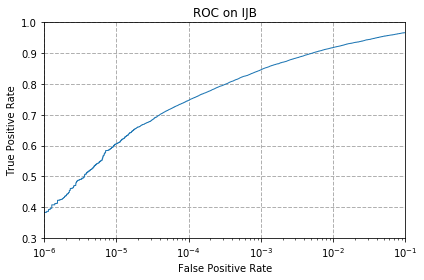

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_ridge,0.383443,0.605614,0.747047,0.846142,0.918239,0.966968,Glint360k,ResNet100,PartialFC_r1.0,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) em

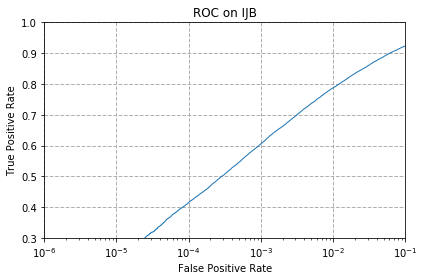

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.070563,0.22033,0.415094,0.605461,0.787493,0.92417,Glint360k,ResNet100,PartialFC_r1.0,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left)

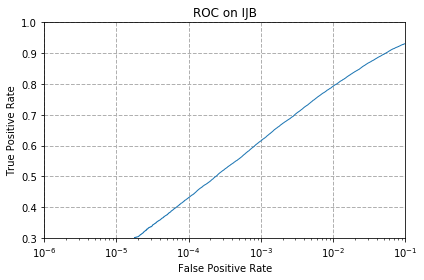

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.153295,0.265174,0.430997,0.615227,0.792862,0.931738,Glint360k,ResNet100,PartialFC_r1.0,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/glint360k_r100FC_1_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) e

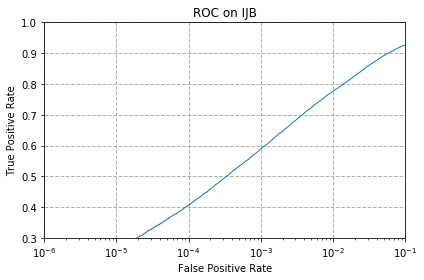

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_ridge,0.131053,0.262668,0.406351,0.589712,0.776448,0.926983,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/glint360k_r100FC_1_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from

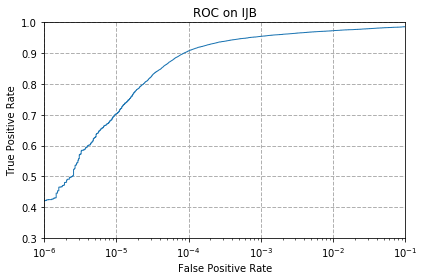

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.4221,0.702869,0.90745,0.95485,0.973053,0.986041,Glint360k,ResNet100,PartialFC_r1.0,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reload

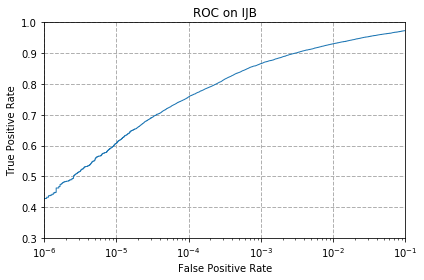

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.42844,0.607609,0.758194,0.865981,0.930613,0.973309,Glint360k,ResNet100,PartialFC_r1.0,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/glint360k_r100FC_1_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.

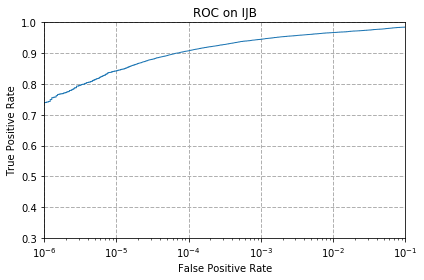

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.740144,0.842614,0.907655,0.945032,0.967122,0.98466,MS1M,ResNet50,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...

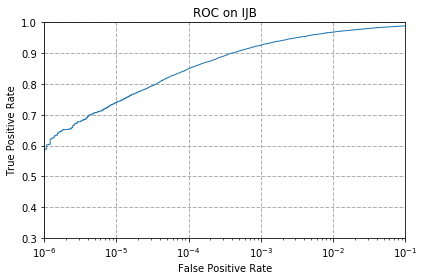

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.588638,0.7404,0.849926,0.926062,0.968349,0.988751,MS1M,ResNet50,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload

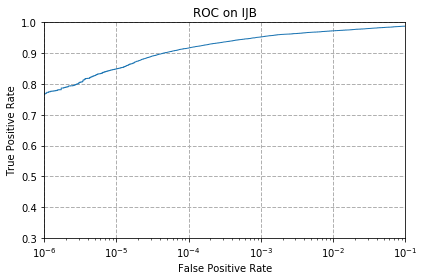

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_ridge,0.769699,0.849108,0.916858,0.952805,0.972695,0.987882,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) 

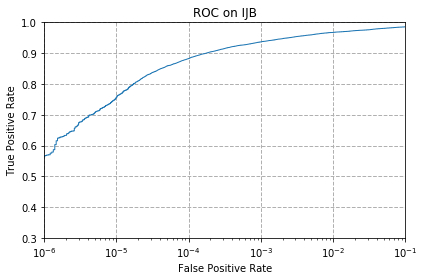

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_ridge,0.567827,0.755075,0.882446,0.936596,0.967531,0.985581,MS1M,ResNet50,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noba

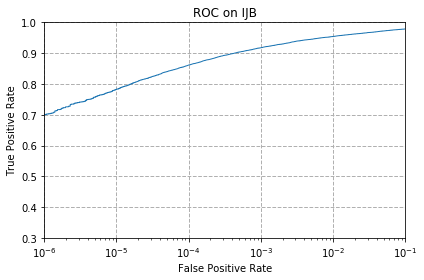

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_ridge,0.701232,0.782329,0.861431,0.917574,0.954287,0.978627,MS1M,ResNet50,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

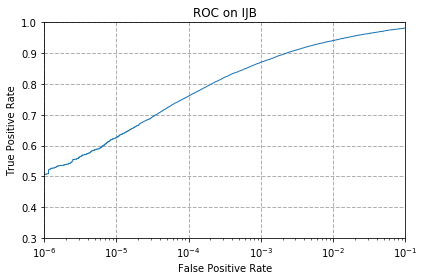

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.507082,0.626579,0.760853,0.870481,0.940942,0.981848,MS1M,ResNet50,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nob

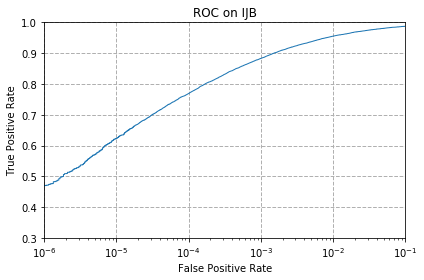

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.470727,0.623715,0.769341,0.883111,0.955361,0.987524,MS1M,ResNet50,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobac

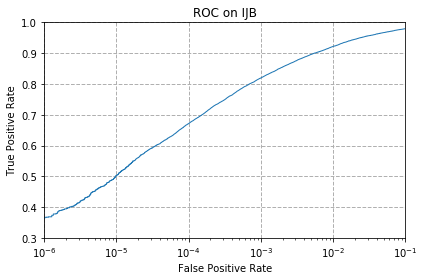

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_ridge,0.367234,0.502378,0.671422,0.819655,0.921972,0.979649,MS1M,ResNet50,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...

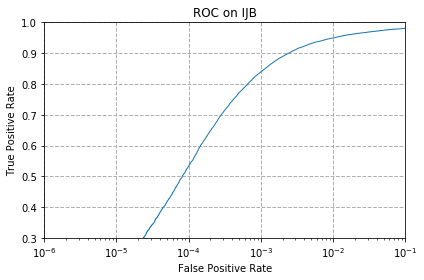

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.044025,0.189088,0.533313,0.83929,0.949532,0.981081,MS1M,ResNet50,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup

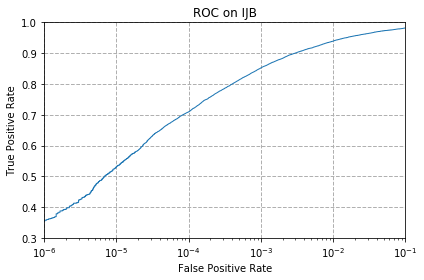

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.357877,0.531523,0.709414,0.852176,0.939254,0.981797,MS1M,ResNet50,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_arc_res50_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.n

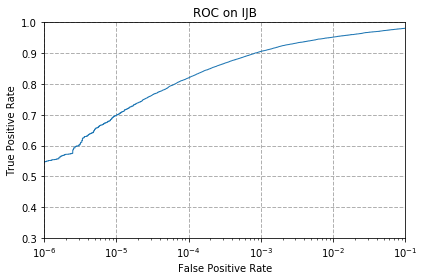

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.548244,0.698522,0.819809,0.905763,0.952089,0.98103,MS1M,MobileNetV2,ArcFace,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>

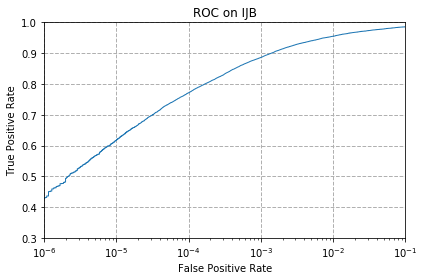

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.431661,0.617733,0.77154,0.886281,0.955157,0.985683,MS1M,MobileNetV2,ArcFace,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (l

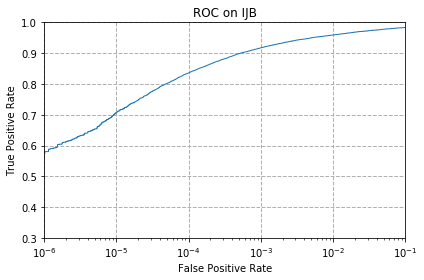

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_ridge,0.580355,0.706755,0.835967,0.917472,0.959145,0.983638,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) emb

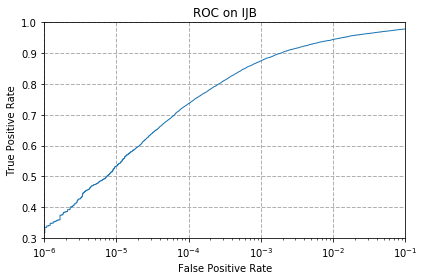

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_ridge,0.334509,0.533466,0.736156,0.875032,0.944675,0.978729,MS1M,MobileNetV2,ArcFace,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup

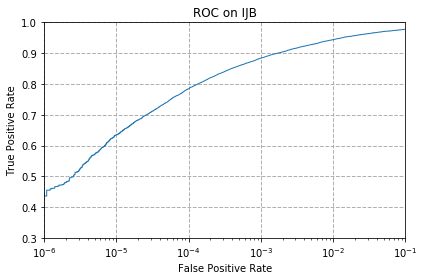

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_ridge,0.436365,0.634402,0.78463,0.883878,0.944061,0.977757,MS1M,MobileNetV2,ArcFace,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup

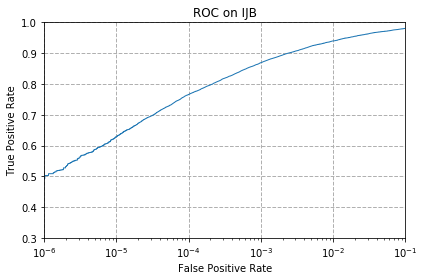

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.502787,0.628982,0.765915,0.869254,0.939766,0.980723,MS1M,MobileNetV2,ArcFace,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/noback

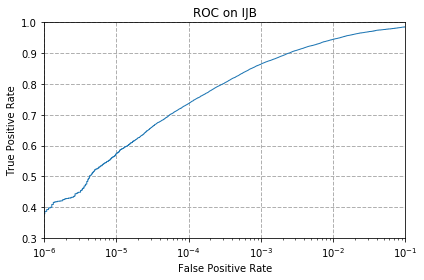

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.38646,0.573861,0.736463,0.86409,0.945186,0.985581,MS1M,MobileNetV2,ArcFace,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup

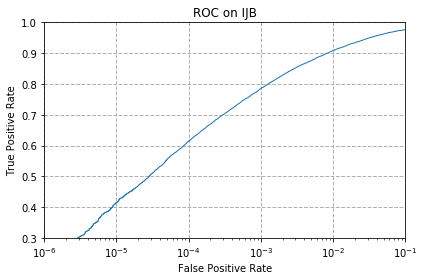

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_ridge,0.242368,0.413356,0.614307,0.785499,0.908422,0.976581,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>

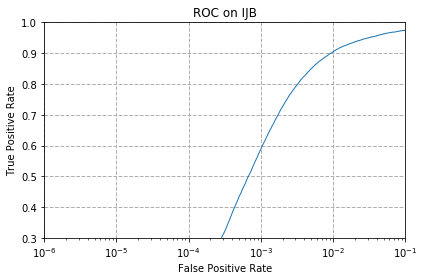

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.002199,0.010482,0.117349,0.588485,0.904484,0.974229,MS1M,MobileNetV2,ArcFace,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

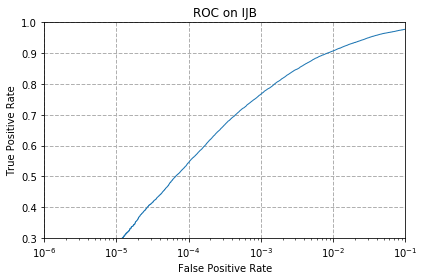

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.123281,0.276985,0.544562,0.766887,0.90745,0.977655,MS1M,MobileNetV2,ArcFace,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_arc_mbv2_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backu

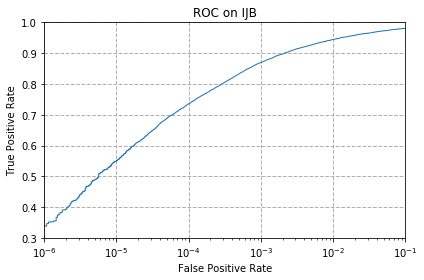

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.338856,0.549931,0.735542,0.869612,0.944572,0.980876,VGGFace2,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

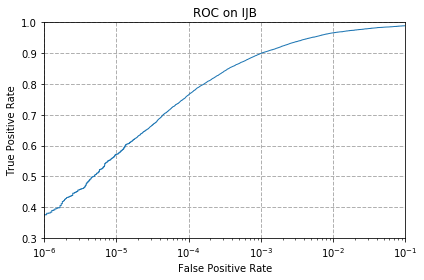

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.375569,0.571867,0.764739,0.899269,0.96615,0.989262,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> R

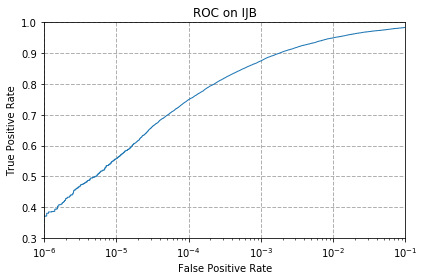

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ridge,0.371325,0.556936,0.749297,0.875083,0.94989,0.983433,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (l

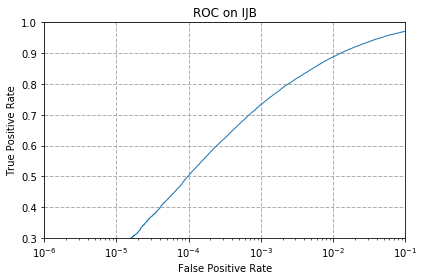

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ridge,0.081914,0.24559,0.502173,0.732934,0.888071,0.971417,VGGFace2,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

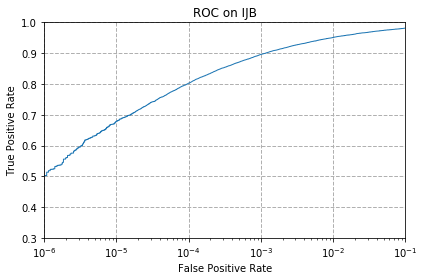

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ridge,0.502787,0.67766,0.802679,0.895996,0.951271,0.981439,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/n

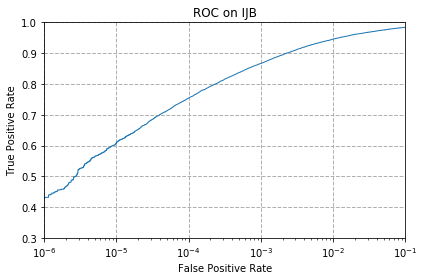

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.431866,0.608529,0.754103,0.866748,0.946004,0.9842,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red

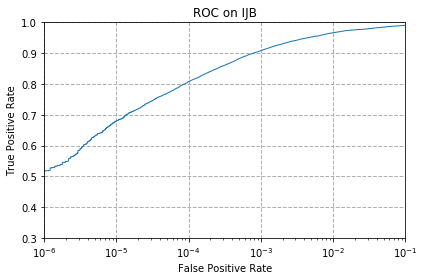

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.518382,0.680728,0.807946,0.908473,0.96661,0.990183,VGGFace2,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/

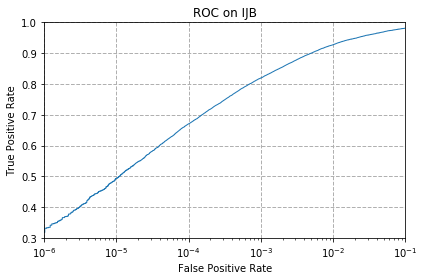

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ridge,0.331646,0.493481,0.670808,0.819758,0.927596,0.981285,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

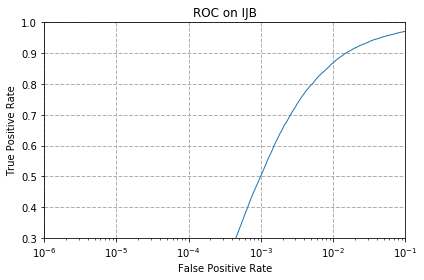

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.001125,0.005164,0.057626,0.502327,0.868845,0.970803,VGGFace2,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_b

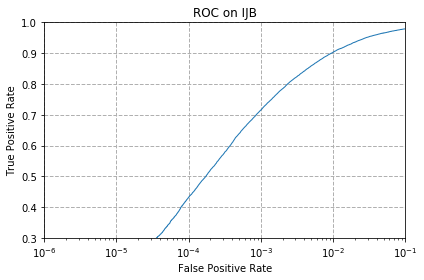

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.053791,0.185458,0.432275,0.715498,0.903462,0.979291,VGGFace2,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/vggface2_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.

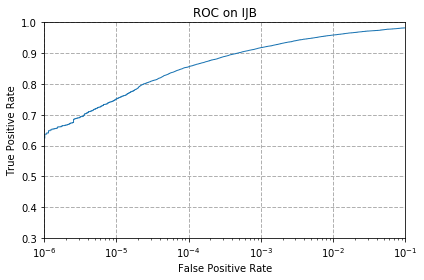

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.637317,0.751393,0.855908,0.917932,0.958941,0.982206,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>

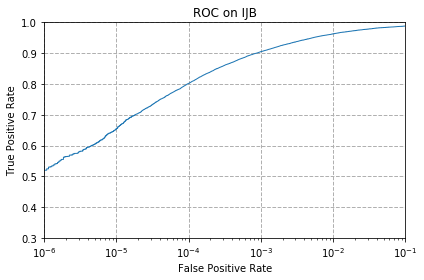

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.520172,0.65419,0.801759,0.905047,0.962775,0.988546,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (le

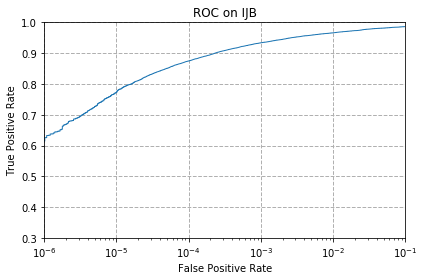

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ridge,0.625863,0.773125,0.874827,0.933579,0.96615,0.986348,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embe

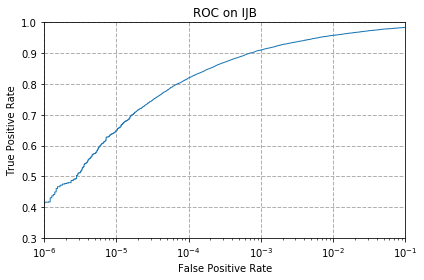

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ridge,0.416373,0.648106,0.819809,0.910262,0.958071,0.983791,CASIA-WebFace,InceptionResNetV1,CenterLoss,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/

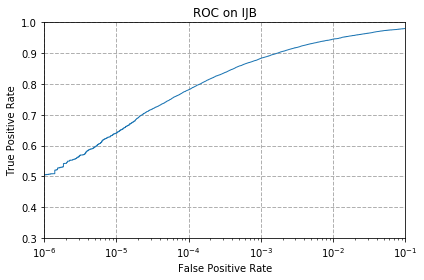

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ridge,0.50565,0.640691,0.781255,0.883315,0.945442,0.980416,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup/d

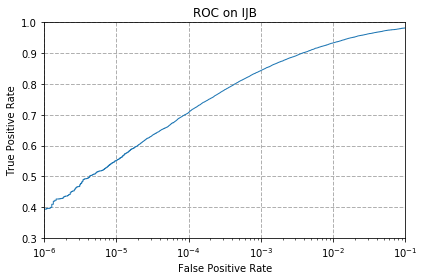

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.393874,0.551516,0.70747,0.843841,0.933374,0.98195,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobacku

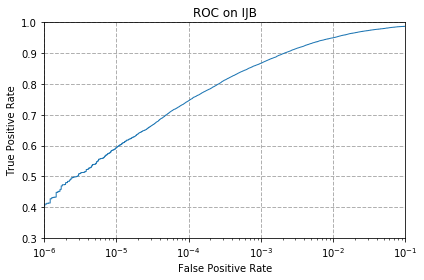

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.410083,0.594007,0.745564,0.867464,0.950095,0.987575,CASIA-WebFace,InceptionResNetV1,CenterLoss,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>> Reload (left) embeddings from: /s/red/b/nobackup

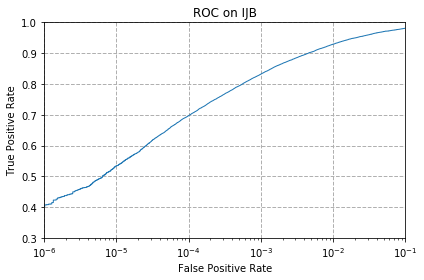

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ridge,0.407527,0.533875,0.697039,0.832132,0.929335,0.980979,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz ...
>>>

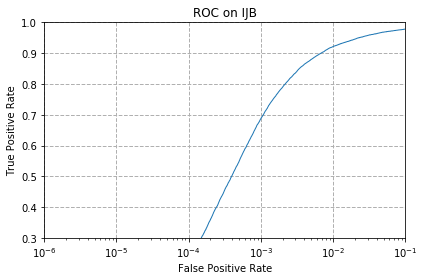

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.008693,0.037276,0.234801,0.687631,0.921614,0.978371,CASIA-WebFace,InceptionResNetV1,CenterLoss,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz

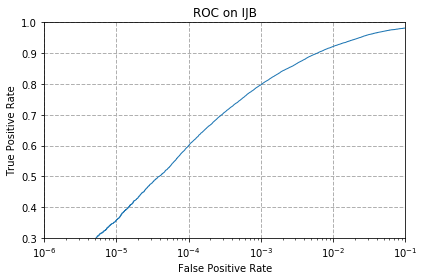

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.186123,0.357468,0.599939,0.797106,0.921716,0.98195,CASIA-WebFace,InceptionResNetV1,CenterLoss,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/casia_ir2_ijbc_embs_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log'

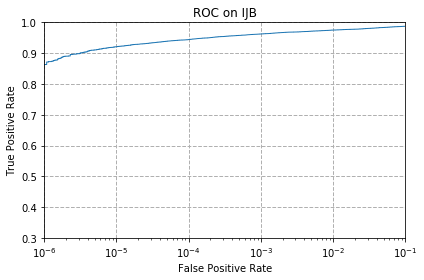

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.863323,0.920796,0.944368,0.962315,0.975098,0.987473,MS1M,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'pr

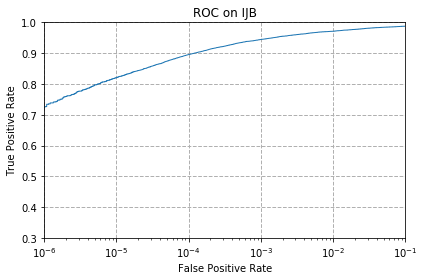

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.726645,0.820525,0.895536,0.944521,0.971315,0.98783,MS1M,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': Fa

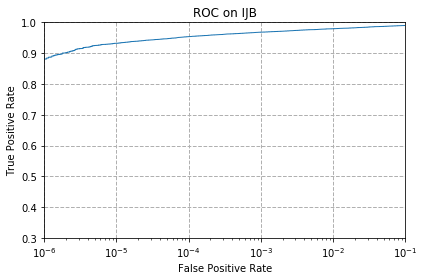

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_ridge,0.881321,0.932147,0.953878,0.968298,0.979496,0.990183,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>

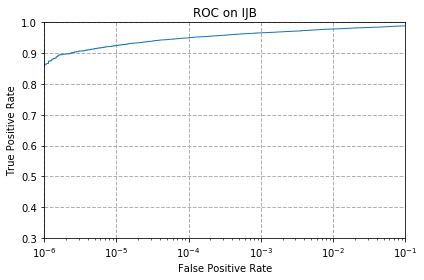

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_ridge,0.864396,0.924937,0.94989,0.966048,0.978729,0.988751,MS1M,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC

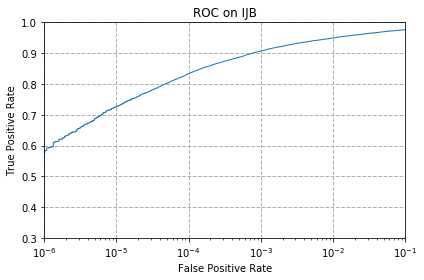

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_ridge,0.583781,0.726645,0.833819,0.907041,0.949583,0.976684,MS1M,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_

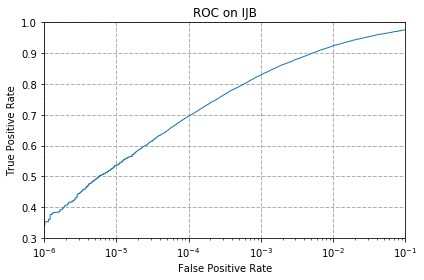

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.352508,0.53587,0.695148,0.828961,0.92417,0.976223,MS1M,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJ

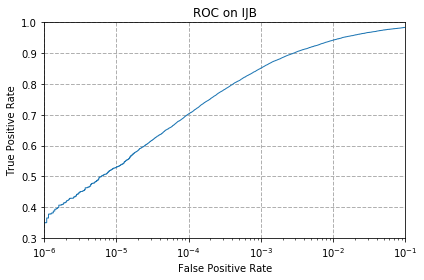

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.349798,0.529478,0.702613,0.851358,0.942425,0.983944,MS1M,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC

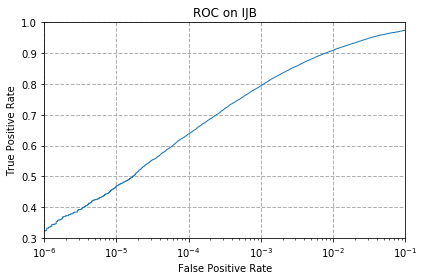

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_ridge,0.324794,0.46863,0.637777,0.794498,0.90924,0.974434,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'p

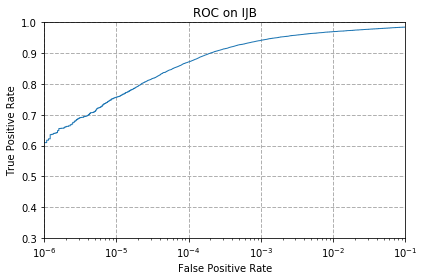

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.609756,0.757171,0.871759,0.941913,0.969883,0.984814,MS1M,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals':

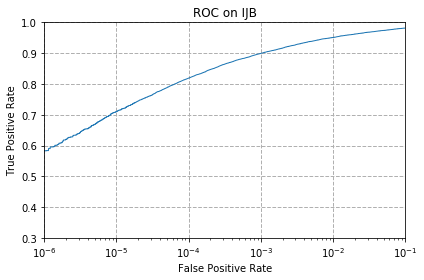

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.583269,0.709771,0.819093,0.899269,0.951066,0.981848,MS1M,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_msarcface_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/MS1MV2-ResNet100-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'pr

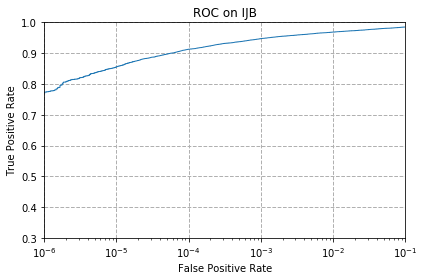

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge,0.773892,0.855857,0.912768,0.947589,0.968605,0.985069,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1MV2,ResNet100,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_MS1MV2-ResNet100-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/VGG2-ResNet50-Arcface_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': Fa

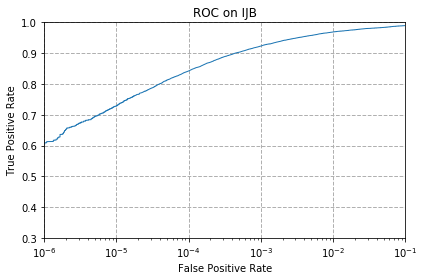

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge,0.609296,0.728486,0.842256,0.923097,0.969116,0.989722,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_VGG2-ResNet50-Arcface_IJBC_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_0.1_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Re

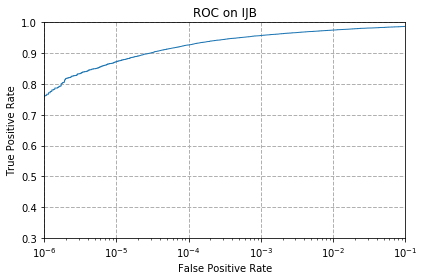

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_ridge,0.763052,0.872169,0.926778,0.957407,0.97515,0.987115,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r0.1


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_0_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/insightface/evaluation/IJB/IJB_result/glint360k_r100FC_1.0_IJBC.npz', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading 

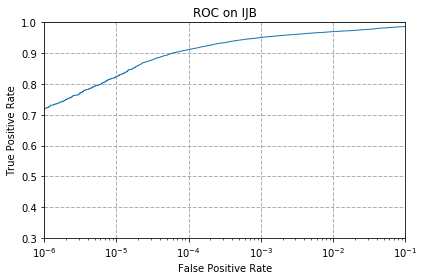

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_ridge,0.721788,0.824308,0.912308,0.951066,0.969883,0.986603,CASIA-WebFace,64-CNN,SphereFace+PFE,Glint360k,ResNet100,PartialFC_r1.0


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_glint360k_r100FC_1_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_res50.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz 

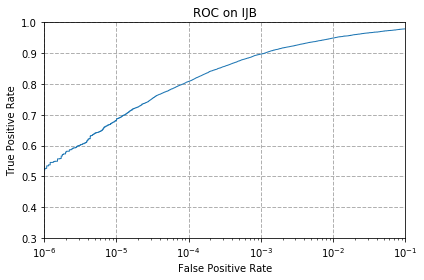

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_ridge,0.526052,0.681649,0.808406,0.897224,0.949276,0.979036,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,ResNet50,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_res50_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/arcface-tf2/ijbc_embs_arc_mbv2.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz .

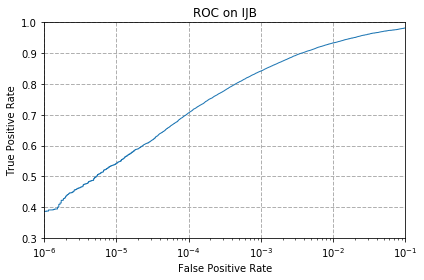

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_ridge,0.386767,0.541392,0.706141,0.842,0.933272,0.982001,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,MobileNetV2,ArcFace


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_arc_mbv2_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/vggface2_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.np

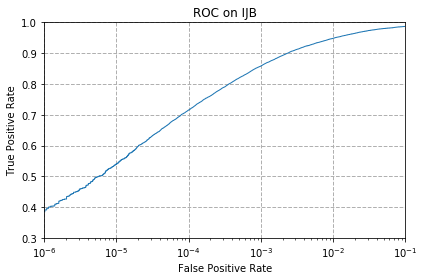

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_ridge,0.391164,0.540011,0.715601,0.858414,0.948305,0.987166,CASIA-WebFace,64-CNN,SphereFace+PFE,VGGFace2,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_vggface2_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/facenet/casia_ir2_ijbc_embs.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': False}
>>>> Reloading from backup: ./IJBC_backup.npz 

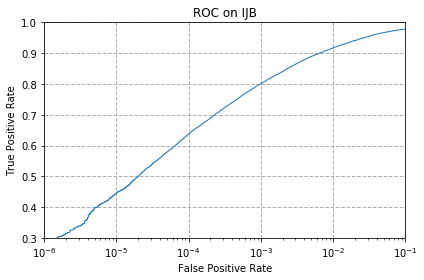

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_ridge,0.277343,0.444598,0.637419,0.801043,0.917216,0.978729,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,InceptionResNetV1,CenterLoss


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_casia_ir2_ijbc_embs_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_msarcface_am.npy', 'fit_mapping': True, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print_log': Fa

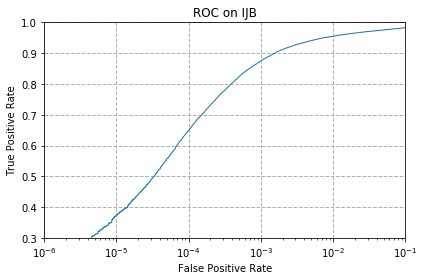

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge,0.176765,0.372399,0.648668,0.874879,0.955106,0.982922,CASIA-WebFace,64-CNN,SphereFace+PFE,MS1M,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_msarcface_am_N11856_ridge.npz.csv
<class '__main__.Args'>: {'subset': 'IJBC', 'is_bunch': False, 'restore_embs_left': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'restore_embs_right': '/s/red/b/nobackup/data/portable/tbiom/models/Probabilistic-Face-Embeddings/ijbc_embs_pfe_sphere64_casia_am.npy', 'fit_mapping': False, 'fit_flips': False, 'decay_coef': 0.001, 'pre_template_map': True, 'is_rotation_map': False, 'is_procrustes': False, 'is_wahba': False, 'explained_variance_proportion': 1.0, 'save_result': '../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz', 'save_embeddings': False, 'model_file': None, 'data_path': './', 'batch_size': 64, 'save_label': False, 'force_reload': False, 'is_one_2_N': False, 'use_face_scores': False, 'plot_only': None, 'n_individuals': -1, 'print

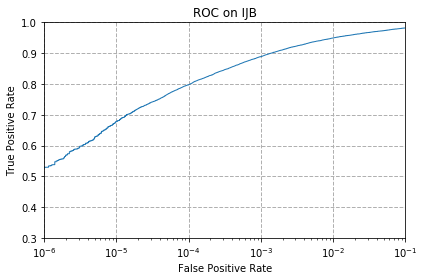

Methods,1e-06,1e-05,0.0001,0.001,0.01,0.1,L_DATASET,L_ARCH,L_HEAD,R_DATASET,R_ARCH,R_HEAD
../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge,0.529631,0.677507,0.797515,0.888838,0.94943,0.982155,CASIA-WebFace,64-CNN,SphereFace+PFE,CASIA-WebFace,64-CNN,SphereFace+PFE


saving to ../../../../results/D0/ijbc_embs_pfe_sphere64_casia_am_TO_ijbc_embs_pfe_sphere64_casia_am_N11856_ridge.npz.csv


In [21]:
for left_embs, left_dataset, left_architecture, left_head in embs_list:
    for right_embs, right_dataset, right_architecture, right_head in embs_list:
        if left_embs == right_embs:
            fit_mapping=False
        else:
            fit_mapping=True

        try:
            #for pre_template_map in pre_template_map:
            save_result_name = '{}_TO_{}_N11856_ridge'.format(left_embs.split('/')[-1].split('.')[0], right_embs.split('/')[-1].split('.')[0])
            save_result = '../../../../results/D0/{}.npz'.format(save_result_name)
            args = Args(subset='IJBC',  
                is_bunch=False,
                restore_embs_left=left_embs,
                restore_embs_right=right_embs,
                fit_mapping=fit_mapping,
                fit_flips=False,
                decay_coef=decay_coef,
                pre_template_map=True,
                is_rotation_map=False,
                is_wahba=False,
                is_procrustes=False,
                use_face_scores=False,
                save_result=save_result)
            df, fig = IJB.main(args)
            df['L_DATASET'] = left_dataset
            df['L_ARCH'] = left_architecture
            df['L_HEAD'] = left_head
            df['R_DATASET'] = right_dataset
            df['R_ARCH'] = right_architecture
            df['R_HEAD'] = right_head
            display(df)
            dataframes[save_result_name] = df
            print('saving to', args.save_result + '.csv')
            df.to_csv(args.save_result + '.csv')
        except Exception:
            traceback.print_exc()